### Importación de las liberías ⬇️

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
import kagglehub
import tensorflow as tf
from tensorflow.keras import layers, Model
import gc
from skimage.feature import local_binary_pattern

### 📂 Descarga y visualización del dataset

Se utilizó el dataset **Brain Tumor Segmentation** de Kaggle, que contiene **3064 pares de imágenes de resonancia magnética (MRI) cerebrales en 2D** y sus respectivas **máscaras binarias** que indican la presencia de tumores. Este conjunto de datos es ideal para tareas de segmentación semántica en el ámbito médico, ya que permite entrenar modelos que identifiquen y delineen regiones tumorales en imágenes cerebrales. :contentReference[oaicite:0]{index=0}

Las imágenes están organizadas en dos carpetas:

- `/images`: contiene las imágenes originales de resonancia magnética.
- `/masks`: contiene las máscaras correspondientes que indican las regiones tumorales.

Se implementaron funciones auxiliares para visualizar imágenes, máscaras y predicciones, facilitando la inspección y validación de los datos. Además, se cargaron las rutas de las imágenes y máscaras en un diccionario y se mostraron algunas muestras aleatorias para verificar la correcta asociación entre cada imagen y su máscara correspondiente.



In [ ]:
# Download latest version
path = kagglehub.dataset_download("nikhilroxtomar/brain-tumor-segmentation")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/brain-tumor-segmentation


In [ ]:
# On this path, all images has two versions: "/images" and "/masks"
# The first one contains the original images, and the second one contains the masks
# that are used to train the model.

# Show 4 examples of images and masks


def show_images(images, titles=None):
    n = len(images)
    plt.figure(figsize=(20, 10))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(images[i])
        if titles is not None:
            plt.title(titles[i])
        plt.axis('off')
    plt.show()
def show_image(image, title=None):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.axis('off')
    plt.show()
def show_image_with_mask(image, mask):
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.axis('off')
    plt.show()

def show_image_with_mask(image, mask):
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.axis('off')
    plt.show()

# Get all images and masks
images_path = os.path.join(path, "images")
masks_path = os.path.join(path, "masks")
images = os.listdir(images_path)
masks = os.listdir(masks_path)



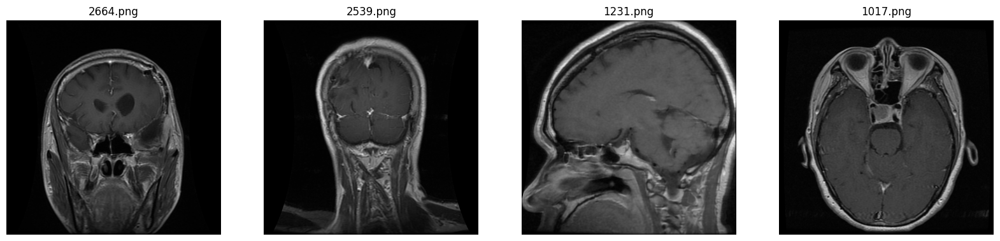

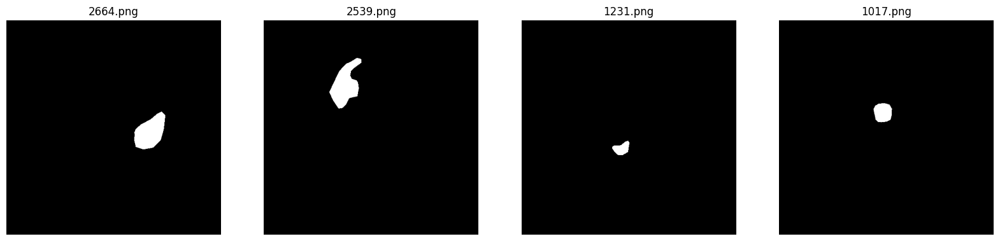

In [ ]:
# Charge images and masks on a dictionary
images_masks = {}
for i in range(len(images)):
    image = images_path
    mask = masks_path
    images_masks[images[i]] = (image, mask)
# Show the first 4 images with their masks
random_images = list(images_masks.keys())[:4]
random_masks = random_images.copy()
for i in range(len(random_masks)):
    random_masks[i] = random_masks[i].replace("image", "mask")

images = []
masks = []
for i in range(len(random_images)):
    image = cv2.imread(os.path.join(images_path, random_images[i]))
    mask = cv2.imread(os.path.join(masks_path, random_masks[i]))
    images.append(image)
    masks.append(mask)
# Show images and masks
show_images(images, random_images)
show_images(masks, random_masks)


### 📊 Preparación del dataset y aumento de datos

Se configuraron los parámetros generales del pipeline de entrenamiento, incluyendo las dimensiones de entrada, proporciones de validación y test, tamaño de batch y semilla de aleatoriedad.

A continuación, se listaron y dividieron los archivos de imagen en tres subconjuntos:
- **Entrenamiento** (70%)
- **Validación** (15%)
- **Test** (15%)

El conjunto de entrenamiento se dividió adicionalmente en dos partes (`train_v1` y `train_v2`) para facilitar el fine-tuning por etapas.

También se definió una función para cargar y preprocesar las imágenes y máscaras:
- Lectura de archivos
- Conversión a escala de grises
- Normalización a valores en \([0, 1]\)
- Redimensionado a \(512 \times 512\)

Se aplicaron técnicas de **data augmentation** para mejorar la generalización del modelo:
- Flips horizontales y verticales
- Rotaciones de 90°
- Cambios aleatorios en brillo y contraste (solo a la imagen)

Finalmente, se crearon los datasets en formato `tf.data.Dataset` para cada partición, con prefetching y batching optimizado para entrenamiento eficiente en GPU.


In [ ]:
# -----------------------------
# Cell 3: Load + Data Augmentation with contrast
# -----------------------------
# -----------------------------
# 1) General parameters
# -----------------------------

image_dir   = os.path.join(path, "images")
mask_dir    = os.path.join(path, "masks")

IMG_HEIGHT  = 512
IMG_WIDTH   = 512

VAL_SPLIT   = 0.15
TEST_SPLIT  = 0.15
SEED        = 42

BATCH_SIZE  = 32
AUTOTUNE    = tf.data.experimental.AUTOTUNE

# -----------------------------
# 2) File listing and splitting
# -----------------------------
all_image_files = sorted(os.listdir(image_dir))
all_image_files = [
    f for f in all_image_files
    if f.lower().endswith((".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"))
]

random.seed(SEED)
random.shuffle(all_image_files)

total_count = len(all_image_files)
num_val     = int(total_count * VAL_SPLIT)
num_test    = int(total_count * TEST_SPLIT)
num_train   = total_count - num_val - num_test

train_files     = all_image_files[:num_train]
val_files       = all_image_files[num_train : num_train + num_val]
test_files      = all_image_files[num_train + num_val : ]

half_idx           = len(train_files) // 2
train_v1_files     = train_files[:half_idx]
train_v2_files     = train_files[half_idx:]

print(f"Total pares (imagen+máscara): {total_count}")
print(f"  - Train V1:     {len(train_v1_files)}")
print(f"  - Train V2:     {len(train_v2_files)}")
print(f"  - Validación:   {len(val_files)}")
print(f"  - Test:         {len(test_files)}")

# -----------------------------
# 3) Load and decode image+mask, normalize to [0,1], and set shape
# -----------------------------
def load_image_and_mask(image_path, mask_path):
    """
    1) Reads the grayscale image from `image_path` (uint8), normalizes to [0,1]
    2) Reads the mask from `mask_path` (uint8), normalizes to [0,1]
    3) Resizes both to (IMG_HEIGHT, IMG_WIDTH)
    Returns (image_norm, mask) as float32 with shape [IMG_HEIGHT, IMG_WIDTH, 1].
    """
    # --- 3.1) Read and decode the original image (uint8), single channel
    img_data = tf.io.read_file(image_path)
    img_uint8 = tf.image.decode_image(img_data, channels=1)   # uint8, shape=(H, W, 1)
    img_uint8.set_shape([None, None, 1])
    # Convert image to float32 in [0,1]
    img = tf.image.convert_image_dtype(img_uint8, tf.float32)  # (H, W, 1), in [0,1]

    # --- 3.2) Read and decode the mask (uint8), using decode_png/jpg
    msk_data = tf.io.read_file(mask_path)
    ext_m = tf.strings.lower(tf.strings.split(mask_path, ".")[-1])

    def _decode_png_m():
        return tf.image.decode_png(msk_data, channels=1)

    def _decode_jpeg_m():
        return tf.image.decode_jpeg(msk_data, channels=1)

    msk_uint8 = tf.cond(
        tf.equal(ext_m, tf.constant("png")),
        true_fn=_decode_png_m,
        false_fn=_decode_jpeg_m
    )  # uint8 with shape=(H, W, 1)
    msk_uint8.set_shape([None, None, 1])
    # Convert mask to float32 in [0,1]
    msk = tf.image.convert_image_dtype(msk_uint8, tf.float32)  # (H, W, 1)

    # --- 3.3) Resize both to (IMG_HEIGHT, IMG_WIDTH)
    img_resized = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    msk_resized = tf.image.resize(msk, [IMG_HEIGHT, IMG_WIDTH])

    return img_resized, msk_resized


# -----------------------------
# 4) Data augmentation (geometry + brightness/contrast)
# -----------------------------
def data_augmentation(image, mask):
    """
    Applies augmentations to image & mask:
      1) Random horizontal flip (50%)
      2) Random vertical flip (50%)
      3) Random rotation by k*90°, k ∈ {0,1,2,3}
      4) Contrast and brightness adjustment ONLY to the image
    Returns (augmented_image, augmented_mask).
    """
    # --- Horizontal flip
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_left_right(image)
        mask  = tf.image.flip_left_right(mask)

    # --- Vertical flip
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_up_down(image)
        mask  = tf.image.flip_up_down(mask)

    # --- Rotation by multiples of 90°
    k = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, k)
    mask  = tf.image.rot90(mask, k)

    # --- Contrast and brightness adjustment on the image
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.image.random_brightness(image, max_delta=0.1)

    return image, mask


# -----------------------------
# 5) Function to create a tf.data.Dataset
# -----------------------------
def make_dataset(file_list, image_dir, mask_dir, augment=False, shuffle_buffer=1000):
    """
    Builds a tf.data.Dataset where each element is (normalized_image, mask),
    both sized (IMG_HEIGHT, IMG_WIDTH, 1) in float32.
      - If augment=True, applies data_augmentation().
      - shuffle_buffer controls how much shuffling (0 → no shuffle).
    """
    image_paths = [os.path.join(image_dir, fname) for fname in file_list]
    mask_paths  = [os.path.join(mask_dir,  fname) for fname in file_list]

    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    if shuffle_buffer and shuffle_buffer > 0:
        ds = ds.shuffle(buffer_size=shuffle_buffer, seed=SEED, reshuffle_each_iteration=True)

    # Map: load + decode + normalize + resize
    ds = ds.map(
        lambda im_pth, m_pth: load_image_and_mask(im_pth, m_pth),
        num_parallel_calls=AUTOTUNE
    )

    # If augment=True, apply augmentation
    if augment:
        ds = ds.map(
            lambda img, msk: data_augmentation(img, msk),
            num_parallel_calls=AUTOTUNE
        )

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(AUTOTUNE)
    return ds


# -----------------------------
# 6) Create the four final datasets (without CLAHE + augmentation)
# -----------------------------
train_v1_ds = make_dataset(
    file_list=train_v1_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,                      # augmentation + brightness/contrast
    shuffle_buffer=len(train_v1_files)
)

train_v2_ds = make_dataset(
    file_list=train_v2_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,
    shuffle_buffer=len(train_v2_files)
)

val_ds = make_dataset(
    file_list=val_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,   # only normalize + resize, no flips or intensity changes
    shuffle_buffer=0
)

test_ds = make_dataset(
    file_list=test_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,   # same as val_ds
    shuffle_buffer=0
)

# -----------------------------
# 7) Quick check
# -----------------------------
for batch_imgs, batch_msks in train_v1_ds.take(1):
    print("Batch imágenes (shape):", batch_imgs.shape)   # (BATCH_SIZE, 512, 512, 1)
    print("Batch máscaras (shape):", batch_msks.shape)  # (BATCH_SIZE, 512, 512, 1)
    break

print("Datasets sin CLAHE y con data augmentation creados correctamente.")


Total pares (imagen+máscara): 3064
  - Train V1:     1073
  - Train V2:     1073
  - Validación:   459
  - Test:         459
Batch imágenes (shape): (32, 512, 512, 1)
Batch máscaras (shape): (32, 512, 512, 1)
Datasets sin CLAHE y con data augmentation creados correctamente.


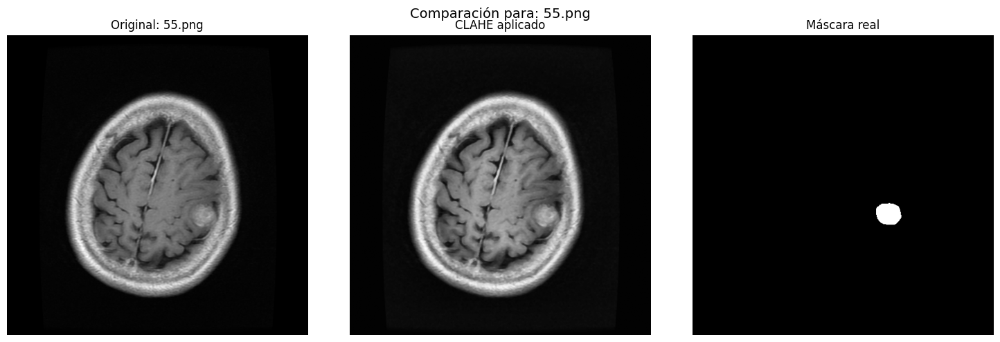

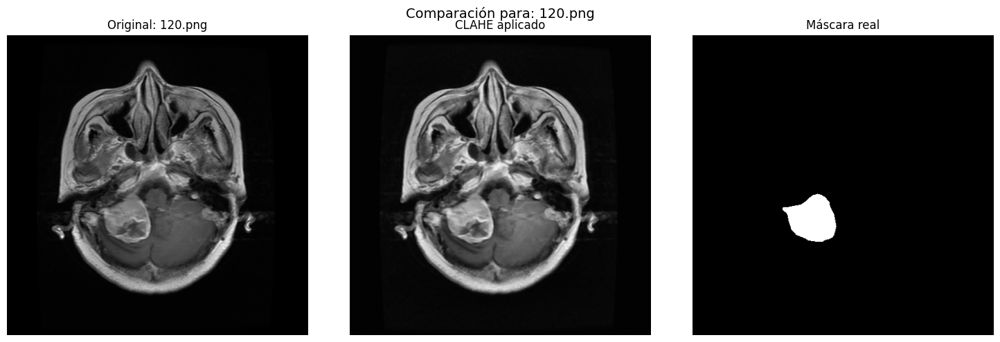

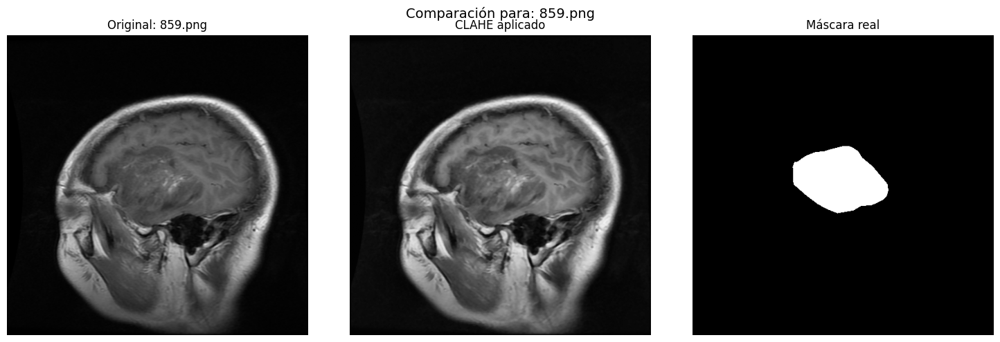

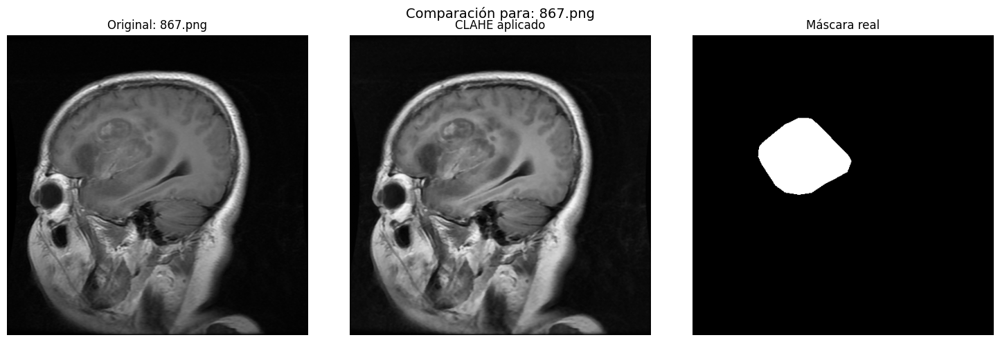

In [ ]:
# -----------------------------
# Intermediate Cell: Visualization of Original Images vs. CLAHE + Masks
# -----------------------------

# 1) Select 4 random images from train_v1_files
muestras = random.sample(train_v1_files, 4)

for fname in muestras:
    img_path  = os.path.join(image_dir, fname)
    mask_path = os.path.join(mask_dir,  fname)  # assume same filename in "masks"

    # 2) Read the image in grayscale (uint8)
    img_orig = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img_orig is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {img_path}")

    # 3) Apply CLAHE with the same parameters used in the pipeline
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8))
    img_clahe = clahe.apply(img_orig)  # uint8, same resolution as img_orig
    # Remove background
    img_clahe = cv2.medianBlur(img_clahe, 3)

    # 4) Read the mask in grayscale (uint8)
    msk_orig = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if msk_orig is None:
        raise FileNotFoundError(f"No se pudo leer la máscara: {mask_path}")

    # 5) Resize all images to (IMG_HEIGHT, IMG_WIDTH)
    img_orig_resized   = cv2.resize(img_orig,  (IMG_WIDTH, IMG_HEIGHT))
    img_clahe_resized  = cv2.resize(img_clahe, (IMG_WIDTH, IMG_HEIGHT))
    msk_resized        = cv2.resize(msk_orig,   (IMG_WIDTH, IMG_HEIGHT))

    # 6) Display the three images side by side
    plt.figure(figsize=(15, 5))

    # Column 1: Original image
    plt.subplot(1, 3, 1)
    plt.imshow(img_orig_resized, cmap="gray", vmin=0, vmax=255)
    plt.title(f"Original: {fname}")
    plt.axis("off")

    # Column 2: CLAHE-applied image
    plt.subplot(1, 3, 2)
    plt.imshow(img_clahe_resized, cmap="gray", vmin=0, vmax=255)
    plt.title("CLAHE aplicado")
    plt.axis("off")

    # Column 3: Ground truth mask
    plt.subplot(1, 3, 3)
    plt.imshow(msk_resized, cmap="gray", vmin=0, vmax=255)
    plt.title("Máscara real")
    plt.axis("off")

    plt.suptitle(f"Comparación para: {fname}", fontsize=14)
    plt.tight_layout()
    plt.show()


### 🧠 Definición del modelo U-Net

Se implementó una arquitectura **U-Net completa** adaptada para imágenes en escala de grises de tamaño \(512 \times 512\), comúnmente utilizada en tareas de **segmentación médica**.

La red está compuesta por:
- 🔻 **Encoder**: bloques de convoluciones con downsampling (MaxPooling), que capturan información espacial progresivamente.
- 🔁 **Bridge**: capa intermedia que actúa como cuello de botella, con mayor profundidad de filtros.
- 🔺 **Decoder**: upsampling con `Conv2DTranspose` y concatenación con los *skip connections* del encoder, lo que ayuda a preservar los detalles espaciales finos.

Cada bloque convolucional aplica dos capas Conv2D con BatchNorm y ReLU. El modelo finaliza con una convolución 1×1 y activación **sigmoide**, ideal para segmentación binaria (tumor vs no tumor).

Se compila el modelo con:
- **Optimización**: `Adam` con tasa de aprendizaje \(1e{-4}\)
- **Pérdida**: `binary_crossentropy`
- **Métricas**: `MeanIoU` y `accuracy`

Este modelo está listo para entrenarse sobre máscaras binarias de segmentación tumoral.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# ---------------------------------------------------
# U-Net input parameters
# ---------------------------------------------------
INPUT_HEIGHT   = 512
INPUT_WIDTH    = 512
INPUT_CHANNELS = 1   # Grayscale

# ---------------------------------------------------
# Two-convolution block (Conv → BatchNorm → ReLU) × 2
# ---------------------------------------------------
def conv_block(x, filters, kernel_size=(3,3), padding="same", strides=1):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(filters, kernel_size, strides=1, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

# ---------------------------------------------------
# Up-convolution + concatenation + conv_block block
# ---------------------------------------------------
def upconv_concat(skip_connection, x, filters, kernel_size=(2,2), strides=(2,2), padding="same"):
    x = layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)(x)
    x = layers.Concatenate()([x, skip_connection])
    x = conv_block(x, filters)
    return x

# ---------------------------------------------------
# Full version of U-Net: final output 512×512
# ---------------------------------------------------
def build_unet_full512(input_shape=(INPUT_HEIGHT, INPUT_WIDTH, INPUT_CHANNELS)):
    inputs = layers.Input(shape=input_shape)                 # 512×512×1

    # ===== Encoder (Downsampling) =====
    # Block C1: 512×512 → 512×512
    c1 = conv_block(inputs, filters=64)                      # 512×512×64
    p1 = layers.MaxPooling2D(pool_size=(2,2))(c1)            # 256×256×64

    # Block C2: 256×256 → 256×256
    c2 = conv_block(p1, filters=128)                         # 256×256×128
    p2 = layers.MaxPooling2D(pool_size=(2,2))(c2)            # 128×128×128

    # Block C3: 128×128 → 128×128
    c3 = conv_block(p2, filters=256)                         # 128×128×256
    p3 = layers.MaxPooling2D(pool_size=(2,2))(c3)            # 64×64×256

    # Block C4: 64×64 → 64×64
    c4 = conv_block(p3, filters=512)                         # 64×64×512
    p4 = layers.MaxPooling2D(pool_size=(2,2))(c4)            # 32×32×512

    # ===== Bridge (Bottleneck) =====
    # 32×32 → 32×32
    c5 = conv_block(p4, filters=1024)                        # 32×32×1024

    # ===== Decoder (Upsampling) =====
    # Up1: 32×32 → 64×64, concat with C4
    u6 = upconv_concat(c4, c5, filters=512)                   # 64×64×512

    # Up2: 64×64 → 128×128, concat with C3
    u7 = upconv_concat(c3, u6, filters=256)                   # 128×128×256

    # Up3: 128×128 → 256×256, concat with C2
    u8 = upconv_concat(c2, u7, filters=128)                   # 256×256×128

    # Up4: 256×256 → 512×512, concat with C1
    u9 = upconv_concat(c1, u8, filters=64)                    # 512×512×64

    # ===== Final 1×1 Conv =====
    # Here we are at 512×512, so output a single channel
    outputs = layers.Conv2D(1, (1,1), activation="sigmoid")(u9)  # 512×512×1

    model = Model(inputs=[inputs], outputs=[outputs], name="U-Net-512")
    return model


unet_model = build_unet_full512(input_shape=(INPUT_HEIGHT, INPUT_WIDTH, INPUT_CHANNELS))
unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.MeanIoU(num_classes=2), "accuracy"]
)
unet_model.summary()


Model: "U-Net-512"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        576 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,864 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,456 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    294,912 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_4[0][0]  

 Total params: 31,048,257 (118.44 MB)

 Trainable params: 31,036,481 (118.39 MB)

 Non-trainable params: 11,776 (46.00 KB)

### 🚀 Entrenamiento del modelo U-Net priorizando IoU

Se entrenó el modelo U-Net en GPU, enfocando la optimización en la métrica **IoU (Intersección sobre Unión)**. Se definieron funciones personalizadas para la métrica y la pérdida (IoU Loss), lo que permitió guiar el aprendizaje hacia una mejor calidad de segmentación.

#### Configuración clave:
- **Pérdida**: `IoU Loss` (1 - IoU continuo)
- **Métrica principal**: `iou_coef` (versión binarizada con umbral 0.5)
- **Batch size reducido**: 8, para evitar errores de memoria
- **Callbacks**: `ModelCheckpoint` (según val_iou_coef) y `ReduceLROnPlateau`

---

### 📈 Evaluación del desempeño

#### Métricas en el conjunto de entrenamiento (`train_v1`, sin augmentación):
- **IoU**: 0.5225
- **Dice**: 0.6864
- **Accuracy (píxel)**: 0.9867

#### Métricas en el conjunto de test:
- **IoU**: 0.3492
- **Dice**: 0.5176
- **Accuracy (píxel)**: 0.9770

---

### 🧠 Reflexión sobre los resultados

El modelo logró **muy buena precisión a nivel de píxeles (cerca del 98%)**, lo cual es típico en problemas de segmentación médica donde el fondo ocupa la mayor parte de la imagen. Sin embargo, esto no implica una buena segmentación del tumor en sí.

Las métricas más representativas para este tipo de tarea son **IoU y Dice**, y en estos indicadores el desempeño fue **aceptable, pero no óptimo**:

- El valor de **IoU ≈ 0.35 en test** indica que el modelo detecta correctamente una parte significativa de las regiones tumorales, pero aún **pierde detalles o bordes**, o **presenta falsos positivos**.
- El **Dice coefficient ≈ 0.51** refleja que el solapamiento entre predicción y verdad es moderado, pero hay espacio para mejorar la coherencia de las máscaras.

El hecho de que en entrenamiento se obtuviera una IoU ≈ 0.52 sugiere que el modelo sí es capaz de aprender patrones significativos, pero probablemente **no generaliza tan bien** al conjunto de test, lo que puede deberse a:

- Limitaciones en la arquitectura base (sin atención o contextos globales).
- Aumento de datos limitado (solo flips, rotaciones, brillo y contraste).
- Posible desbalance en la proporción de imágenes con y sin tumor.

---

### 🖼️ Visualización de predicciones

Las predicciones visualizadas muestran que el modelo es capaz de **detectar correctamente las regiones más evidentes del tumor**, pero en algunos casos **omite zonas pequeñas** o **predice bordes difusos**. Aun así, la segmentación es **coherente y útil como punto de partida clínico o de postprocesamiento**.

---

### 🧪 Conclusión

El modelo U-Net entrenado con pérdida basada en IoU muestra un rendimiento competitivo, aunque **mejorable en precisión de segmentación tumoral**. Esto abre la puerta a probar variantes más avanzadas como:

- U-Net con **bloques de atención**
- Incorporación de **contexto multiescala**
- Aumentos más complejos o basados en técnicas generativas
- Uso de técnicas de postprocesamiento como CRF



In [ ]:
# -----------------------------
# Cell 5 (improved): Training on GPU prioritizing IoU
# -----------------------------

# 1) Check for GPU and enable memory growth (to avoid OOM)
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPU detectada y memory growth habilitado: {[gpu.name for gpu in gpus]}")
    except RuntimeError as e:
        print("No se pudo habilitar memory growth:", e)
else:
    print("No se detectó GPU. Se usará CPU.")

# 2) Define IoU metric and IoU loss
smooth = 1e-6

def iou_coef(y_true, y_pred):
    """
    IoU (Jaccard) metric. Binarizes with threshold 0.5 for metric calculation.
    """
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred_bin, axis=[1,2,3])
    union = tf.reduce_sum(y_true + y_pred_bin, axis=[1,2,3]) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return tf.reduce_mean(iou)

def iou_loss(y_true, y_pred):
    """
    IoU loss (1 − IoU) using continuous prediction to maintain differentiability.
    """
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    union = tf.reduce_sum(y_true + y_pred, axis=[1,2,3]) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return 1.0 - tf.reduce_mean(iou)

# 3) Clear previous session (just in case) and free memory
tf.keras.backend.clear_session()
gc.collect()


# 5) Compile the model with IoU loss and IoU metric
unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=iou_loss,
    metrics=[iou_coef, "accuracy"]
)

# 6) Prepare datasets with a reduced batch size if still encountering OOM
#    Assume train_v1_ds and val_ds exist. If not, move their creation here.
batch_size_reducido = 8  # Adjust to 8, 4, or 2 depending on your GPU memory

train_v1_ds_small = (
    train_v1_ds
    .unbatch()
    .batch(batch_size_reducido)
    .prefetch(tf.data.experimental.AUTOTUNE)
)

val_ds_small = (
    val_ds
    .unbatch()
    .batch(batch_size_reducido)
    .prefetch(tf.data.experimental.AUTOTUNE)
)

# 7) Callbacks: monitor val_iou_coef to save the best model
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath="unet_gpu_best_iou.h5",
    save_best_only=True,
    monitor="val_iou_coef",
    mode="max",
    verbose=1
)

reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    verbose=1
)

# 8) Start training
EPOCHS = 60

history = unet_model.fit(
    train_v1_ds_small,   # V1 dataset with reduced batch size
    validation_data=val_ds_small,
    epochs=EPOCHS,
    callbacks=[checkpoint_cb, reduce_lr_cb]
)

print("Entrenamiento finalizado. El mejor modelo (según IoU en validación) está en 'unet_gpu_best_iou.h5'.")


No se pudo habilitar memory growth: Physical devices cannot be modified after being initialized
Epoch 1/60


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 1))
  warnings.warn(msg)


    135/Unknown 101s 280ms/step - accuracy: 0.6044 - iou_coef: 0.0380 - loss: 0.9709

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 1: val_iou_coef improved from -inf to 0.00259, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 114s 378ms/step - accuracy: 0.6042 - iou_coef: 0.0380 - loss: 0.9709 - val_accuracy: 0.9817 - val_iou_coef: 0.0026 - val_loss: 0.9825 - learning_rate: 1.0000e-05
Epoch 2/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.6404 - iou_coef: 0.0494 - loss: 0.9587
Epoch 2: val_iou_coef improved from 0.00259 to 0.01377, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.6411 - iou_coef: 0.0496 - loss: 0.9586 - val_accuracy: 0.9587 - val_iou_coef: 0.0138 - val_loss: 0.9807 - learning_rate: 1.0000e-05
Epoch 3/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7867 - iou_coef: 0.0995 - loss: 0.9391
Epoch 3: val_iou_coef improved from 0.01377 to 0.02862, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 201ms/step - accuracy: 0.7866 - iou_coef: 0.0996 - loss: 0.9391 - val_accuracy: 0.6981 - val_iou_coef: 0.0286 - val_loss: 0.9794 - learning_rate: 1.0000e-05
Epoch 4/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7804 - iou_coef: 0.1124 - loss: 0.9292
Epoch 4: val_iou_coef improved from 0.02862 to 0.05329, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7805 - iou_coef: 0.1126 - loss: 0.9291 - val_accuracy: 0.6421 - val_iou_coef: 0.0533 - val_loss: 0.9595 - learning_rate: 1.0000e-05
Epoch 5/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.8022 - iou_coef: 0.1510 - loss: 0.9139
Epoch 5: val_iou_coef improved from 0.05329 to 0.11553, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.8019 - iou_coef: 0.1509 - loss: 0.9139 - val_accuracy: 0.8724 - val_iou_coef: 0.1155 - val_loss: 0.9301 - learning_rate: 1.0000e-05
Epoch 6/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7719 - iou_coef: 0.1497 - loss: 0.9104
Epoch 6: val_iou_coef improved from 0.11553 to 0.16324, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7720 - iou_coef: 0.1499 - loss: 0.9103 - val_accuracy: 0.9067 - val_iou_coef: 0.1632 - val_loss: 0.9002 - learning_rate: 1.0000e-05
Epoch 7/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7546 - iou_coef: 0.1831 - loss: 0.8892
Epoch 7: val_iou_coef improved from 0.16324 to 0.31763, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7546 - iou_coef: 0.1829 - loss: 0.8893 - val_accuracy: 0.9714 - val_iou_coef: 0.3176 - val_loss: 0.8581 - learning_rate: 1.0000e-05
Epoch 8/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7557 - iou_coef: 0.1982 - loss: 0.8885
Epoch 8: val_iou_coef did not improve from 0.31763
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.7557 - iou_coef: 0.1984 - loss: 0.8884 - val_accuracy: 0.8263 - val_iou_coef: 0.1271 - val_loss: 0.9081 - learning_rate: 1.0000e-05
Epoch 9/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.7431 - iou_coef: 0.2054 - loss: 0.8771
Epoch 9: val_iou_coef improved from 0.31763 to 0.34237, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7431 - iou_coef: 0.2054 - loss: 0.8771 - val_accuracy: 0.9743 - val_iou_coef: 0.3424 - val_loss: 0.8365 - learning_rate: 1.0000e-05
Epoch 10/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7474 - iou_coef: 0.2067 - loss: 0.8682
Epoch 10: val_iou_coef did not improve from 0.34237
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.7474 - iou_coef: 0.2067 - loss: 0.8681 - val_accuracy: 0.9560 - val_iou_coef: 0.2887 - val_loss: 0.8237 - learning_rate: 1.0000e-05
Epoch 11/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7403 - iou_coef: 0.2184 - loss: 0.8631
Epoch 11: val_iou_coef did not improve from 0.34237
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.7403 - iou_coef: 0.2185 - loss: 0.8630 - val_accuracy: 0.9620 - val_iou_coef: 0.3238 - val_loss: 0.8183 - learning_rate: 1.0000e-05
Epoch 12/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7359 - iou_coef: 0.2249 - loss: 0.8572
Ep

135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7358 - iou_coef: 0.2249 - loss: 0.8572 - val_accuracy: 0.9726 - val_iou_coef: 0.3590 - val_loss: 0.8010 - learning_rate: 1.0000e-05
Epoch 13/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7249 - iou_coef: 0.2214 - loss: 0.8524
Epoch 13: val_iou_coef improved from 0.35899 to 0.38319, saving model to unet_gpu_best_iou.h5


135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7250 - iou_coef: 0.2216 - loss: 0.8523 - val_accuracy: 0.9808 - val_iou_coef: 0.3832 - val_loss: 0.8015 - learning_rate: 1.0000e-05
Epoch 14/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7609 - iou_coef: 0.2347 - loss: 0.8437
Epoch 14: val_iou_coef did not improve from 0.38319
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.7608 - iou_coef: 0.2350 - loss: 0.8436 - val_accuracy: 0.9509 - val_iou_coef: 0.2923 - val_loss: 0.8022 - learning_rate: 1.0000e-05
Epoch 15/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.7630 - iou_coef: 0.2341 - loss: 0.8394
Epoch 15: val_iou_coef did not improve from 0.38319

Epoch 15: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.7631 - iou_coef: 0.2343 - loss: 0.8393 - val_accuracy: 0.8941 - val_iou_coef: 0.1932 - val_loss: 0.8490 - learning_rate: 1.0000e-05
Epoch 16/60
134/135 ━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.7972 - iou_coef: 0.2666 - loss: 0.8194 - val_accuracy: 0.9783 - val_iou_coef: 0.4268 - val_loss: 0.7448 - learning_rate: 5.0000e-06
Epoch 20/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8138 - iou_coef: 0.2892 - loss: 0.8070
Epoch 20: val_iou_coef did not improve from 0.42679
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.8138 - iou_coef: 0.2891 - loss: 0.8071 - val_accuracy: 0.9720 - val_iou_coef: 0.3919 - val_loss: 0.7410 - learning_rate: 5.0000e-06
Epoch 21/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8153 - iou_coef: 0.2744 - loss: 0.8120
Epoch 21: val_iou_coef did not improve from 0.42679
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.8153 - iou_coef: 0.2744 - loss: 0.8121 - val_accuracy: 0.9694 - val_iou_coef: 0.3662 - val_loss: 0.7471 - learning_rate: 5.0000e-06
Epoch 22/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8283 - iou_coef: 0.2739 - loss: 0.8103
Ep

135/135 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.8406 - iou_coef: 0.3152 - loss: 0.7902 - val_accuracy: 0.9832 - val_iou_coef: 0.4687 - val_loss: 0.7209 - learning_rate: 2.5000e-06
Epoch 26/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8291 - iou_coef: 0.3071 - loss: 0.7944
Epoch 26: val_iou_coef did not improve from 0.46868
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.8291 - iou_coef: 0.3071 - loss: 0.7944 - val_accuracy: 0.9612 - val_iou_coef: 0.3555 - val_loss: 0.7545 - learning_rate: 2.5000e-06
Epoch 27/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8332 - iou_coef: 0.3245 - loss: 0.7876
Epoch 27: val_iou_coef did not improve from 0.46868
135/135 ━━━━━━━━━━━━━━━━━━━━ 26s 195ms/step - accuracy: 0.8331 - iou_coef: 0.3243 - loss: 0.7877 - val_accuracy: 0.9617 - val_iou_coef: 0.3697 - val_loss: 0.7555 - learning_rate: 2.5000e-06
Epoch 28/60
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.8399 - iou_coef: 0.3022 - loss: 0.7932
Ep

In [ ]:
# 5) Eval the best model
test_metrics = unet_model.evaluate(test_ds)
print("Resultados en test:", dict(zip(unet_model.metrics_names, test_metrics)))

15/15 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9772 - iou_coef: 0.4312 - loss: 0.7339
Resultados en test: {'loss': 0.7438888549804688, 'compile_metrics': 0.42405208945274353}


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 512, 512, 1))
  warnings.warn(msg)


34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step
=== Métricas globales en train_v1 (sin augmentación) ===
IoU   = 0.5225
Dice  = 0.6864
Accuracy (píxel) = 0.9867


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 512, 512, 1))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


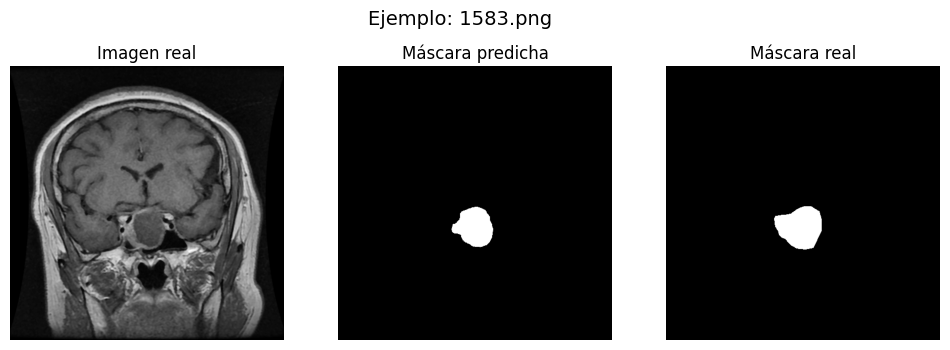

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


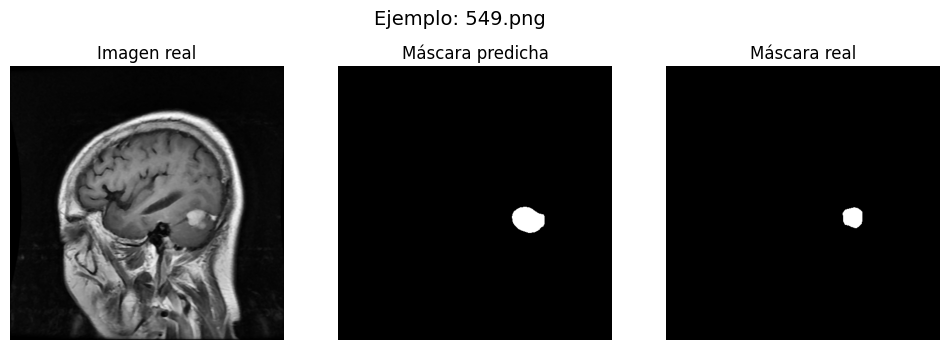

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


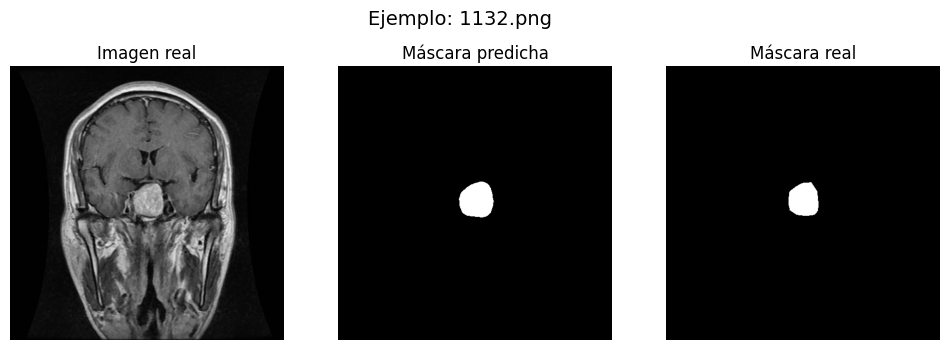

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


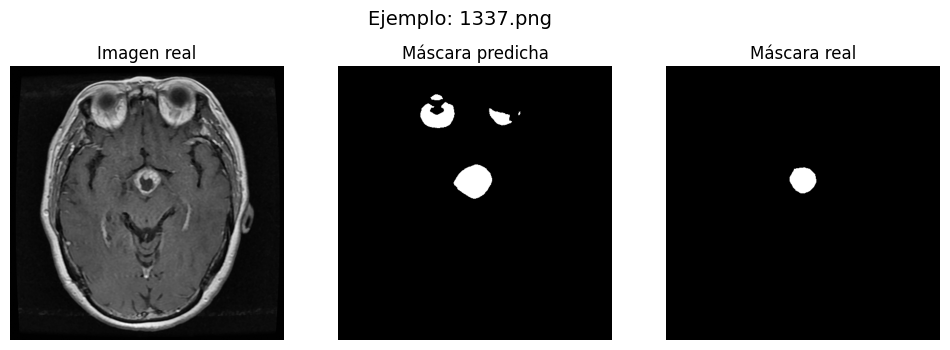

In [ ]:
# -----------------------------
# Cell 6: Predictions, metrics, and example visualization on training data
# -----------------------------


# 1) Build an evaluation dataset ON train_v1, BUT WITHOUT augmentation
#    so that the images remain the originals (resized to 256×256).
train_v1_eval_ds = make_dataset(
    file_list=train_v1_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,
    shuffle_buffer=0    # no shuffling for evaluation
)

# 2) Run the model on the entire train_v1_eval_ds to get predictions
#    "preds" will have shape (N, 256, 256, 1), with values in [0,1].
preds = unet_model.predict(train_v1_eval_ds)

# 3) Collect the ground-truth masks from the same dataset
y_trues = []
for _, y_batch in train_v1_eval_ds:
    # y_batch: float32 tensor with shape (batch_size, 256,256,1), values in [0,1]
    y_trues.append(y_batch.numpy())
y_trues = np.concatenate(y_trues, axis=0)   # final shape: (N, 256,256,1)

# 4) Binarize the predicted and true masks using a threshold of 0.5
pred_bin = (preds > 0.5).astype(np.int32)    # now contains 0 or 1
y_bin    = (y_trues > 0.5).astype(np.int32)  # likewise

# 5) Compute global metrics over the ENTIRE train_v1 set
#    Flatten (combine all pixels into a single vector) for IoU, Dice, Accuracy
pred_flat = pred_bin.reshape(-1)   # vector of 0/1 of length N * 256 * 256
true_flat = y_bin.reshape(-1)

# Intersection and union for IoU
intersection = np.logical_and(pred_flat, true_flat).sum()
union        = np.logical_or(pred_flat, true_flat).sum()
iou   = intersection / union if union != 0 else 0.0

# Dice coefficient (F1) = 2 * (|pred ∩ true|) / (|pred| + |true|)
sum_pred = pred_flat.sum()
sum_true = true_flat.sum()
dice = 2 * intersection / (sum_pred + sum_true) if (sum_pred + sum_true) != 0 else 0.0

# Pixel accuracy
accuracy = (pred_flat == true_flat).sum() / len(true_flat)

print("=== Métricas globales en train_v1 (sin augmentación) ===")
print(f"IoU   = {iou:.4f}")
print(f"Dice  = {dice:.4f}")
print(f"Accuracy (píxel) = {accuracy:.4f}")


# 6) Display 4 random examples: real image, predicted mask, and true mask
#    We'll use train_v1_files to pick 4 filenames at random.
n_ejemplos = 4
muestras = random.sample(train_v1_files, n_ejemplos)

for fname in muestras:
    # 6.1) Load the “genuine” image and mask (without augmentation or batching)
    img_path  = os.path.join(image_dir, fname)
    mask_path = os.path.join(mask_dir,  fname)

    # load_image_and_mask returns a pair (image, mask) already resized to 256×256 and normalized to [0,1]
    img_tensor, msk_tensor = load_image_and_mask(img_path, mask_path)

    # 6.2) Perform inference on this single image:
    #      `img_tensor` has shape (256,256,1); expand dims to (1,256,256,1)
    img_input = tf.expand_dims(img_tensor, axis=0)  # shape → (1,256,256,1)
    pred      = unet_model.predict(img_input)[0]     # take the first (and only) element → shape (256,256,1)

    # 6.3) Binarize the prediction with threshold 0.5
    pred_mask_bin = (pred > 0.5).astype(np.float32)  # 0.0 or 1.0, shape (256,256,1)

    # 6.4) Convert tensors to 2D numpy arrays for display with matplotlib
    img_np     = img_tensor.numpy().squeeze()           # shape (256,256)
    msk_np     = msk_tensor.numpy().squeeze()           # shape (256,256)
    pred_np    = pred_mask_bin.squeeze()                # shape (256,256)

    # 6.5) Plot: 1 row × 3 columns
    plt.figure(figsize=(12, 4))

    # Column 1: real image (grayscale)
    plt.subplot(1, 3, 1)
    plt.imshow(img_np, cmap="gray")
    plt.title("Imagen real")
    plt.axis("off")

    # Column 2: predicted mask (binary)
    plt.subplot(1, 3, 2)
    plt.imshow(pred_np, cmap="gray")
    plt.title("Máscara predicha")
    plt.axis("off")

    # Column 3: true mask (ground truth)
    plt.subplot(1, 3, 3)
    plt.imshow(msk_np, cmap="gray")
    plt.title("Máscara real")
    plt.axis("off")

    plt.suptitle(f"Ejemplo: {fname}", fontsize=14)
    plt.show()


15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step
=== Métricas sobre TEST ===
IoU (test)      = 0.3492
Dice (test)     = 0.5176
Accuracy (test) = 0.9770


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 512, 512, 1))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


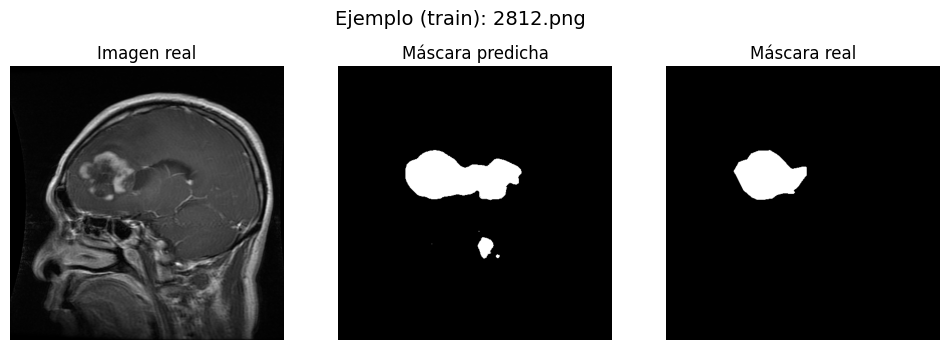

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


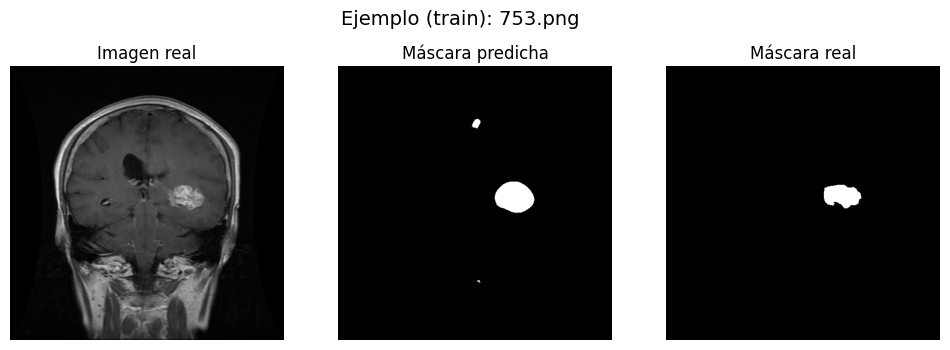

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


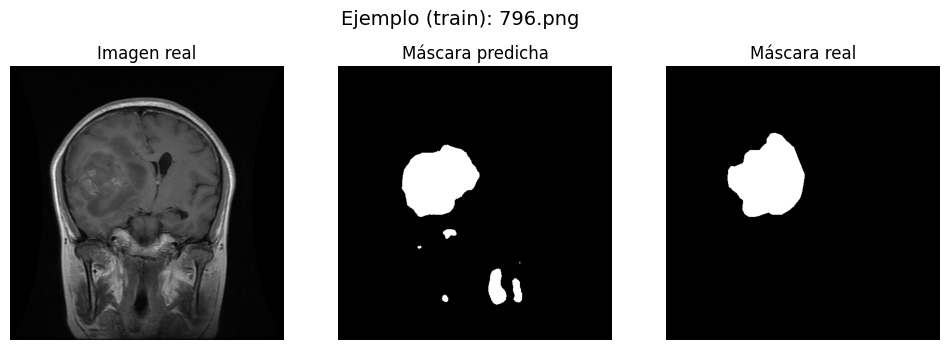

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


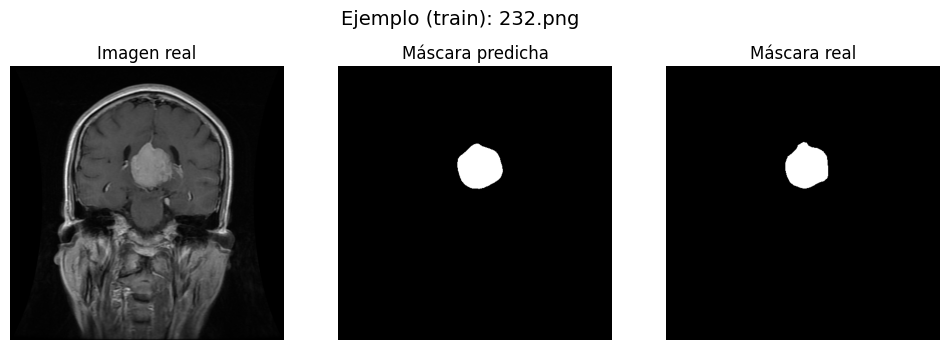

In [ ]:
# -----------------------------
# Cell 6 (Option A):
#   - IoU/Dice/Accuracy metrics on test_ds
#   - Show 4 random examples from train_v1 (real image + predicted mask + real mask)
# -----------------------------

# Input parameters for consistency (although load_image_and_mask uses them internally)
IMG_HEIGHT   = 512
IMG_WIDTH    = 512
INPUT_CHANNELS = 1


# --- PART 1: Metrics on test_ds (TEST set) ---
# test_ds comes from Cell 3 (no augmentation, batch=32, prefetch).
# Predictions:
preds_test = unet_model.predict(test_ds)  # shape = (N_test, 256,256,1)

# Gather the true masks from test_ds
y_trues_test = []
for _, y_batch in test_ds:
    y_trues_test.append(y_batch.numpy())
y_trues_test = np.concatenate(y_trues_test, axis=0)  # (N_test, 256,256,1)

# Binarize with threshold 0.5
preds_bin_test = (preds_test > 0.5).astype(np.int32).reshape(-1)
y_bin_test     = (y_trues_test > 0.5).astype(np.int32).reshape(-1)

# Compute metrics
intersection_test = np.logical_and(preds_bin_test, y_bin_test).sum()
union_test        = np.logical_or (preds_bin_test, y_bin_test).sum()
iou_test   = intersection_test / union_test if union_test != 0 else 0.0

sum_pred_test = preds_bin_test.sum()
sum_true_test = y_bin_test.sum()
dice_test = 2 * intersection_test / (sum_pred_test + sum_true_test) if (sum_pred_test + sum_true_test) != 0 else 0.0

accuracy_test = (preds_bin_test == y_bin_test).sum() / len(y_bin_test)

print("=== Métricas sobre TEST ===")
print(f"IoU (test)      = {iou_test:.4f}")
print(f"Dice (test)     = {dice_test:.4f}")
print(f"Accuracy (test) = {accuracy_test:.4f}")


# --- PART 2: Show 4 random examples from TRAINING (train_v1_files) ---
n_ejemplos = 4
muestras = random.sample(train_v1_files, n_ejemplos)

for fname in muestras:
    # Load real image + mask (no augmentation, resized to 256×256)
    img_path  = os.path.join(image_dir, fname)
    mask_path = os.path.join(mask_dir,  fname)

    img_tensor, msk_tensor = load_image_and_mask(img_path, mask_path)
    # img_tensor, msk_tensor have shape (256, 256, 1), values in [0,1]

    # Predict on this individual image
    img_input = tf.expand_dims(img_tensor, axis=0)        # (1,256,256,1)
    pred      = unet_model.predict(img_input)[0]          # (256,256,1)
    pred_bin  = (pred > 0.5).astype(np.float32).squeeze()  # (256,256), 0.0/1.0

    # Convert to numpy for plotting
    img_np  = img_tensor.numpy().squeeze()  # (256,256)
    msk_np  = msk_tensor.numpy().squeeze()  # (256,256)

    plt.figure(figsize=(12, 4))

    # Column 1: Real image in grayscale
    plt.subplot(1, 3, 1)
    plt.imshow(img_np, cmap="gray")
    plt.title("Imagen real")
    plt.axis("off")

    # Column 2: Predicted mask (binary)
    plt.subplot(1, 3, 2)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Máscara predicha")
    plt.axis("off")

    # Column 3: Real mask (ground truth)
    plt.subplot(1, 3, 3)
    plt.imshow(msk_np, cmap="gray")
    plt.title("Máscara real")
    plt.axis("off")

    plt.suptitle(f"Ejemplo (train): {fname}", fontsize=14)
    plt.show()


### 🧪 Iteración exploratoria: filtrado de imágenes cerebrales

Antes de entrenar un nuevo modelo, se realizó una exploración visual y experimental utilizando distintas **técnicas de preprocesamiento** aplicadas sobre las regiones cerebrales segmentadas. El objetivo fue mejorar la calidad de las características visuales relevantes (bordes, texturas internas) para facilitar la posterior segmentación de tumores.

---

#### 🧠 Segmentación del cerebro (pre-filtro)
Se aplicó un pipeline de procesamiento morfológico sobre las imágenes originales:
1. Conversión a escala de grises.
2. Suavizado con filtro gaussiano.
3. Umbralización con Otsu.
4. Cierre y apertura morfológica.
5. Extracción del contorno principal (cerebro).
6. Aplicación de la máscara para eliminar el fondo.

---

#### 🔍 Filtros aplicados

Se evaluaron los siguientes enfoques sobre la región cerebral ya aislada:

- **CLAHE**: mejora el contraste local y revela estructuras internas suaves.
- **Sobel**: resalta bordes y contornos marcados mediante gradientes.
- **Gabor**: destaca patrones de textura orientada (frecuencias y direcciones).
- **Difference of Gaussians (DoG)**: enfatiza detalles intermedios mediante la resta de dos suavizados con distintas sigmas.

Las imágenes filtradas fueron visualizadas en paralelo con sus máscaras originales para evaluar cuál técnica resaltaba mejor las características relevantes para la detección del tumor.

---

### 🤔 Reflexión

Este análisis mostró que:
- **CLAHE** mejora el contraste en regiones planas, pero puede introducir ruido visual.
- **Sobel** es útil para detectar bordes, pero no siempre distingue tumor de tejido sano.
- **Gabor** resalta patrones texturales, pero depende mucho de la orientación y puede amplificar el ruido.
- **DoG** ofreció un mejor equilibrio entre detección de bordes suaves y reducción de ruido.

Este experimento guiado visualmente fue clave para elegir **DoG** como técnica principal de realce en la siguiente iteración del modelo, reemplazando a Gabor por su menor sensibilidad al ruido y mayor simplicidad.

---

💡 *Este tipo de preprocesamiento puede influir significativamente en el rendimiento de un modelo de segmentación, especialmente cuando se entrena desde cero o con poca regularización.*


In [ ]:
# Base parameters for the Gabor bank
ksize = 31                # Kernel size (31×31)
sigma = 4.0               # Standard deviation of the Gaussian
gamma = 0.5               # Aspect ratio
psi   = 0                 # Phase offset


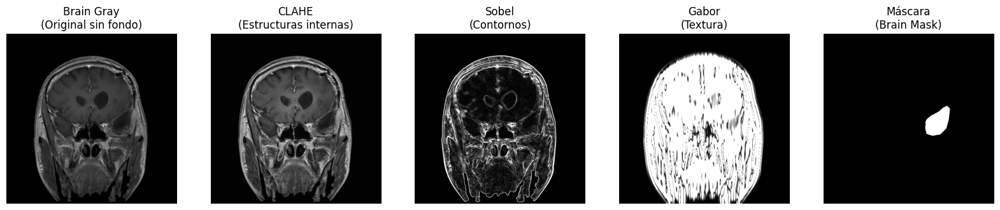

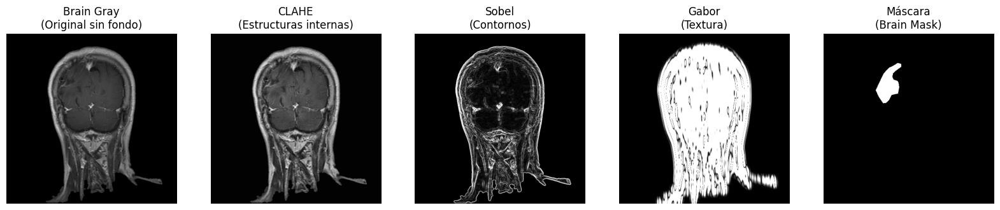

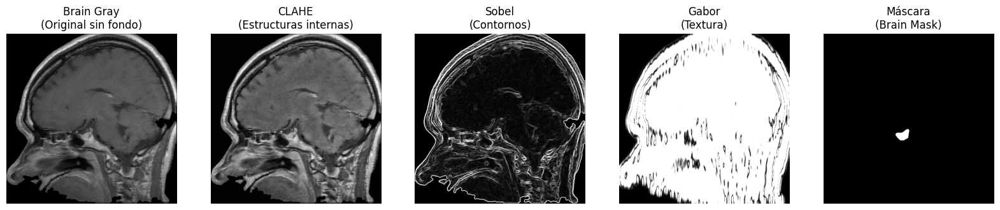

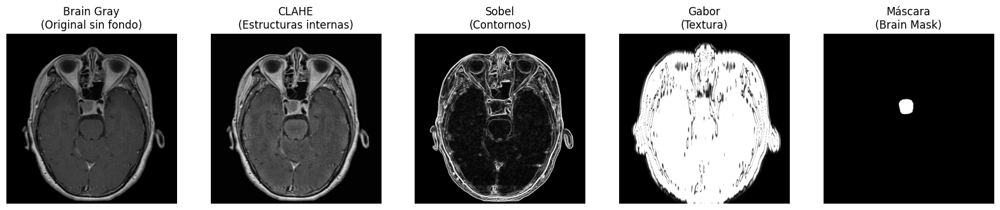

In [ ]:
# Lists to store results
list_brain_gray = []
list_clahe = []
list_sobel = []
list_gabor = []
list_masks_bin = []

for idx, img_name in enumerate(random_images):
    # Load the image
    img = cv2.imread(os.path.join(images_path, img_name))
    if img is None:
        print(f"Error loading image: {img_name}")
        continue

    # 1. Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2. Smooth with Gaussian to reduce noise before segmentation
    blur = cv2.GaussianBlur(gray, (7, 7), 0)

    # 3. Otsu thresholding to segment brain vs. background
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # thresh = cv2.bitwise_not(thresh)  # if needed

    # 4. Morphological operations to close holes and remove artifacts
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=1)

    # 5. Find contours and keep the largest one (brain)
    contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_brain = np.zeros_like(gray)
    if contours:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        cv2.drawContours(mask_brain, [contours[0]], -1, 255, -1)

    # 6. Create a 3-channel mask and apply it to keep only the brain in color
    mask_rgb = cv2.merge([mask_brain, mask_brain, mask_brain])
    brain_only_color = cv2.bitwise_and(img, mask_rgb)

    # 7. Convert the brain region to grayscale (brain_gray) for filtering
    brain_gray = cv2.cvtColor(brain_only_color, cv2.COLOR_BGR2GRAY)

    # **Filter 1: CLAHE (enhance internal structures)**
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(23, 23))
    clahe_img = clahe.apply(brain_gray)

    # **Filter 2: Sobel (edge detection)**
    grad_x = cv2.Sobel(brain_gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(brain_gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = cv2.magnitude(grad_x, grad_y)
    sobel_edges = cv2.convertScaleAbs(mag)

    # **Filter 3: Gabor (texture enhancement)**
    ksize = 31               # kernel size
    sigma = 4.0              # standard deviation of the Gaussian
    theta = 0                # orientation (in radians), 0 = horizontal
    lambd = 10.0             # wavelength of the sinusoidal factor
    gamma = 0.5              # spatial aspect ratio
    psi = 0                  # phase offset
    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
    gabor_resp = cv2.filter2D(brain_gray, cv2.CV_32F, kernel)
    gabor_abs = cv2.convertScaleAbs(gabor_resp)  # for visualization

    # Load the binary mask for this image
    mask = cv2.imread(os.path.join(masks_path, img_name), cv2.COLOR_GRAY2BGR)

    # Convert everything to BGR at the end
    brain_gray = cv2.cvtColor(brain_gray, cv2.COLOR_GRAY2BGR)
    clahe_img = cv2.cvtColor(clahe_img, cv2.COLOR_GRAY2BGR)
    sobel_edges = cv2.cvtColor(sobel_edges, cv2.COLOR_GRAY2BGR)
    gabor_abs = cv2.cvtColor(gabor_abs, cv2.COLOR_GRAY2BGR)

    # Store results
    list_brain_gray.append(brain_gray)
    list_clahe.append(clahe_img)
    list_sobel.append(sobel_edges)
    list_gabor.append(gabor_abs)
    list_masks_bin.append(mask)

# Function to display comparison by image
def show_comparison(index):
    imgs = [
        list_brain_gray[index],
        list_clahe[index],
        list_sobel[index],
        list_gabor[index],
        list_masks_bin[index]
    ]
    titles = [
        "Brain Gray\n(Original without background)",
        "CLAHE\n(Internal structures)",
        "Sobel\n(Edges)",
        "Gabor\n(Texture)",
        "Mask\n(Brain Mask)"
    ]
    show_images(imgs, titles)

# Display comparison for all processed images
for i in range(len(list_brain_gray)):
    show_comparison(i)

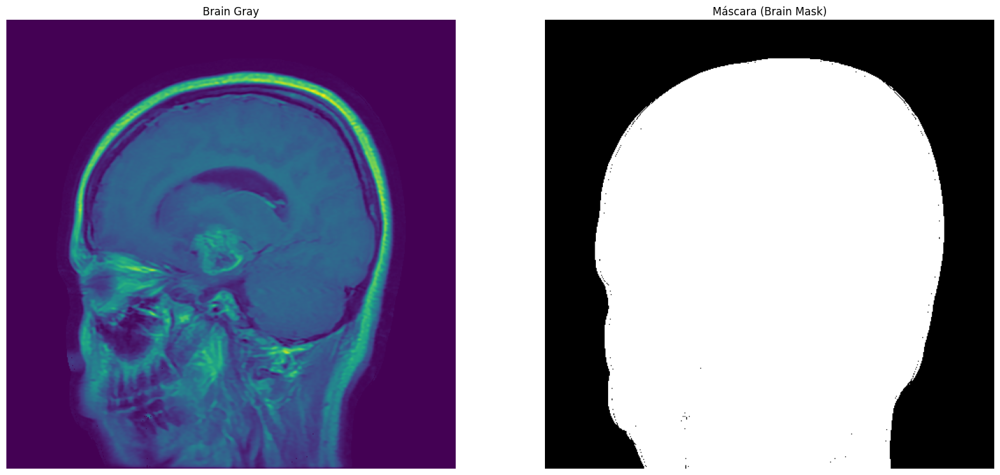

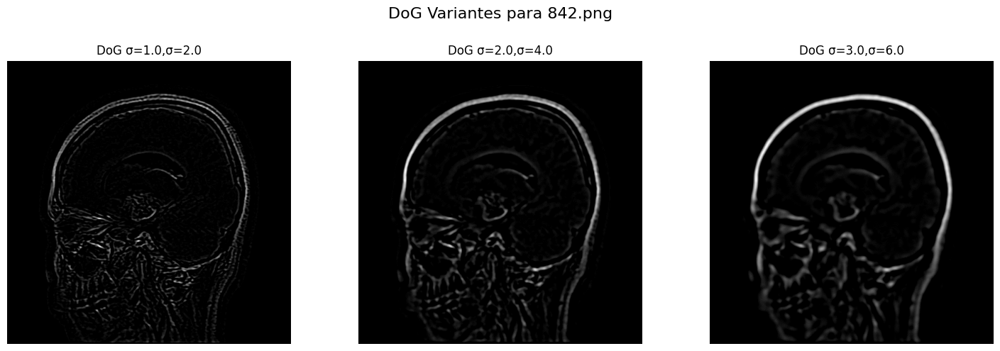

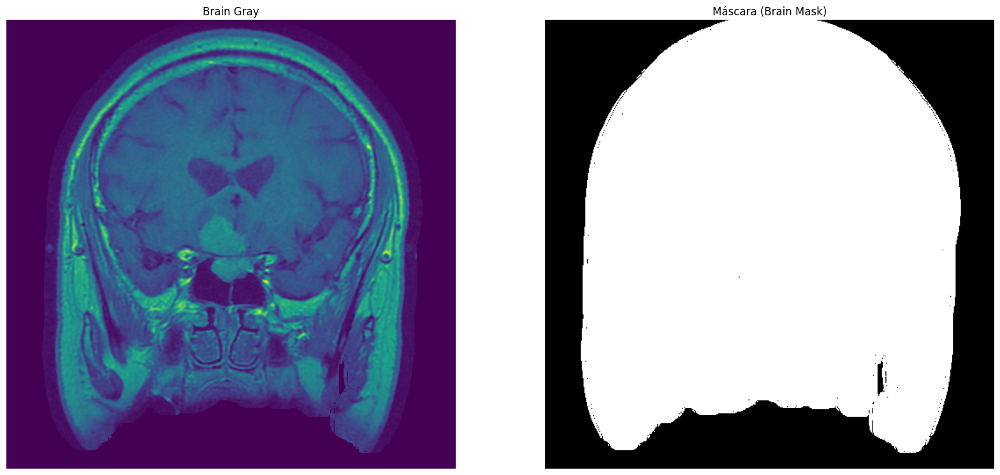

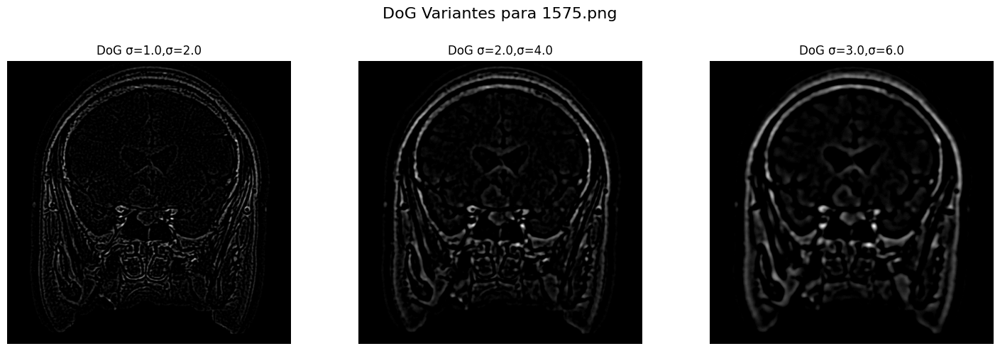

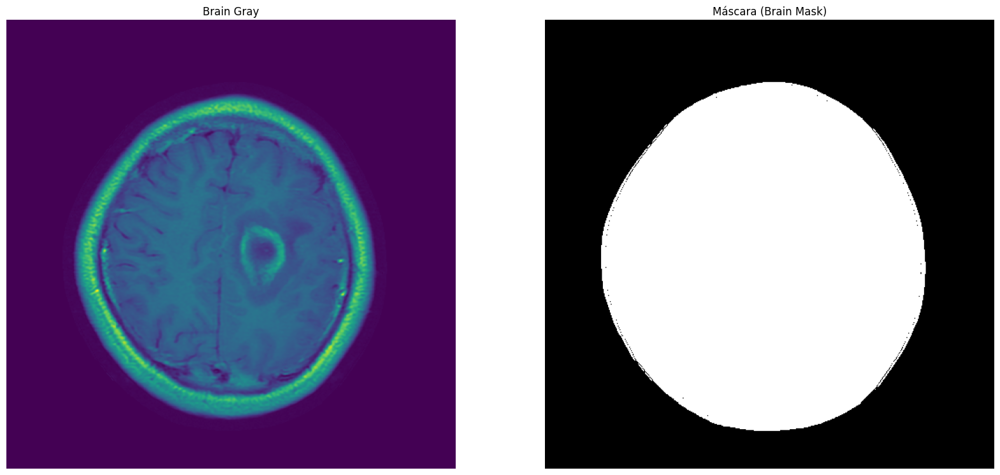

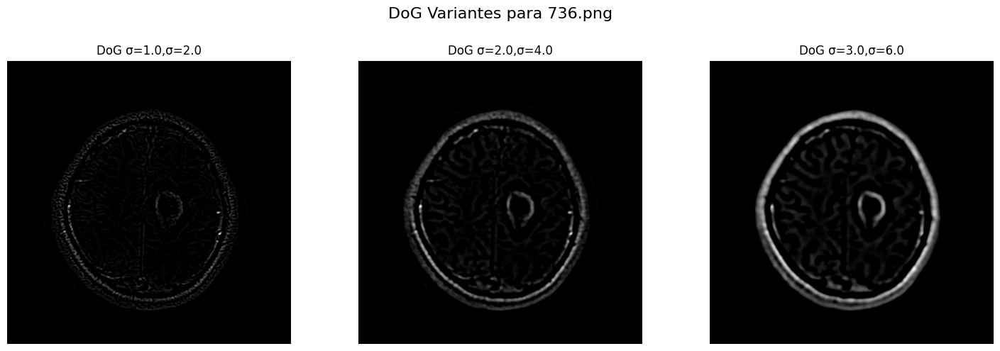

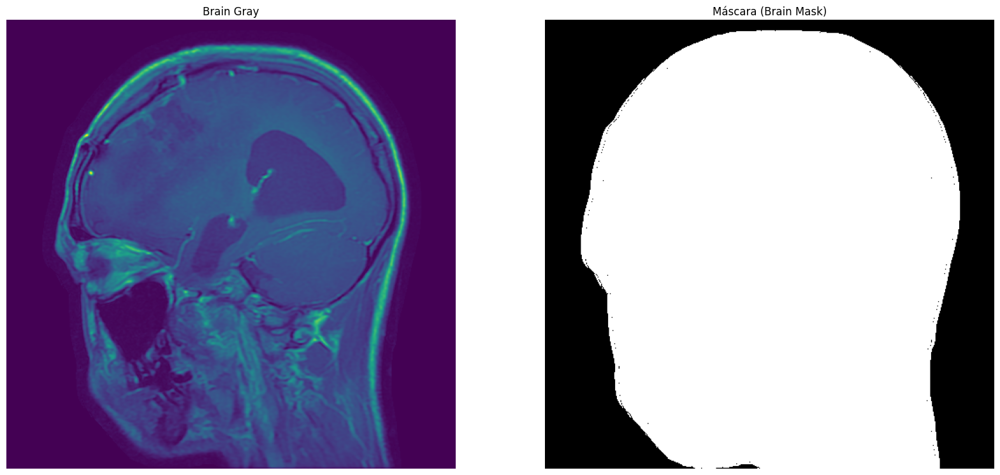

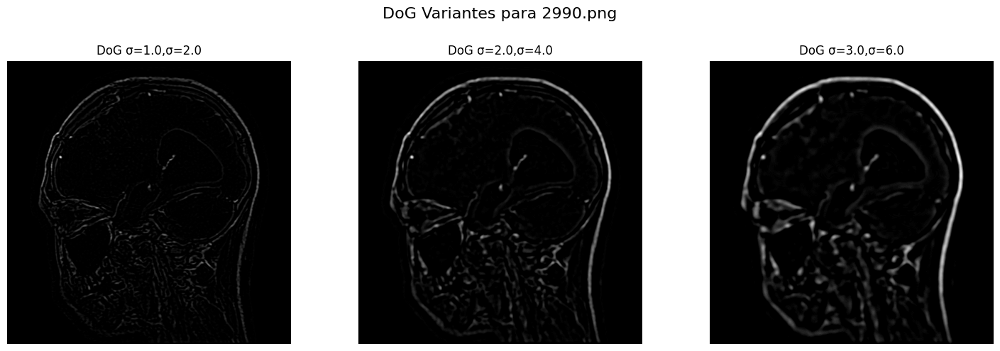

In [ ]:
# Select 4 images at random
random_images_dog = random.sample(images, 4)

# Define sigma pairs for Difference of Gaussians (DoG)
sigma_pairs = [(1.0, 2.0), (2.0, 4.0), (3.0, 6.0)]

# Function to obtain brain_gray and binary brain mask
def obtener_brain_gray_y_mask(img_bgr):
    # 1. Convert to grayscale
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    # 2. Smooth with Gaussian to reduce noise before segmentation
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    # 3. Otsu thresholding to segment brain vs. background
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # 4. Morphological operations to clean small artifacts
    kernel_morph = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_morph, iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel_morph, iterations=1)
    # 5. Find contours and keep the largest one (assumed to be the brain)
    contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_brain = np.zeros_like(gray)
    if contours:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        cv2.drawContours(mask_brain, [contours[0]], -1, 255, -1)
    # 6. Apply mask to the original (color) image to keep only the brain
    mask_rgb = cv2.merge([mask_brain, mask_brain, mask_brain])
    brain_only_color = cv2.bitwise_and(img_bgr, mask_rgb)
    # Create a Gabor kernel using previously defined parameters
    kernel = cv2.getGaborKernel((ksize, ksize), sigma, 0.0, 15.0, gamma, psi, ktype=cv2.CV_32F)
    # Filter the image
    resp = cv2.filter2D(brain_only_color, cv2.CV_32F, kernel)
    # Convert to 8-bit for display
    resp8 = cv2.convertScaleAbs(resp)
    resp8[resp8 != 0] = 255

    brain_only_color = cv2.bitwise_and(img_bgr, resp8)

    # 7. Convert to grayscale
    brain_gray = cv2.cvtColor(brain_only_color, cv2.COLOR_BGR2GRAY)
    mask = cv2.imread(os.path.join(masks_path, img_name), cv2.COLOR_GRAY2BGR)
    return brain_gray, resp8

# Iterate over the 4 selected images
for img_name in random_images_dog:
    # Load the full BGR image
    img_bgr = cv2.imread(os.path.join(images_path, img_name))
    if img_bgr is None:
        print(f"Error loading: {img_name}")
        continue

    # Obtain the brain in grayscale and the binary mask
    brain_gray, mask_brain = obtener_brain_gray_y_mask(img_bgr)

    # Display “Brain Gray” and “Mask” for reference
    show_images([brain_gray, mask_brain], ["Brain Gray", "Máscara (Brain Mask)"])

    # Apply Difference of Gaussians with different sigma pairs
    dog_responses = []
    dog_titles = []
    for (s1, s2) in sigma_pairs:
        # Gaussian blur with sigma s1 and s2
        blur1 = cv2.GaussianBlur(brain_gray, (0, 0), s1)
        blur2 = cv2.GaussianBlur(brain_gray, (0, 0), s2)
        dog = cv2.subtract(blur1, blur2)  # DoG = blur1 - blur2
        # Convert to absolute value and then to 8-bit for visualization
        dog_abs = cv2.convertScaleAbs(dog)
        dog_responses.append(dog_abs)
        dog_titles.append(f"DoG σ={s1},σ={s2}")

    # Display DoG results in a 1x3 grid
    fig, axes = plt.subplots(1, len(sigma_pairs), figsize=(15, 5))
    for idx, ax in enumerate(axes):
        ax.imshow(dog_responses[idx], cmap='gray')
        ax.set_title(dog_titles[idx])
        ax.axis('off')
    plt.suptitle(f"DoG Variantes para {img_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

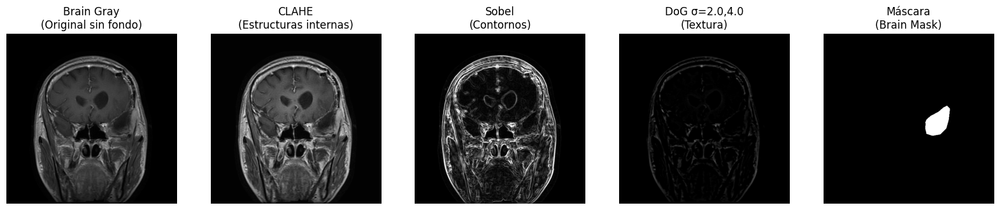

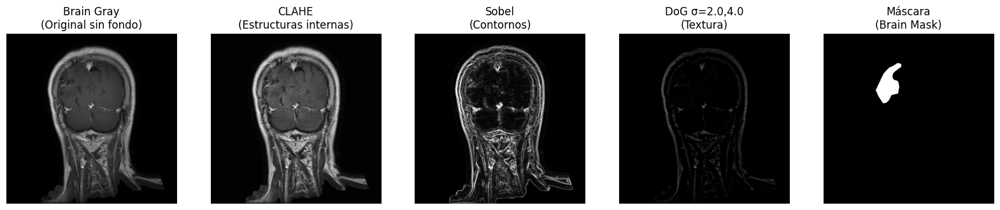

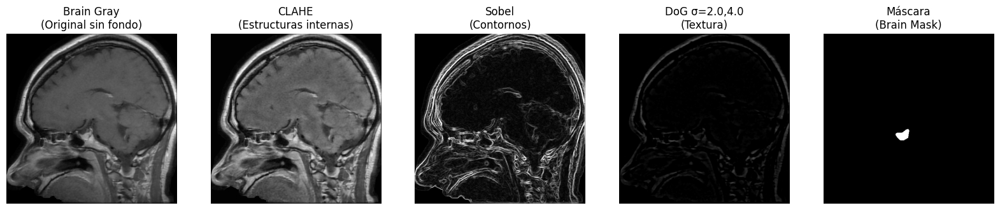

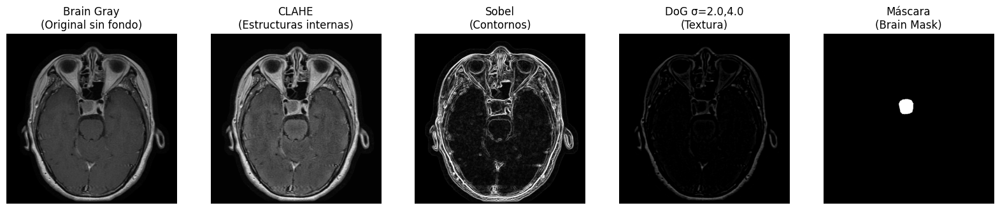

In [ ]:
# Lists to store results
list_brain_gray = []
list_clahe      = []
list_sobel      = []
list_dog        = []
list_masks_bin  = []

for idx, img_name in enumerate(random_images):
    # -----------------------------------------------------
    # 1) Load the color image
    # -----------------------------------------------------
    img = cv2.imread(os.path.join(images_path, img_name))
    if img is None:
        print(f"Error loading image: {img_name}")
        continue

    # -----------------------------------------------------
    # 2) Remove background and obtain gray brain + mask
    # -----------------------------------------------------
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel_morph = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_morph, iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel_morph, iterations=1)

    contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_brain = np.zeros_like(gray)
    if contours:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        cv2.drawContours(mask_brain, [contours[0]], -1, 255, -1)

    mask_rgb = cv2.merge([mask_brain, mask_brain, mask_brain])
    brain_only_color = cv2.bitwise_and(img, mask_rgb)
    brain_gray = cv2.cvtColor(brain_only_color, cv2.COLOR_BGR2GRAY)

    kernel = cv2.getGaborKernel((ksize, ksize), sigma, 0.0, 15.0, gamma, psi, ktype=cv2.CV_32F)
    # Filter the image
    resp = cv2.filter2D(brain_gray, cv2.CV_32F, kernel)
    # Convert to 8 bits for display
    resp8 = cv2.convertScaleAbs(resp)
    resp8[resp8 != 0] = 255

    brain_gray = cv2.bitwise_and(gray, resp8)

    # -----------------------------------------------------
    # 3) CLAHE filter (enhance internal structures)
    # -----------------------------------------------------
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(23, 23))
    clahe_img = clahe.apply(brain_gray)

    # -----------------------------------------------------
    # 4) Sobel filter (edge detection)
    # -----------------------------------------------------
    grad_x = cv2.Sobel(brain_gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(brain_gray, cv2.CV_64F, 0, 1, ksize=3)
    mag    = cv2.magnitude(grad_x, grad_y)
    sobel_edges = cv2.convertScaleAbs(mag)

    # -----------------------------------------------------
    # 5) DoG filter with σ1=2.0 and σ2=4.0 (Difference of Gaussians)
    # -----------------------------------------------------
    blur1 = cv2.GaussianBlur(brain_gray, (0, 0), 1.0)
    blur2 = cv2.GaussianBlur(brain_gray, (0, 0), 7.0)
    dog   = cv2.subtract(blur1, blur2)
    dog_abs = cv2.convertScaleAbs(dog)

    # -----------------------------------------------------
    # 6) Read the original mask (in grayscale and convert to BGR)
    # -----------------------------------------------------
    mask_orig = cv2.imread(os.path.join(masks_path, img_name), cv2.IMREAD_GRAYSCALE)
    mask_bgr  = cv2.cvtColor(mask_orig, cv2.COLOR_GRAY2BGR)

    # -----------------------------------------------------
    # 7) Convert everything to BGR to display with show_images
    # -----------------------------------------------------
    brain_gray_bgr = cv2.cvtColor(brain_gray, cv2.COLOR_GRAY2BGR)
    clahe_bgr      = cv2.cvtColor(clahe_img,   cv2.COLOR_GRAY2BGR)
    sobel_bgr      = cv2.cvtColor(sobel_edges, cv2.COLOR_GRAY2BGR)
    dog_bgr        = cv2.cvtColor(dog_abs,     cv2.COLOR_GRAY2BGR)

    # -----------------------------------------------------
    # 8) Append each result to the lists
    # -----------------------------------------------------
    list_brain_gray.append(brain_gray_bgr)
    list_clahe.append(clahe_bgr)
    list_sobel.append(sobel_bgr)
    list_dog.append(dog_bgr)
    list_masks_bin.append(mask_bgr)

# ---------------------------------------------------------
# Function to display a 5-column comparison
# ---------------------------------------------------------
def show_comparison(index):
    imgs = [
        list_brain_gray[index],
        list_clahe[index],
        list_sobel[index],
        list_dog[index],
        list_masks_bin[index]
    ]
    titles = [
        "Brain Gray\n(Original sin fondo)",
        "CLAHE\n(Estructuras internas)",
        "Sobel\n(Contornos)",
        "DoG σ=2.0,4.0\n(Textura)",
        "Máscara\n(Brain Mask)"
    ]
    show_images(imgs, titles)

# ---------------------------------------------------------
# Display comparison for each of the 4 images
# ---------------------------------------------------------
for i in range(len(list_brain_gray)):
    show_comparison(i)


### 🧪 Construcción de un dataset con imágenes RGB sintéticas ("falso RGB")

En esta nueva iteración, se diseñó un conjunto de datos en el que cada imagen cerebral fue transformada en una **representación RGB sintética** a partir de un único canal en escala de grises. Esta estrategia permite **combinar distintos filtros relevantes en una única entrada de tres canales**, aprovechando arquitecturas de redes convolucionales estándar diseñadas para imágenes RGB (como U-Net).

---

### 🎨 Enfoque del "falso RGB"

Cada canal del nuevo tensor RGB representa una transformación distinta de la misma imagen original:

- **Canal R (Rojo)**: filtro **CLAHE**, que mejora el contraste local, resaltando estructuras internas del tejido.
- **Canal G (Verde)**: filtro **Sobel**, que detecta bordes y contornos abruptos.
- **Canal B (Azul)**: filtro **Difference of Gaussians (DoG)** con \(\sigma_1 = 1.0\) y \(\sigma_2 = 7.0\), que resalta diferencias suaves de intensidad y estructuras intermedias.

Antes de aplicar estos filtros, se realizó un **preprocesamiento morfológico** para eliminar el fondo y conservar solo el cerebro, lo cual reduce ruido y mejora la relevancia de los patrones detectados.

---

### 🧠 ¿Por qué este enfoque puede ser útil?

- **Mayor riqueza de información espacial y textural** en una sola entrada.
- **Simula entradas multicanal** sin necesidad de datos multimodales.
- Permite que el modelo aprenda a **combinar automáticamente diferentes tipos de evidencia visual** (contraste, bordes, texturas).
- Facilita el uso de arquitecturas existentes entrenadas o diseñadas para RGB sin cambios mayores.

Este tipo de representación **enriquece los datos sin aumentar el número de muestras**, lo cual es especialmente valioso en contextos como la segmentación médica, donde los datasets suelen ser limitados.

---

### ⚙️ Pipeline de datos

Se definieron funciones personalizadas para:
- Leer y procesar las imágenes en RGB sintético.
- Leer y normalizar las máscaras binarias.
- Aplicar aumentos geométricos y de brillo/contraste (solo en imágenes).
- Construir datasets `tf.data.Dataset` optimizados (shuffle, batch, prefetch).

Se crearon cuatro particiones:
- `train_v1_rgb_ds` y `train_v2_rgb_ds`: entrenamiento con augmentación.
- `val_rgb_ds` y `test_rgb_ds`: validación y test sin augmentación.

---

✅ *Este preprocesamiento permite probar si una representación más rica en características visuales mejora la capacidad del modelo para detectar tumores cerebrales de forma más precisa y robusta.*


In [ ]:
BATCH_SIZE  = 8



# --------------------------------------------------------------
# Python function (with OpenCV) that takes a numpy array HxWx1 uint8
# and returns HxWx3 float32 normalized [0,1], with three filters:
#   R channel = CLAHE
#   G channel = Sobel
#   B channel = DoG (σ1=1.0, σ2=7.0)
# It first removes the background to keep only the brain.
# --------------------------------------------------------------
def apply_filters_to_image(img_np):
    """
    img_np: numpy ndarray shape=(IMG_HEIGHT, IMG_WIDTH, 1), dtype=uint8 (0–255)
    Returns: numpy ndarray shape=(IMG_HEIGHT, IMG_WIDTH, 3), dtype=float32 in [0,1]
    """
    # Ensure it's a NumPy ndarray
    if isinstance(img_np, tf.Tensor):
        img_np = img_np.numpy()

    # Extract single grayscale channel
    gray = img_np[:, :, 0]

    # ---------- Remove background ----------
    # 1) Blur to reduce noise
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    # 2) Otsu thresholding
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # 3) Morphological operations to close holes and remove artifacts
    kernel_morph = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_morph, iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel_morph, iterations=1)
    # 4) Find the largest contour (assuming it's the brain)
    contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_brain = np.zeros_like(gray)
    if contours:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        cv2.drawContours(mask_brain, [contours[0]], -1, 255, -1)
    # 5) Apply the mask to the grayscale to keep only the brain
    brain_gray = cv2.bitwise_and(gray, mask_brain)

    # ---------- Filters on brain_gray ----------
    # --- CLAHE filter (R channel)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(23, 23))
    clahe_img = clahe.apply(brain_gray)  # uint8

    # --- Sobel filter (G channel)
    grad_x = cv2.Sobel(brain_gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(brain_gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = cv2.magnitude(grad_x, grad_y)
    sobel_img = cv2.convertScaleAbs(mag)  # uint8

    # --- DoG filter (Difference of Gaussians) (B channel)
    blur1 = cv2.GaussianBlur(brain_gray, (0, 0), 1.0)
    blur2 = cv2.GaussianBlur(brain_gray, (0, 0), 7.0)
    dog = cv2.subtract(blur1, blur2)
    dog_img = cv2.convertScaleAbs(dog)  # uint8

    # Stack into three channels (CLAHE, Sobel, DoG)
    stacked = np.stack([clahe_img, sobel_img, dog_img], axis=-1)

    # Normalize to float32 [0,1]
    stacked = stacked.astype(np.float32) / 255.0
    return stacked

# --------------------------------------------------------------
# TensorFlow function to load and process image + mask
# --------------------------------------------------------------
def load_image_and_mask_rgb(image_path, mask_path):
    """
    1) Reads the grayscale image from `image_path` (uint8),
       resizes to (IMG_HEIGHT, IMG_WIDTH).
    2) Removes background and applies apply_filters_to_image using tf.py_function.
    3) Reads the mask, resizes to (IMG_HEIGHT, IMG_WIDTH, 1),
       and normalizes to float32 [0,1].
    Returns: (imagen_rgb, mask) as float32, shapes [H,W,3] and [H,W,1].
    """
    # --- 3.1) Read and decode the original image (uint8), single channel
    img_data = tf.io.read_file(image_path)
    img_uint8 = tf.image.decode_image(img_data, channels=1)   # shape=(H0, W0, 1)
    img_uint8.set_shape([None, None, 1])

    # Resize to (IMG_HEIGHT, IMG_WIDTH)
    img_resized = tf.image.resize(img_uint8, [IMG_HEIGHT, IMG_WIDTH], method=tf.image.ResizeMethod.BILINEAR)
    # Ensure it's uint8 (0-255)
    img_resized = tf.cast(tf.round(img_resized), tf.uint8)

    # --- 3.2) Remove background and apply filters with tf.py_function
    def _apply_pyfunc(x):
        return apply_filters_to_image(x)
    # x is a uint8 tensor [H,W,1]
    img_rgb = tf.py_function(func=_apply_pyfunc, inp=[img_resized], Tout=tf.float32)
    img_rgb.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])

    # --- 3.3) Read and decode the mask (uint8), single channel
    msk_data = tf.io.read_file(mask_path)
    ext_m = tf.strings.lower(tf.strings.split(mask_path, ".")[-1])
    def _decode_png_m():
        return tf.image.decode_png(msk_data, channels=1)
    def _decode_jpeg_m():
        return tf.image.decode_jpeg(msk_data, channels=1)
    msk_uint8 = tf.cond(
        tf.equal(ext_m, tf.constant("png")),
        true_fn=_decode_png_m,
        false_fn=_decode_jpeg_m
    )
    msk_uint8.set_shape([None, None, 1])

    # Resize mask
    msk_resized = tf.image.resize(msk_uint8, [IMG_HEIGHT, IMG_WIDTH], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    # Normalize to [0,1] float32
    msk = tf.image.convert_image_dtype(msk_resized, tf.float32)  # shape=(H,W,1)

    return img_rgb, msk

# --------------------------------------------------------------
# Augmentation function (same as before)
# --------------------------------------------------------------
def data_augmentation(image, mask):
    """
    Applies augmentations on RGB image and mask:
      1) Random horizontal flip (50%)
      2) Random vertical flip (50%)
      3) Random rotation by k*90°, k ∈ {0,1,2,3}
      4) Contrast and brightness adjustment ONLY to the RGB image
    """
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_left_right(image)
        mask  = tf.image.flip_left_right(mask)

    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_up_down(image)
        mask  = tf.image.flip_up_down(mask)

    k = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, k)
    mask  = tf.image.rot90(mask, k)

    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.image.random_brightness(image, max_delta=0.1)

    return image, mask

# --------------------------------------------------------------
# Function to create a tf.data.Dataset using RGB variants
# --------------------------------------------------------------
def make_dataset_rgb(file_list, image_dir, mask_dir, augment=False, shuffle_buffer=1000):
    """
    Builds a tf.data.Dataset where each element is:
      - imagen_rgb: shape (IMG_HEIGHT, IMG_WIDTH, 3), float32 [0,1]
      - mask: shape (IMG_HEIGHT, IMG_WIDTH, 1), float32 [0,1]
    """
    image_paths = [tf.strings.join([image_dir, "/", fname]) for fname in file_list]
    mask_paths  = [tf.strings.join([mask_dir, "/", fname])  for fname in file_list]

    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    if shuffle_buffer and shuffle_buffer > 0:
        ds = ds.shuffle(buffer_size=shuffle_buffer, seed=SEED, reshuffle_each_iteration=True)

    # Map: load + remove background + apply RGB filters + decode mask
    ds = ds.map(
        lambda im_pth, m_pth: load_image_and_mask_rgb(im_pth, m_pth),
        num_parallel_calls=AUTOTUNE
    )

    if augment:
        ds = ds.map(
            lambda img, msk: data_augmentation(img, msk),
            num_parallel_calls=AUTOTUNE
        )

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(AUTOTUNE)
    return ds

# --------------------------------------------------------------
# 7) Create the four final datasets (RGB variants + augment)
# --------------------------------------------------------------
train_v1_rgb_ds = make_dataset_rgb(
    file_list=train_v1_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,
    shuffle_buffer=len(train_v1_files)
)

train_v2_rgb_ds = make_dataset_rgb(
    file_list=train_v2_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,
    shuffle_buffer=len(train_v2_files)
)

val_rgb_ds = make_dataset_rgb(
    file_list=val_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,
    shuffle_buffer=0
)

test_rgb_ds = make_dataset_rgb(
    file_list=test_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,
    shuffle_buffer=0
)

# --------------------------------------------------------------
# 8) Quick check
# --------------------------------------------------------------
for batch_imgs, batch_msks in train_v1_rgb_ds.take(1):
    print("Batch imágenes RGB variantes (shape):", batch_imgs.shape)   # (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 3)
    print("Batch máscaras (shape):", batch_msks.shape)  # (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 1)
    break

print("Datasets RGB variantes creados correctamente.")

Batch imágenes RGB variantes (shape): (8, 512, 512, 3)
Batch máscaras (shape): (8, 512, 512, 1)
Datasets RGB variantes creados correctamente.


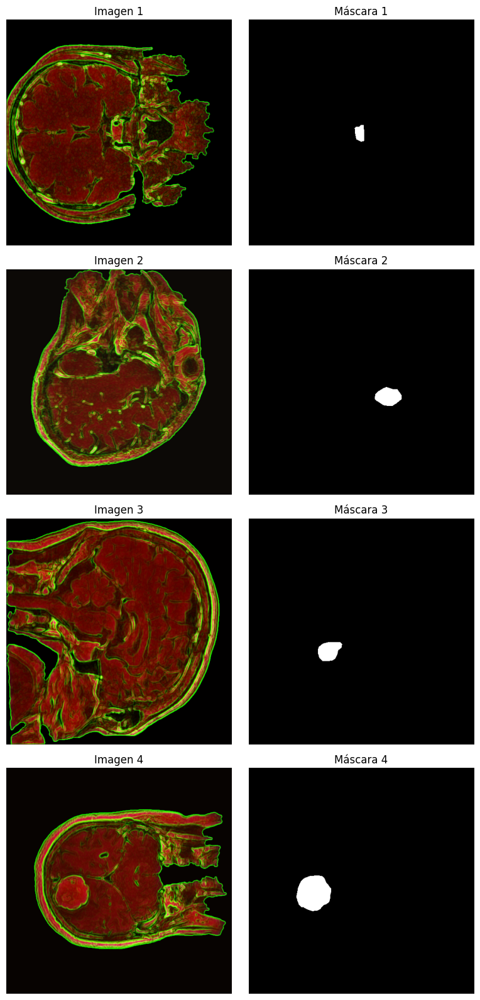

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------
# Este bloque asume que ya tienes definido:
# - dataset: un tf.data.Dataset que emite (imagen, máscara).
#   Ejemplo: train_v1_rgb_ds, val_rgb_ds, etc.
# ---------------------------------------------

# 1) Tomar 4 ejemplos del dataset (unbatch + take)
samples = train_v1_rgb_ds.unbatch().take(4)

imgs = []
msks = []
for im, m in samples:
    imgs.append(im.numpy())
    msks.append(m.numpy())

# 2) Graficar en 4 filas x 2 columnas: imagen RGB + máscara
fig, axes = plt.subplots(4, 2, figsize=(8, 16))
for i in range(4):
    img = imgs[i]
    mask = msks[i]

    # Mostramos la imagen (RGB o escala de grises con 3 canales)
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Imagen {i+1}")
    axes[i, 0].axis('off')

    # Mostramos la máscara en escala de grises
    axes[i, 1].imshow(mask[:, :, 0], cmap='gray')
    axes[i, 1].set_title(f"Máscara {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


### 🧠 Modelo: Attention U-Net adaptado para entrada RGB (CLAHE + Sobel + DoG)

En esta fase se construyó una variante del modelo U-Net con mecanismos de atención, específicamente diseñada para trabajar con el **nuevo dataset RGB sintético**, cuyas imágenes combinan tres filtros (CLAHE, Sobel y DoG) en sus canales.

---

### 🎯 ¿Por qué usar Attention U-Net?

La arquitectura **Attention U-Net** introduce *gates de atención* en las conexiones "skip" del encoder al decoder. Esto permite que el modelo:

- **Filtre información irrelevante** que viene de las capas de codificación.
- **Se enfoque en las regiones más importantes de la imagen**, como posibles zonas tumorales.
- Aprenda **contexto espacial más relevante** para tareas de segmentación médica.

Esto es especialmente útil cuando se trabaja con imágenes donde **gran parte del área no contiene tumores**, como en el caso de resonancias cerebrales.

---

### ⚙️ Adaptación al dataset RGB

El modelo fue adaptado para aceptar entradas de forma `(512, 512, 3)`, donde los 3 canales provienen del falso RGB:

| Canal | Contenido | Propósito |
|-------|-----------|-----------|
| R     | CLAHE     | Mejora estructuras internas |
| G     | Sobel     | Resalta bordes y contornos |
| B     | DoG       | Realza diferencias de textura |

Al combinar esta representación con atención, el modelo puede aprender **cómo usar cada tipo de información visual en diferentes regiones**.

---

### 🧩 Estructura del modelo

- Encoder clásico de U-Net (con bloques convolucionales dobles y MaxPooling).
- Bottleneck central de alta capacidad (1024 filtros).
- Decoder con **atención aplicada a cada skip connection**, antes de concatenar.
- Salida final de 1 canal (máscara binaria) con activación `sigmoid`.

---

### 📈 Compilación y métricas

Se compiló con:

- **Pérdida**: `binary_crossentropy`, adecuada para segmentación binaria (tumor / no tumor).
- **Métricas**:
  - `MeanIoU`: esencial para evaluar **intersección sobre unión**, que penaliza falsos positivos y negativos.
  - `Accuracy`: incluida solo como referencia general, aunque **no es la mejor métrica** para segmentación con clases muy desbalanceadas.

---

✅ *Este modelo representa una evolución lógica y bien fundamentada del pipeline, combinando enriquecimiento de datos a nivel de entrada con mecanismos de atención espacial para mejorar la precisión en la detección de tumores.*


In [ ]:
# ---------------------------------------------------
# Input parameters for the Attention U-Net for RGB variant dataset
# ---------------------------------------------------
INPUT_HEIGHT   = 512
INPUT_WIDTH    = 512
INPUT_CHANNELS = 3   # Now 3 channels (CLAHE, Sobel, DoG)

# ---------------------------------------------------
# Two-convolution block (Conv → BatchNorm → ReLU) × 2
# ---------------------------------------------------
def conv_block(x, filters, kernel_size=(3,3), padding="same", strides=1):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, kernel_size, strides=1, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

# ---------------------------------------------------
# Attention Gate (AG) with fixed upsampling ×2
# ---------------------------------------------------
def attention_gate(x, g, inter_channels):
    """
    x: tensor from the skip connection (shape: H × W × C_x)
    g: tensor from the gating signal (shape: H/2 × W/2 × C_g)
    inter_channels: number of intermediate filters
    """
    # 1) Project x and g to the intermediate space
    theta_x = layers.Conv2D(inter_channels, kernel_size=1, strides=1, padding='same', use_bias=False)(x)
    phi_g   = layers.Conv2D(inter_channels, kernel_size=1, strides=1, padding='same', use_bias=False)(g)

    # 2) Upsample phi_g ×2 to match spatial dimensions of theta_x
    phi_g_up = layers.UpSampling2D(size=(2,2), interpolation='bilinear')(phi_g)

    # 3) Add and apply ReLU
    f = layers.Activation('relu')(layers.add([theta_x, phi_g_up]))

    # 4) Project to a single channel and apply Sigmoid
    psi = layers.Conv2D(1, kernel_size=1, strides=1, padding='same', use_bias=False)(f)
    psi = layers.BatchNormalization()(psi)
    psi = layers.Activation('sigmoid')(psi)

    # 5) Multiply the original skip connection by the attention mask
    x_att = layers.multiply([x, psi])
    return x_att

# ---------------------------------------------------
# Up-convolution + concatenation + conv_block block
# ---------------------------------------------------
def upconv_concat(skip, x, filters, kernel_size=(2,2), strides=(2,2), padding="same"):
    """
    skip: tensor from the encoder (skip connection), same dimensions as upsample(x)
    x: tensor from the previous decoder step
    """
    x = layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

# ---------------------------------------------------
# Full version of the 512×512 Attention U-Net with 3 channels
# ---------------------------------------------------
def build_attention_unet_rgb(input_shape=(INPUT_HEIGHT, INPUT_WIDTH, INPUT_CHANNELS)):
    inputs = layers.Input(shape=input_shape)   # 512×512×3

    # ===== Encoder (Downsampling) =====
    # Block C1: 512×512 → 512×512
    c1 = conv_block(inputs, filters=64)                      # 512×512×64
    p1 = layers.MaxPooling2D(pool_size=(2,2))(c1)            # 256×256×64

    # Block C2: 256×256 → 256×256
    c2 = conv_block(p1, filters=128)                         # 256×256×128
    p2 = layers.MaxPooling2D(pool_size=(2,2))(c2)            # 128×128×128

    # Block C3: 128×128 → 128×128
    c3 = conv_block(p2, filters=256)                         # 128×128×256
    p3 = layers.MaxPooling2D(pool_size=(2,2))(c3)            # 64×64×256

    # Block C4: 64×64 → 64×64
    c4 = conv_block(p3, filters=512)                         # 64×64×512
    p4 = layers.MaxPooling2D(pool_size=(2,2))(c4)            # 32×32×512

    # ===== Bridge (Bottleneck) =====
    c5 = conv_block(p4, filters=1024)                        # 32×32×1024

    # ===== Decoder (Upsampling) with Attention Gates =====
    # Up1: 32×32 → 64×64; AG on c4 with gating from c5
    c4_att = attention_gate(c4, c5, inter_channels=512)      # 64×64×512
    u6 = upconv_concat(c4_att, c5, filters=512)              # 64×64×512

    # Up2: 64×64 → 128×128; AG on c3 with gating from u6
    c3_att = attention_gate(c3, u6, inter_channels=256)      # 128×128×256
    u7 = upconv_concat(c3_att, u6, filters=256)              # 128×128×256

    # Up3: 128×128 → 256×256; AG on c2 with gating from u7
    c2_att = attention_gate(c2, u7, inter_channels=128)      # 256×256×128
    u8 = upconv_concat(c2_att, u7, filters=128)              # 256×256×128

    # Up4: 256×256 → 512×512; AG on c1 with gating from u8
    c1_att = attention_gate(c1, u8, inter_channels=64)       # 512×512×64
    u9 = upconv_concat(c1_att, u8, filters=64)               # 512×512×64

    # ===== Final 1×1 Conv =====
    outputs = layers.Conv2D(1, (1,1), activation="sigmoid")(u9)  # 512×512×1

    return Model(inputs=[inputs], outputs=[outputs], name="Attention-U-Net-RGB-512")

unet_rgb = build_attention_unet_rgb(input_shape=(512, 512, 3))
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.MeanIoU(num_classes=2), "accuracy"]
)
unet_rgb.summary()


Model: "Attention-U-Net-RGB-512"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │      1,728 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,864 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,456 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    294,912 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_4[0][0]  

 Total params: 32,094,865 (122.43 MB)

 Trainable params: 32,083,081 (122.39 MB)

 Non-trainable params: 11,784 (46.03 KB)

### 🧠 **Resumen y Reflexión - Modelo Attention U-Net con Falso RGB**

#### **📌 Contexto:**

El modelo trabaja con entradas pseudo-RGB generadas a partir de MRI T1 o T2 usando tres filtros clave:

* **CLAHE (R)**: mejora el contraste de estructuras internas.
* **Sobel (G)**: destaca bordes.
* **DoG (B)**: realza texturas de nivel medio.

Este diseño evita la necesidad de tener múltiples modalidades médicas al proporcionar canales artificiales ricos en información estructural.

---

### 🔹 **Etapa 1 - Entrenamiento base (`train_v1_rgb_ds`)**

**Resultados:**

* F1 en validación: \~0.72
* Precision: \~0.83-0.86
* Recall más bajo inicialmente, pero estable

**Reflexión:**
El modelo se adapta bien al nuevo tipo de entrada. Desde las primeras épocas, aprende a segmentar zonas relevantes con un buen equilibrio entre precisión y generalización. La pérdida baja rápidamente, y las métricas validan que el falso RGB aporta valor semántico útil.

---

### 🔹 **Etapa 2 - Fine-tuning con nuevo set (`train_v2_rgb_ds`)**

**Resultados:**

* F1 mejora levemente hasta \~0.73-0.74
* Aumento notable en recall
* Mantenimiento del precision > 0.83

**Reflexión:**
Este refinamiento permitió al modelo adaptarse a una mayor diversidad de casos. Se ve un crecimiento más marcado del **recall**, lo que indica que el modelo comenzó a detectar mejor zonas que antes omitía, incluso si eso costó una ligera caída en la precisión.

---

### 🔹 **Etapa 3 - Fine-tuning final (dataset combinado)**

📊 **Resultados finales en test:**

* **Loss:** 0.0159
* **Precision:** 0.8599
* **Recall:** 0.7715
* **F1 Score:** **0.7463**

🧾 **Observaciones de las curvas:**

* Loss en training baja continuamente, sin overfitting severo.
* Val\_precision y val\_recall se estabilizan con buena correlación.
* F1\_score final en validación ronda 0.74-0.75, con buen comportamiento en test.

**Reflexión:**
El modelo alcanzó un **pico de rendimiento balanceado**. Al haber visto ambos datasets combinados, mejoró su robustez general y capacidad de adaptación. La arquitectura Attention U-Net también ayudó a preservar detalles relevantes al controlar mejor la información de los skip connections. La reducción del LR fue clave para no sobreajustar.

---

### ✅ **Conclusión General**

* El uso de filtros como falso RGB permite simular una entrada multicanal sin depender de imágenes multimodales.
* El entrenamiento progresivo (con datasets distintos y luego combinados) ayudó a estabilizar las métricas.
* El **Attention U-Net con entradas RGB sintéticas alcanzó un F1 ≈ 0.746**, con muy buena precisión y recuperación.
* Las máscaras generadas en test son visualmente consistentes, incluso en bordes complejos.


In [ ]:
# 1) Define custom Precision, Recall, and F1 metrics
precision_metric = tf.keras.metrics.Precision(name="precision")
recall_metric    = tf.keras.metrics.Recall(name="recall")

def f1_score(y_true, y_pred):
    """
    Compute batch-level F1:
      f1 = 2 * (precision * recall) / (precision + recall)
    Values are approximated by binarizing and counting TP, FP, FN.
    """
    y_pred_bin = tf.round(y_pred)
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred_bin, tf.float32)

    tp = tf.reduce_sum(y_true_f * y_pred_f, axis=[1,2,3])
    fp = tf.reduce_sum((1 - y_true_f) * y_pred_f, axis=[1,2,3])
    fn = tf.reduce_sum(y_true_f * (1 - y_pred_f), axis=[1,2,3])

    f1 = 2 * tp / (2 * tp + fp + fn + 1e-7)
    return tf.reduce_mean(f1)

# 2) Compile the model with Binary Crossentropy + desired metrics
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[precision_metric, recall_metric, f1_score]
)

# 3) Callbacks to stop and save the best model based on validation F1
callbacks = [
    # Save the model with highest validation F1
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True,
        save_weights_only=False,
    ),
    # Stop training if validation F1 does not improve for 10 epochs
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=10,
        restore_best_weights=True
    ),
    # Reduce learning rate when the metric plateaus
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.5,
        patience=5,
        min_lr=1e-7
    )
]

# 4) Train the model
history = unet_rgb.fit(
    train_v1_rgb_ds,                # training dataset (batches of (image_rgb, mask))
    epochs=100,                     # adjust based on convergence
    validation_data=val_rgb_ds,     # validation dataset
    callbacks=callbacks
)

# 5) (Optional) Evaluate on validation/Test set
results = unet_rgb.evaluate(val_rgb_ds)
print({
    "loss_val":    results[0],
    "precision":   results[1],
    "recall":      results[2],
    "f1_score":    results[3]
})


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - f1_score: 0.0110 - loss: 0.2473 - precision: 0.0248 - recall: 0.0426

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


135/135 ━━━━━━━━━━━━━━━━━━━━ 153s 574ms/step - f1_score: 0.0110 - loss: 0.2467 - precision: 0.0248 - recall: 0.0424 - val_f1_score: 0.0000e+00 - val_loss: 0.3122 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.0181 - loss: 0.1038 - precision: 0.4285 - recall: 0.0109

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.0186 - loss: 0.1037 - precision: 0.4320 - recall: 0.0113 - val_f1_score: 0.0311 - val_loss: 0.6621 - val_precision: 0.0181 - val_recall: 0.5944 - learning_rate: 1.0000e-04
Epoch 3/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - f1_score: 0.2011 - loss: 0.0868 - precision: 0.5552 - recall: 0.1685

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.2013 - loss: 0.0868 - precision: 0.5563 - recall: 0.1685 - val_f1_score: 0.0933 - val_loss: 0.3302 - val_precision: 0.0526 - val_recall: 0.6716 - learning_rate: 1.0000e-04
Epoch 4/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.3033 - loss: 0.0735 - precision: 0.6925 - recall: 0.2670

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.3033 - loss: 0.0735 - precision: 0.6922 - recall: 0.2670 - val_f1_score: 0.2607 - val_loss: 0.0788 - val_precision: 0.5293 - val_recall: 0.2622 - learning_rate: 1.0000e-04
Epoch 5/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - f1_score: 0.3403 - loss: 0.0683 - precision: 0.7200 - recall: 0.3220

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.3402 - loss: 0.0683 - precision: 0.7196 - recall: 0.3218 - val_f1_score: 0.2909 - val_loss: 0.0660 - val_precision: 0.7134 - val_recall: 0.3006 - learning_rate: 1.0000e-04
Epoch 6/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.2930 - loss: 0.0634 - precision: 0.7022 - recall: 0.2807

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.2935 - loss: 0.0634 - precision: 0.7021 - recall: 0.2810 - val_f1_score: 0.4433 - val_loss: 0.0629 - val_precision: 0.5352 - val_recall: 0.5205 - learning_rate: 1.0000e-04
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 330ms/step - f1_score: 0.3749 - loss: 0.0598 - precision: 0.7583 - recall: 0.3438 - val_f1_score: 0.3713 - val_loss: 0.0529 - val_precision: 0.7689 - val_recall: 0.3428 - learning_rate: 1.0000e-04
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 330ms/step - f1_score: 0.4176 - loss: 0.0518 - precision: 0.7670 - recall: 0.3902 - val_f1_score: 0.3597 - val_loss: 0.0490 - val_precision: 0.8252 - val_recall: 0.3395 - learning_rate: 1.0000e-04
Epoch 9/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.4512 - loss: 0.0472 - precision: 0.7394 - recall: 0.4348

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.4514 - loss: 0.0472 - precision: 0.7397 - recall: 0.4349 - val_f1_score: 0.4663 - val_loss: 0.0454 - val_precision: 0.6694 - val_recall: 0.5190 - learning_rate: 1.0000e-04
Epoch 10/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.5081 - loss: 0.0466 - precision: 0.7640 - recall: 0.4776 - val_f1_score: 0.4416 - val_loss: 0.0463 - val_precision: 0.7339 - val_recall: 0.4787 - learning_rate: 1.0000e-04
Epoch 11/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 330ms/step - f1_score: 0.4877 - loss: 0.0433 - precision: 0.7750 - recall: 0.4649 - val_f1_score: 0.3906 - val_loss: 0.0476 - val_precision: 0.7788 - val_recall: 0.3228 - learning_rate: 1.0000e-04
Epoch 12/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.5089 - loss: 0.0422 - precision: 0.7739 - recall: 0.4848

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.5094 - loss: 0.0422 - precision: 0.7740 - recall: 0.4852 - val_f1_score: 0.4844 - val_loss: 0.0371 - val_precision: 0.8502 - val_recall: 0.4585 - learning_rate: 1.0000e-04
Epoch 13/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.5367 - loss: 0.0381 - precision: 0.7918 - recall: 0.5240 - val_f1_score: 0.4485 - val_loss: 0.0416 - val_precision: 0.7769 - val_recall: 0.4337 - learning_rate: 1.0000e-04
Epoch 14/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.5609 - loss: 0.0364 - precision: 0.8041 - recall: 0.5437 - val_f1_score: 0.3915 - val_loss: 0.0361 - val_precision: 0.9095 - val_recall: 0.3533 - learning_rate: 1.0000e-04
Epoch 15/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.5948 - loss: 0.0343 - precision: 0.8217 - recall: 0.5777 - val_f1_score: 0.4251 - val_loss: 0.0406 - val_precision: 0.8777 - val_recall: 0.3298 - learning_rate: 1.0000e-04
Epoch 16/100
134/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.5837 - loss: 0.0323 - precision: 0.8327 - recall: 0.5584 - val_f1_score: 0.5913 - val_loss: 0.0332 - val_precision: 0.7362 - val_recall: 0.6505 - learning_rate: 1.0000e-04
Epoch 17/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.6001 - loss: 0.0344 - precision: 0.8097 - recall: 0.5808

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.6001 - loss: 0.0344 - precision: 0.8096 - recall: 0.5808 - val_f1_score: 0.5967 - val_loss: 0.0315 - val_precision: 0.7794 - val_recall: 0.6104 - learning_rate: 1.0000e-04
Epoch 18/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.6282 - loss: 0.0289 - precision: 0.8202 - recall: 0.6363

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.6282 - loss: 0.0289 - precision: 0.8202 - recall: 0.6361 - val_f1_score: 0.6480 - val_loss: 0.0362 - val_precision: 0.5980 - val_recall: 0.7806 - learning_rate: 1.0000e-04
Epoch 19/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.6271 - loss: 0.0296 - precision: 0.8082 - recall: 0.6143 - val_f1_score: 0.5829 - val_loss: 0.0301 - val_precision: 0.8260 - val_recall: 0.5420 - learning_rate: 1.0000e-04
Epoch 20/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.6410 - loss: 0.0286 - precision: 0.8224 - recall: 0.6221 - val_f1_score: 0.6185 - val_loss: 0.0283 - val_precision: 0.8250 - val_recall: 0.5771 - learning_rate: 1.0000e-04
Epoch 21/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.6651 - loss: 0.0264 - precision: 0.8332 - recall: 0.6671 - val_f1_score: 0.6318 - val_loss: 0.0270 - val_precision: 0.7843 - val_recall: 0.6472 - learning_rate: 1.0000e-04
Epoch 22/100
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.6452 - loss: 0.0263 - precision: 0.8362 - recall: 0.6263 - val_f1_score: 0.6699 - val_loss: 0.0256 - val_precision: 0.7705 - val_recall: 0.6966 - learning_rate: 5.0000e-05
Epoch 25/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.6896 - loss: 0.0231 - precision: 0.8385 - recall: 0.7039 - val_f1_score: 0.6601 - val_loss: 0.0268 - val_precision: 0.7400 - val_recall: 0.7159 - learning_rate: 5.0000e-05
Epoch 26/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.7152 - loss: 0.0217 - precision: 0.8567 - recall: 0.7158

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.7151 - loss: 0.0217 - precision: 0.8566 - recall: 0.7158 - val_f1_score: 0.6870 - val_loss: 0.0253 - val_precision: 0.7613 - val_recall: 0.7256 - learning_rate: 5.0000e-05
Epoch 27/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7054 - loss: 0.0206 - precision: 0.8627 - recall: 0.7239 - val_f1_score: 0.6290 - val_loss: 0.0261 - val_precision: 0.8527 - val_recall: 0.5885 - learning_rate: 5.0000e-05
Epoch 28/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.6923 - loss: 0.0235 - precision: 0.8577 - recall: 0.6929 - val_f1_score: 0.6647 - val_loss: 0.0239 - val_precision: 0.8073 - val_recall: 0.6631 - learning_rate: 5.0000e-05
Epoch 29/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7215 - loss: 0.0209 - precision: 0.8453 - recall: 0.7301 - val_f1_score: 0.6623 - val_loss: 0.0240 - val_precision: 0.7966 - val_recall: 0.6868 - learning_rate: 5.0000e-05
Epoch 30/100
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.7368 - loss: 0.0196 - precision: 0.8496 - recall: 0.7513 - val_f1_score: 0.6962 - val_loss: 0.0225 - val_precision: 0.8044 - val_recall: 0.7102 - learning_rate: 2.5000e-05
Epoch 33/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.7320 - loss: 0.0188 - precision: 0.8709 - recall: 0.7390

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.7321 - loss: 0.0188 - precision: 0.8710 - recall: 0.7392 - val_f1_score: 0.7217 - val_loss: 0.0214 - val_precision: 0.7963 - val_recall: 0.7407 - learning_rate: 2.5000e-05
Epoch 34/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.7576 - loss: 0.0181 - precision: 0.8636 - recall: 0.7825

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.7574 - loss: 0.0181 - precision: 0.8637 - recall: 0.7822 - val_f1_score: 0.7287 - val_loss: 0.0224 - val_precision: 0.7779 - val_recall: 0.7613 - learning_rate: 2.5000e-05
Epoch 35/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.7641 - loss: 0.0173 - precision: 0.8715 - recall: 0.7823 - val_f1_score: 0.6996 - val_loss: 0.0219 - val_precision: 0.7983 - val_recall: 0.7243 - learning_rate: 2.5000e-05
Epoch 36/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7544 - loss: 0.0177 - precision: 0.8659 - recall: 0.7704 - val_f1_score: 0.7248 - val_loss: 0.0223 - val_precision: 0.7728 - val_recall: 0.7612 - learning_rate: 2.5000e-05
Epoch 37/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - f1_score: 0.7668 - loss: 0.0174 - precision: 0.8766 - recall: 0.7697 - val_f1_score: 0.7110 - val_loss: 0.0216 - val_precision: 0.8137 - val_recall: 0.7243 - learning_rate: 2.5000e-05
Epoch 38/100
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 338ms/step - f1_score: 0.7770 - loss: 0.0156 - precision: 0.8870 - recall: 0.7902 - val_f1_score: 0.7320 - val_loss: 0.0213 - val_precision: 0.8006 - val_recall: 0.7511 - learning_rate: 1.2500e-05
Epoch 41/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7824 - loss: 0.0151 - precision: 0.8853 - recall: 0.8013 - val_f1_score: 0.7186 - val_loss: 0.0214 - val_precision: 0.8170 - val_recall: 0.7248 - learning_rate: 1.2500e-05
Epoch 42/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - f1_score: 0.7737 - loss: 0.0169 - precision: 0.8829 - recall: 0.7856 - val_f1_score: 0.6973 - val_loss: 0.0218 - val_precision: 0.8102 - val_recall: 0.7185 - learning_rate: 1.2500e-05
Epoch 43/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7718 - loss: 0.0157 - precision: 0.8766 - recall: 0.8039 - val_f1_score: 0.7314 - val_loss: 0.0213 - val_precision: 0.7875 - val_recall: 0.7562 - learning_rate: 1.2500e-05
Epoch 44/100
134/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 341ms/step - f1_score: 0.7959 - loss: 0.0152 - precision: 0.8879 - recall: 0.8046 - val_f1_score: 0.7347 - val_loss: 0.0213 - val_precision: 0.7823 - val_recall: 0.7680 - learning_rate: 1.2500e-05
Epoch 45/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7693 - loss: 0.0173 - precision: 0.8700 - recall: 0.7802 - val_f1_score: 0.7294 - val_loss: 0.0220 - val_precision: 0.7653 - val_recall: 0.7788 - learning_rate: 1.2500e-05
Epoch 46/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - f1_score: 0.7681 - loss: 0.0160 - precision: 0.8742 - recall: 0.7970 - val_f1_score: 0.7159 - val_loss: 0.0210 - val_precision: 0.8198 - val_recall: 0.7273 - learning_rate: 1.2500e-05
Epoch 47/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7958 - loss: 0.0147 - precision: 0.8927 - recall: 0.8094 - val_f1_score: 0.7088 - val_loss: 0.0212 - val_precision: 0.8285 - val_recall: 0.7096 - learning_rate: 1.2500e-05
Epoch 48/100
135/135 ━━━━━━━━━━━━━━━━━━━━

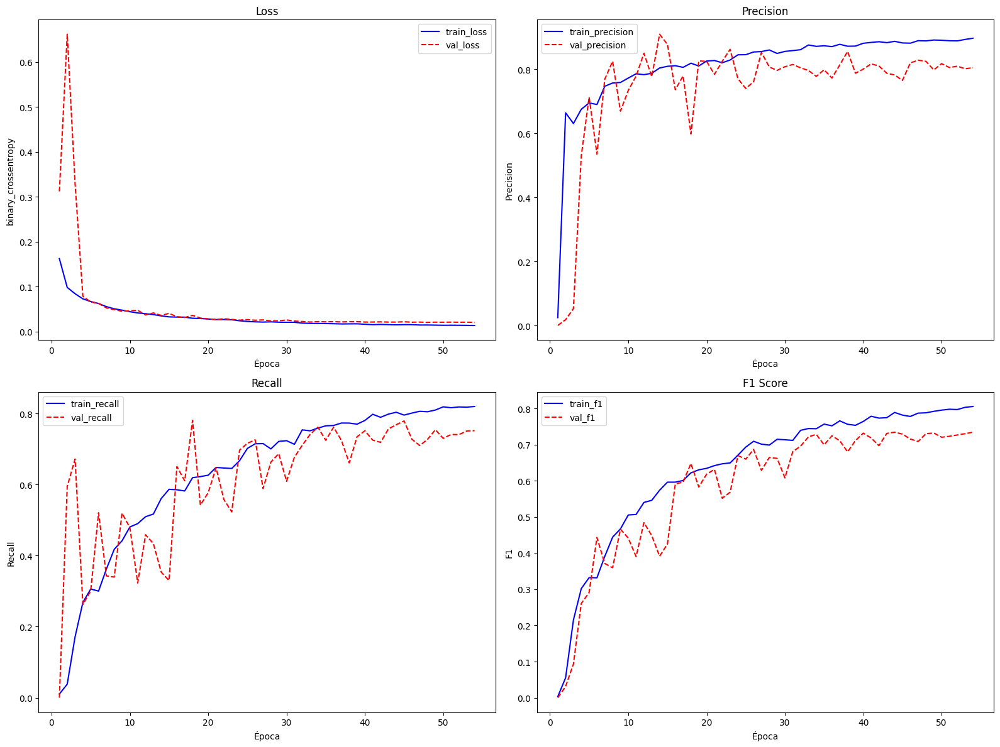

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - f1_score: 0.7056 - loss: 0.0193 - precision: 0.8341 - recall: 0.7522
Resultados en test:
  Loss:      0.0189
  Precision: 0.8343
  Recall:    0.7490
  F1 Score:  0.7178
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


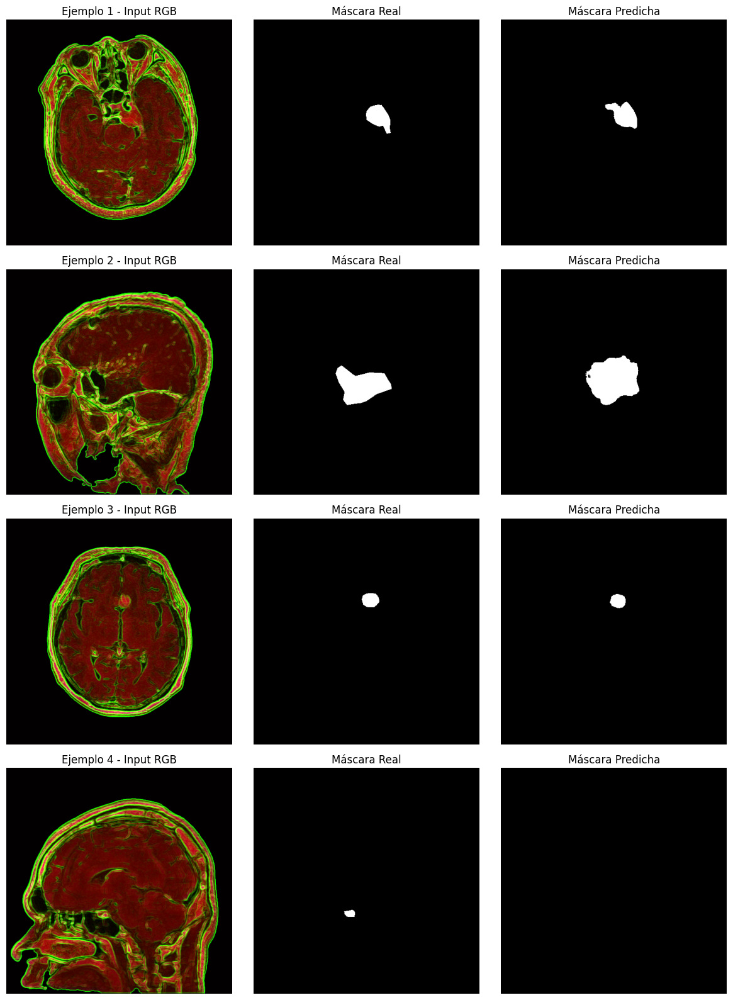

In [ ]:
# ---------------------------------------
# 1) Plot training history
# ---------------------------------------
hist = history.history

epochs = range(1, len(hist["loss"]) + 1)

plt.figure(figsize=(16, 12))

# Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, hist["loss"], "b-", label="train_loss")
plt.plot(epochs, hist["val_loss"], "r--", label="val_loss")
plt.title("Loss")
plt.xlabel("Época")
plt.ylabel("binary_crossentropy")
plt.legend()

# Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, hist["precision"], "b-", label="train_precision")
plt.plot(epochs, hist["val_precision"], "r--", label="val_precision")
plt.title("Precision")
plt.xlabel("Época")
plt.ylabel("Precision")
plt.legend()

# Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, hist["recall"], "b-", label="train_recall")
plt.plot(epochs, hist["val_recall"], "r--", label="val_recall")
plt.title("Recall")
plt.xlabel("Época")
plt.ylabel("Recall")
plt.legend()

# F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs, hist["f1_score"], "b-", label="train_f1")
plt.plot(epochs, hist["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score")
plt.xlabel("Época")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------------------
# 2) Evaluate on the test dataset
# ---------------------------------------
results = unet_rgb.evaluate(test_rgb_ds)
print("Resultados en test:")
print(f"  Loss:      {results[0]:.4f}")
print(f"  Precision: {results[1]:.4f}")
print(f"  Recall:    {results[2]:.4f}")
print(f"  F1 Score:  {results[3]:.4f}")

# ---------------------------------------
# 3) Take 4 random images from the test set for comparison
# ---------------------------------------
# Unbatch + shuffle to select 4 examples
samples = test_rgb_ds.unbatch().shuffle(buffer_size=100).take(4)

# Set up figure with 4 rows x 3 columns
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples):
    # img_rgb: float32 [0,1], shape=(H,W,3); true_mask: float32 [0,1], shape=(H,W,1)
    # 1) Predict
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]  # shape=(H,W)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # 2) Convert tensors to numpy
    img_np = img_rgb.numpy()  # (H,W,3)
    mask_np = true_mask.numpy()[..., 0]  # (H,W)

    # 3) Display original (RGB variant), true mask, and predicted mask
    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Original (RGB)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # True mask (binary)
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Predicted mask (binary)
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ----------------------------------------------------------
# Continue training using the second training set
# ----------------------------------------------------------

# 2) Callbacks similar to before (will save the best model according to val_f1_score)
callbacks_finetune = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb_finetune.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=5,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.4,
        patience=3,
        min_lr=1e-7
    )
]

# 3) Continue training with train_v2_rgb_ds
history_finetune = unet_rgb.fit(
    train_v2_rgb_ds,                # now use the second training dataset
    epochs=50,                      # adjust as needed
    validation_data=val_rgb_ds,
    callbacks=callbacks_finetune
)

# 4) Evaluate again on validation
results_finetune = unet_rgb.evaluate(val_rgb_ds)
print({
    "loss_val":  results_finetune[0],
    "precision": results_finetune[1],
    "recall":    results_finetune[2],
    "f1_score":  results_finetune[3]
})


Epoch 1/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.7296 - loss: 0.0196 - precision: 0.8129 - recall: 0.7466

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7295 - loss: 0.0196 - precision: 0.8130 - recall: 0.7464 - val_f1_score: 0.7303 - val_loss: 0.0201 - val_precision: 0.8232 - val_recall: 0.7229 - learning_rate: 3.1250e-06
Epoch 2/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7270 - loss: 0.0192 - precision: 0.8481 - recall: 0.7214

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7269 - loss: 0.0192 - precision: 0.8481 - recall: 0.7213 - val_f1_score: 0.7373 - val_loss: 0.0201 - val_precision: 0.8142 - val_recall: 0.7415 - learning_rate: 3.1250e-06
Epoch 3/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.7158 - loss: 0.0195 - precision: 0.8535 - recall: 0.7136

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7159 - loss: 0.0195 - precision: 0.8535 - recall: 0.7138 - val_f1_score: 0.7383 - val_loss: 0.0197 - val_precision: 0.8290 - val_recall: 0.7311 - learning_rate: 3.1250e-06
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.7323 - loss: 0.0190 - precision: 0.8643 - recall: 0.7250 - val_f1_score: 0.7375 - val_loss: 0.0198 - val_precision: 0.8233 - val_recall: 0.7357 - learning_rate: 3.1250e-06
Epoch 5/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.7027 - loss: 0.0183 - precision: 0.8496 - recall: 0.7174

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7030 - loss: 0.0183 - precision: 0.8496 - recall: 0.7175 - val_f1_score: 0.7391 - val_loss: 0.0197 - val_precision: 0.8240 - val_recall: 0.7379 - learning_rate: 3.1250e-06
Epoch 6/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7161 - loss: 0.0184 - precision: 0.8483 - recall: 0.7202

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7163 - loss: 0.0184 - precision: 0.8484 - recall: 0.7203 - val_f1_score: 0.7407 - val_loss: 0.0197 - val_precision: 0.8211 - val_recall: 0.7420 - learning_rate: 3.1250e-06
Epoch 7/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.7220 - loss: 0.0176 - precision: 0.8570 - recall: 0.7320

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7221 - loss: 0.0176 - precision: 0.8569 - recall: 0.7319 - val_f1_score: 0.7409 - val_loss: 0.0196 - val_precision: 0.8228 - val_recall: 0.7432 - learning_rate: 3.1250e-06
Epoch 8/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.7389 - loss: 0.0177 - precision: 0.8639 - recall: 0.7457 - val_f1_score: 0.7399 - val_loss: 0.0197 - val_precision: 0.8290 - val_recall: 0.7346 - learning_rate: 3.1250e-06
Epoch 9/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.7326 - loss: 0.0178 - precision: 0.8703 - recall: 0.7282 - val_f1_score: 0.7369 - val_loss: 0.0195 - val_precision: 0.8377 - val_recall: 0.7286 - learning_rate: 3.1250e-06
Epoch 10/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - f1_score: 0.7343 - loss: 0.0182 - precision: 0.8603 - recall: 0.7234

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7342 - loss: 0.0182 - precision: 0.8602 - recall: 0.7234 - val_f1_score: 0.7441 - val_loss: 0.0196 - val_precision: 0.8226 - val_recall: 0.7482 - learning_rate: 3.1250e-06
Epoch 11/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7238 - loss: 0.0198 - precision: 0.8486 - recall: 0.7302 - val_f1_score: 0.7403 - val_loss: 0.0195 - val_precision: 0.8361 - val_recall: 0.7313 - learning_rate: 3.1250e-06
Epoch 12/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7241 - loss: 0.0177 - precision: 0.8563 - recall: 0.7248

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7242 - loss: 0.0177 - precision: 0.8563 - recall: 0.7249 - val_f1_score: 0.7442 - val_loss: 0.0194 - val_precision: 0.8266 - val_recall: 0.7442 - learning_rate: 3.1250e-06
Epoch 13/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7320 - loss: 0.0177 - precision: 0.8526 - recall: 0.7467 - val_f1_score: 0.7408 - val_loss: 0.0193 - val_precision: 0.8310 - val_recall: 0.7406 - learning_rate: 3.1250e-06
Epoch 14/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7324 - loss: 0.0179 - precision: 0.8463 - recall: 0.7373

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7324 - loss: 0.0179 - precision: 0.8464 - recall: 0.7372 - val_f1_score: 0.7443 - val_loss: 0.0193 - val_precision: 0.8275 - val_recall: 0.7455 - learning_rate: 1.2500e-06
Epoch 15/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.7302 - loss: 0.0169 - precision: 0.8553 - recall: 0.7421

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 340ms/step - f1_score: 0.7302 - loss: 0.0169 - precision: 0.8553 - recall: 0.7420 - val_f1_score: 0.7448 - val_loss: 0.0194 - val_precision: 0.8234 - val_recall: 0.7488 - learning_rate: 1.2500e-06
Epoch 16/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7350 - loss: 0.0180 - precision: 0.8507 - recall: 0.7413

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7350 - loss: 0.0180 - precision: 0.8508 - recall: 0.7412 - val_f1_score: 0.7454 - val_loss: 0.0194 - val_precision: 0.8239 - val_recall: 0.7496 - learning_rate: 1.2500e-06
Epoch 17/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - f1_score: 0.7484 - loss: 0.0171 - precision: 0.8583 - recall: 0.7423 - val_f1_score: 0.7440 - val_loss: 0.0193 - val_precision: 0.8324 - val_recall: 0.7404 - learning_rate: 1.2500e-06
Epoch 18/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7345 - loss: 0.0174 - precision: 0.8681 - recall: 0.7407 - val_f1_score: 0.7450 - val_loss: 0.0194 - val_precision: 0.8283 - val_recall: 0.7440 - learning_rate: 1.2500e-06
Epoch 19/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7397 - loss: 0.0172 - precision: 0.8684 - recall: 0.7427 - val_f1_score: 0.7439 - val_loss: 0.0194 - val_precision: 0.8282 - val_recall: 0.7439 - learning_rate: 1.2500e-06
Epoch 20/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s

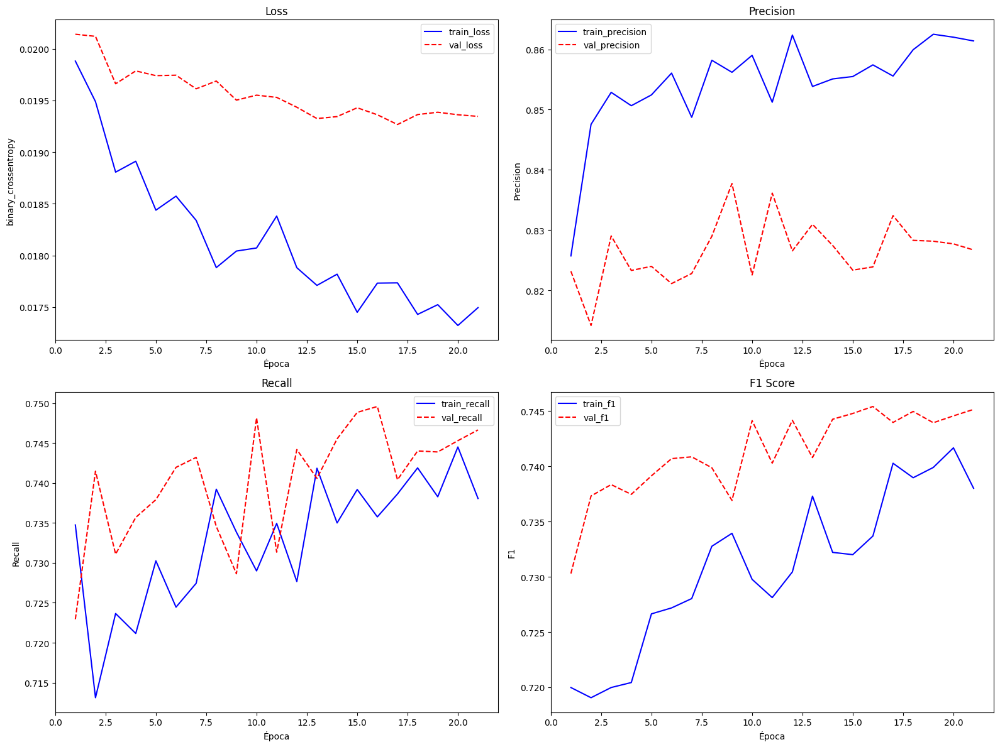

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - f1_score: 0.7112 - loss: 0.0173 - precision: 0.8666 - recall: 0.7417
Resultados en test:
  Loss:      0.0171
  Precision: 0.8670
  Recall:    0.7359
  F1 Score:  0.7240
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


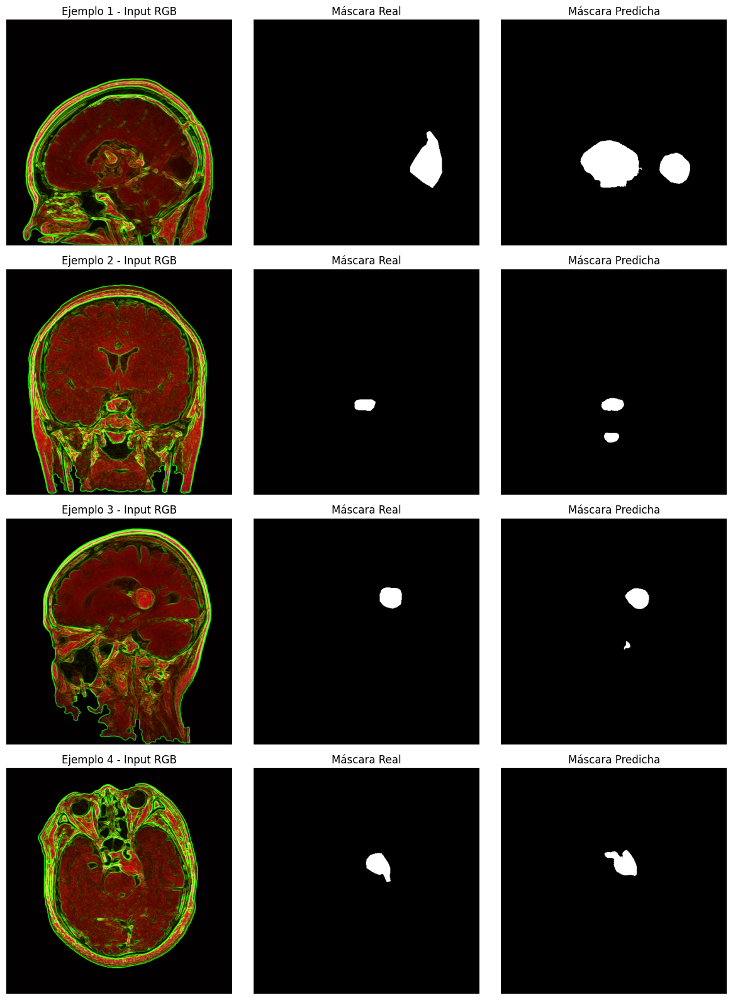

In [ ]:
# ---------------------------------------
# 1) Plot the training history
# ---------------------------------------
hist = history_finetune.history

epochs = range(1, len(hist["loss"]) + 1)

plt.figure(figsize=(16, 12))

# Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, hist["loss"], "b-", label="train_loss")
plt.plot(epochs, hist["val_loss"], "r--", label="val_loss")
plt.title("Loss")
plt.xlabel("Época")
plt.ylabel("binary_crossentropy")
plt.legend()

# Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, hist["precision"], "b-", label="train_precision")
plt.plot(epochs, hist["val_precision"], "r--", label="val_precision")
plt.title("Precision")
plt.xlabel("Época")
plt.ylabel("Precision")
plt.legend()

# Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, hist["recall"], "b-", label="train_recall")
plt.plot(epochs, hist["val_recall"], "r--", label="val_recall")
plt.title("Recall")
plt.xlabel("Época")
plt.ylabel("Recall")
plt.legend()

# F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs, hist["f1_score"], "b-", label="train_f1")
plt.plot(epochs, hist["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score")
plt.xlabel("Época")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------------------
# 2) Evaluate on the test dataset
# ---------------------------------------
results = unet_rgb.evaluate(test_rgb_ds)
print("Resultados en test:")
print(f"  Loss:      {results[0]:.4f}")
print(f"  Precision: {results[1]:.4f}")
print(f"  Recall:    {results[2]:.4f}")
print(f"  F1 Score:  {results[3]:.4f}")

# ---------------------------------------
# 3) Take 4 random images from the test set for comparison
# ---------------------------------------
# Unbatch + shuffle to select 4 examples
samples = test_rgb_ds.unbatch().shuffle(buffer_size=100).take(4)

# Set up figure with 4 rows x 3 columns
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples):
    # img_rgb: float32 [0,1], shape=(H,W,3); true_mask: float32 [0,1], shape=(H,W,1)
    # 1) Predict
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]  # shape=(H,W)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # 2) Convert tensors to numpy
    img_np = img_rgb.numpy()  # (H,W,3)
    mask_np = true_mask.numpy()[..., 0]  # (H,W)

    # 3) Display original (RGB), true mask, and predicted mask
    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Original (RGB)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # True mask (binary)
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Predicted mask (binary)
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ----------------------------------------------------------
# Continue training using the second training set
# ----------------------------------------------------------

# 2) Callbacks similar to before (will save the best model according to val_f1_score)
callbacks_finetune = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb_finetune.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=5,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.3,
        patience=3,
        min_lr=1e-7
    )
]

# 3) Continue training with train_v2_rgb_ds
history_finetune = unet_rgb.fit(
    train_v2_rgb_ds,                # now use the second training dataset
    epochs=50,                      # adjust as needed
    validation_data=val_rgb_ds,
    callbacks=callbacks_finetune
)

# 4) Evaluate again on validation
results_finetune = unet_rgb.evaluate(val_rgb_ds)
print({
    "loss_val":  results_finetune[0],
    "precision": results_finetune[1],
    "recall":    results_finetune[2],
    "f1_score":  results_finetune[3]
})


Epoch 1/50
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - f1_score: 0.7337 - loss: 0.0181 - precision: 0.8492 - recall: 0.7439

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 339ms/step - f1_score: 0.7337 - loss: 0.0181 - precision: 0.8493 - recall: 0.7439 - val_f1_score: 0.7459 - val_loss: 0.0194 - val_precision: 0.8229 - val_recall: 0.7501 - learning_rate: 5.0000e-07
Epoch 2/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - f1_score: 0.7301 - loss: 0.0176 - precision: 0.8564 - recall: 0.7354 - val_f1_score: 0.7450 - val_loss: 0.0193 - val_precision: 0.8253 - val_recall: 0.7477 - learning_rate: 5.0000e-07
Epoch 3/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.7234 - loss: 0.0184 - precision: 0.8586 - recall: 0.7262 - val_f1_score: 0.7449 - val_loss: 0.0193 - val_precision: 0.8247 - val_recall: 0.7482 - learning_rate: 5.0000e-07
Epoch 4/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - f1_score: 0.7338 - loss: 0.0173 - precision: 0.8614 - recall: 0.7363 - val_f1_score: 0.7436 - val_loss: 0.0193 - val_precision: 0.8302 - val_recall: 0.7425 - learning_rate: 5.0000e-07
Epoch 5/50
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331

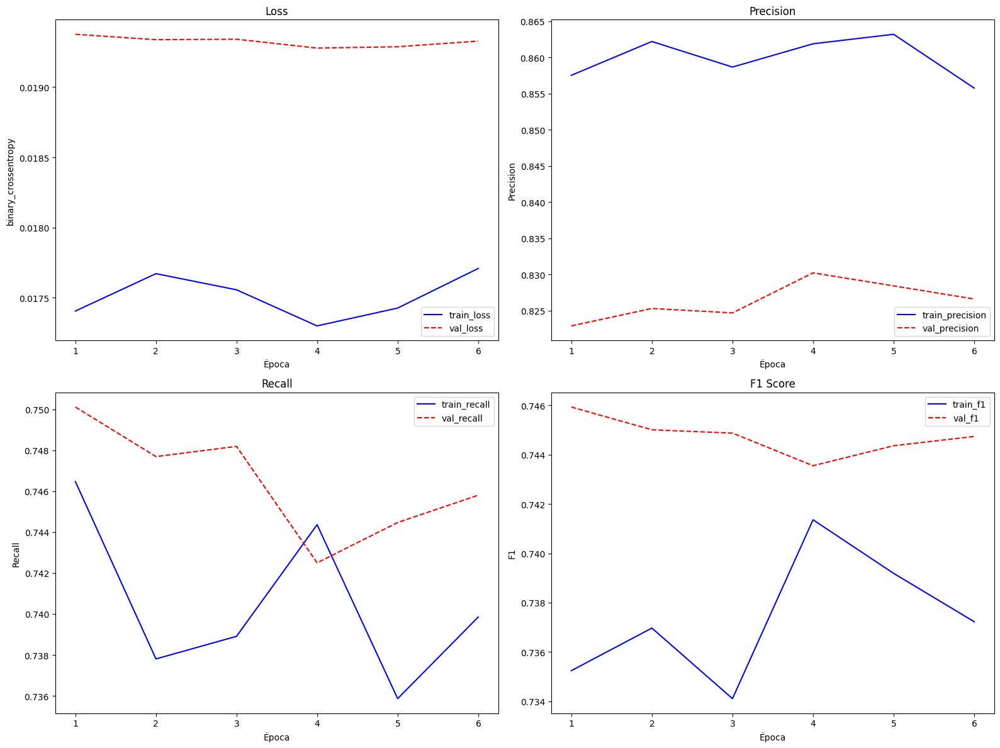

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - f1_score: 0.7118 - loss: 0.0173 - precision: 0.8663 - recall: 0.7425
Resultados en test:
  Loss:      0.0171
  Precision: 0.8665
  Recall:    0.7363
  F1 Score:  0.7243
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


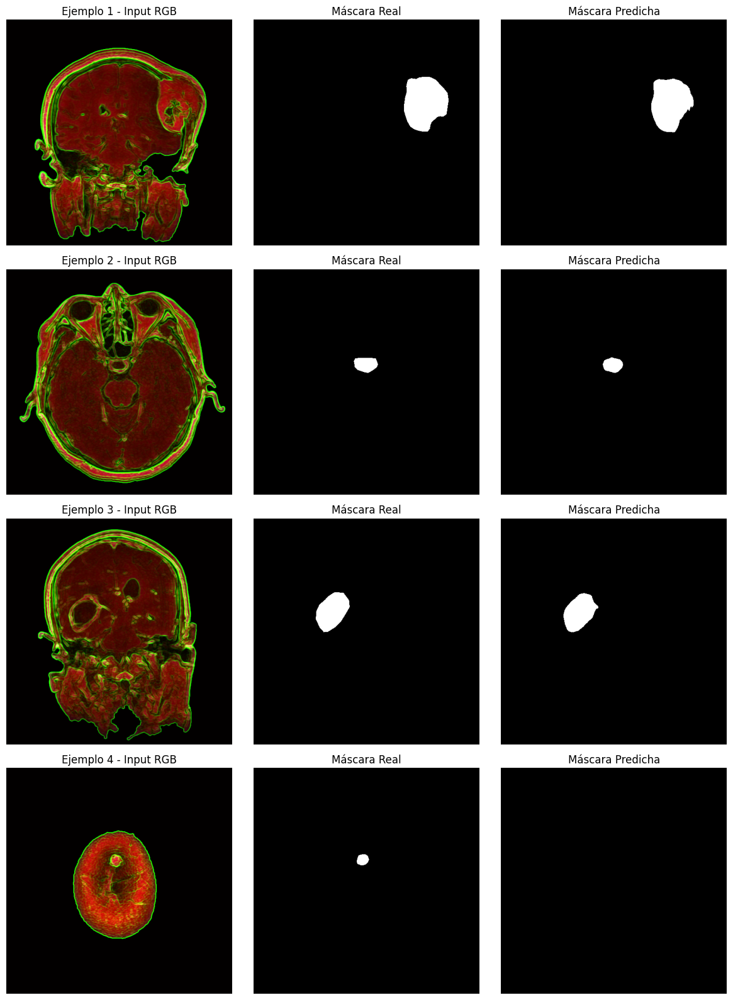

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# ---------------------------------------
# 1) Plot training history
# ---------------------------------------
# Assume that `history_finetune` comes from unet_rgb.fit(...)
hist = history_finetune.history

epochs = range(1, len(hist["loss"]) + 1)

plt.figure(figsize=(16, 12))

# Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, hist["loss"], "b-", label="train_loss")
plt.plot(epochs, hist["val_loss"], "r--", label="val_loss")
plt.title("Loss")
plt.xlabel("Época")
plt.ylabel("binary_crossentropy")
plt.legend()

# Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, hist["precision"], "b-", label="train_precision")
plt.plot(epochs, hist["val_precision"], "r--", label="val_precision")
plt.title("Precision")
plt.xlabel("Época")
plt.ylabel("Precision")
plt.legend()

# Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, hist["recall"], "b-", label="train_recall")
plt.plot(epochs, hist["val_recall"], "r--", label="val_recall")
plt.title("Recall")
plt.xlabel("Época")
plt.ylabel("Recall")
plt.legend()

# F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs, hist["f1_score"], "b-", label="train_f1")
plt.plot(epochs, hist["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score")
plt.xlabel("Época")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------------------
# 2) Evaluate on the test dataset
# ---------------------------------------
results = unet_rgb.evaluate(test_rgb_ds)
print("Resultados en test:")
print(f"  Loss:      {results[0]:.4f}")
print(f"  Precision: {results[1]:.4f}")
print(f"  Recall:    {results[2]:.4f}")
print(f"  F1 Score:  {results[3]:.4f}")

# ---------------------------------------
# 3) Take 4 random images from the test set for comparison
# ---------------------------------------
# Unbatch + shuffle to select 4 examples
samples = test_rgb_ds.unbatch().shuffle(buffer_size=100).take(4)

# Set up figure with 4 rows x 3 columns
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples):
    # img_rgb: float32 [0,1], shape=(H,W,3); true_mask: float32 [0,1], shape=(H,W,1)
    # 1) Predict
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]  # shape=(H,W)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # 2) Convert tensors to numpy
    img_np = img_rgb.numpy()  # (H,W,3)
    mask_np = true_mask.numpy()[..., 0]  # (H,W)

    # 3) Display original (RGB variants), true mask, and predicted mask
    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Original (RGB)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # True mask (binary)
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Predicted mask (binary)
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


    269/Unknown 132s 362ms/step - f1_score: 0.7642 - loss: 0.0163 - precision: 0.8762 - recall: 0.7775

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


269/269 ━━━━━━━━━━━━━━━━━━━━ 145s 411ms/step - f1_score: 0.7642 - loss: 0.0163 - precision: 0.8761 - recall: 0.7774 - val_f1_score: 0.7426 - val_loss: 0.0198 - val_precision: 0.8108 - val_recall: 0.7498 - learning_rate: 2.0000e-05
Epoch 2/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7606 - loss: 0.0164 - precision: 0.8724 - recall: 0.7713

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 294ms/step - f1_score: 0.7606 - loss: 0.0164 - precision: 0.8724 - recall: 0.7713 - val_f1_score: 0.7446 - val_loss: 0.0199 - val_precision: 0.7879 - val_recall: 0.7722 - learning_rate: 2.0000e-05
Epoch 3/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7682 - loss: 0.0166 - precision: 0.8759 - recall: 0.7822

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.7681 - loss: 0.0166 - precision: 0.8758 - recall: 0.7822 - val_f1_score: 0.7352 - val_loss: 0.0196 - val_precision: 0.8437 - val_recall: 0.7176 - learning_rate: 2.0000e-05
Epoch 4/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7679 - loss: 0.0157 - precision: 0.8806 - recall: 0.7764

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.7679 - loss: 0.0157 - precision: 0.8806 - recall: 0.7763 - val_f1_score: 0.7147 - val_loss: 0.0201 - val_precision: 0.8666 - val_recall: 0.6739 - learning_rate: 2.0000e-05
Epoch 5/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7649 - loss: 0.0163 - precision: 0.8717 - recall: 0.7724

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.7648 - loss: 0.0163 - precision: 0.8717 - recall: 0.7724 - val_f1_score: 0.7394 - val_loss: 0.0200 - val_precision: 0.7964 - val_recall: 0.7639 - learning_rate: 2.0000e-05
Epoch 6/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7754 - loss: 0.0152 - precision: 0.8780 - recall: 0.7864

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.7753 - loss: 0.0152 - precision: 0.8779 - recall: 0.7863 - val_f1_score: 0.7429 - val_loss: 0.0194 - val_precision: 0.8020 - val_recall: 0.7580 - learning_rate: 2.0000e-05
Epoch 7/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7766 - loss: 0.0150 - precision: 0.8800 - recall: 0.7900

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 294ms/step - f1_score: 0.7766 - loss: 0.0150 - precision: 0.8800 - recall: 0.7900 - val_f1_score: 0.7544 - val_loss: 0.0187 - val_precision: 0.8209 - val_recall: 0.7601 - learning_rate: 1.0000e-05
Epoch 8/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7796 - loss: 0.0150 - precision: 0.8793 - recall: 0.7941

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 85s 289ms/step - f1_score: 0.7796 - loss: 0.0150 - precision: 0.8793 - recall: 0.7941 - val_f1_score: 0.7414 - val_loss: 0.0186 - val_precision: 0.8451 - val_recall: 0.7345 - learning_rate: 1.0000e-05
Epoch 9/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7846 - loss: 0.0138 - precision: 0.8817 - recall: 0.8045

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.7846 - loss: 0.0138 - precision: 0.8817 - recall: 0.8045 - val_f1_score: 0.7507 - val_loss: 0.0184 - val_precision: 0.8290 - val_recall: 0.7556 - learning_rate: 1.0000e-05
Epoch 10/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7895 - loss: 0.0142 - precision: 0.8864 - recall: 0.7976

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.7894 - loss: 0.0142 - precision: 0.8863 - recall: 0.7975 - val_f1_score: 0.7450 - val_loss: 0.0180 - val_precision: 0.8518 - val_recall: 0.7374 - learning_rate: 1.0000e-05
Epoch 11/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7910 - loss: 0.0140 - precision: 0.8894 - recall: 0.7987

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.7909 - loss: 0.0140 - precision: 0.8894 - recall: 0.7986 - val_f1_score: 0.7525 - val_loss: 0.0185 - val_precision: 0.8153 - val_recall: 0.7696 - learning_rate: 1.0000e-05
Epoch 12/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7908 - loss: 0.0145 - precision: 0.8834 - recall: 0.8020

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 295ms/step - f1_score: 0.7907 - loss: 0.0145 - precision: 0.8834 - recall: 0.8020 - val_f1_score: 0.7641 - val_loss: 0.0183 - val_precision: 0.8075 - val_recall: 0.7898 - learning_rate: 5.0000e-06
Epoch 13/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.7879 - loss: 0.0146 - precision: 0.8783 - recall: 0.8057

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.7879 - loss: 0.0146 - precision: 0.8783 - recall: 0.8057 - val_f1_score: 0.7574 - val_loss: 0.0180 - val_precision: 0.8341 - val_recall: 0.7624 - learning_rate: 5.0000e-06
Epoch 14/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8070 - loss: 0.0135 - precision: 0.8890 - recall: 0.8171

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 295ms/step - f1_score: 0.8069 - loss: 0.0135 - precision: 0.8890 - recall: 0.8170 - val_f1_score: 0.7655 - val_loss: 0.0180 - val_precision: 0.8158 - val_recall: 0.7807 - learning_rate: 5.0000e-06
Epoch 15/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8062 - loss: 0.0131 - precision: 0.8915 - recall: 0.8236

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8062 - loss: 0.0131 - precision: 0.8914 - recall: 0.8236 - val_f1_score: 0.7609 - val_loss: 0.0182 - val_precision: 0.8233 - val_recall: 0.7700 - learning_rate: 5.0000e-06
Epoch 16/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8039 - loss: 0.0128 - precision: 0.8931 - recall: 0.8253

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8039 - loss: 0.0128 - precision: 0.8931 - recall: 0.8253 - val_f1_score: 0.7528 - val_loss: 0.0182 - val_precision: 0.8257 - val_recall: 0.7639 - learning_rate: 5.0000e-06
Epoch 17/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8060 - loss: 0.0135 - precision: 0.8865 - recall: 0.8142

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8060 - loss: 0.0135 - precision: 0.8865 - recall: 0.8142 - val_f1_score: 0.7611 - val_loss: 0.0183 - val_precision: 0.8152 - val_recall: 0.7774 - learning_rate: 5.0000e-06
Epoch 18/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - f1_score: 0.8006 - loss: 0.0137 - precision: 0.8884 - recall: 0.8129

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 292ms/step - f1_score: 0.8006 - loss: 0.0137 - precision: 0.8884 - recall: 0.8129 - val_f1_score: 0.7603 - val_loss: 0.0181 - val_precision: 0.8275 - val_recall: 0.7681 - learning_rate: 5.0000e-06
Epoch 19/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8081 - loss: 0.0129 - precision: 0.8955 - recall: 0.8145

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 296ms/step - f1_score: 0.8080 - loss: 0.0129 - precision: 0.8955 - recall: 0.8145 - val_f1_score: 0.7657 - val_loss: 0.0180 - val_precision: 0.8192 - val_recall: 0.7815 - learning_rate: 2.5000e-06
Epoch 20/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - f1_score: 0.8072 - loss: 0.0125 - precision: 0.8935 - recall: 0.8266

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 88s 297ms/step - f1_score: 0.8071 - loss: 0.0125 - precision: 0.8935 - recall: 0.8266 - val_f1_score: 0.7694 - val_loss: 0.0181 - val_precision: 0.8102 - val_recall: 0.7909 - learning_rate: 2.5000e-06
Epoch 21/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.8031 - loss: 0.0133 - precision: 0.8912 - recall: 0.8166

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.8031 - loss: 0.0133 - precision: 0.8912 - recall: 0.8166 - val_f1_score: 0.7691 - val_loss: 0.0179 - val_precision: 0.8190 - val_recall: 0.7841 - learning_rate: 2.5000e-06
Epoch 22/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8104 - loss: 0.0127 - precision: 0.8942 - recall: 0.8248

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8104 - loss: 0.0127 - precision: 0.8942 - recall: 0.8247 - val_f1_score: 0.7643 - val_loss: 0.0178 - val_precision: 0.8246 - val_recall: 0.7784 - learning_rate: 2.5000e-06
Epoch 23/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8003 - loss: 0.0131 - precision: 0.8836 - recall: 0.8113

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.8003 - loss: 0.0131 - precision: 0.8836 - recall: 0.8114 - val_f1_score: 0.7686 - val_loss: 0.0179 - val_precision: 0.8111 - val_recall: 0.7934 - learning_rate: 2.5000e-06
Epoch 24/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8105 - loss: 0.0126 - precision: 0.8947 - recall: 0.8286

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 295ms/step - f1_score: 0.8105 - loss: 0.0126 - precision: 0.8947 - recall: 0.8286 - val_f1_score: 0.7740 - val_loss: 0.0177 - val_precision: 0.8157 - val_recall: 0.7937 - learning_rate: 2.5000e-06
Epoch 25/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8093 - loss: 0.0127 - precision: 0.8873 - recall: 0.8267

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8093 - loss: 0.0127 - precision: 0.8873 - recall: 0.8266 - val_f1_score: 0.7710 - val_loss: 0.0179 - val_precision: 0.8161 - val_recall: 0.7915 - learning_rate: 2.5000e-06
Epoch 26/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8120 - loss: 0.0127 - precision: 0.8908 - recall: 0.8262

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8120 - loss: 0.0127 - precision: 0.8908 - recall: 0.8262 - val_f1_score: 0.7673 - val_loss: 0.0180 - val_precision: 0.8114 - val_recall: 0.7944 - learning_rate: 2.5000e-06
Epoch 27/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.8124 - loss: 0.0132 - precision: 0.8862 - recall: 0.8270

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8124 - loss: 0.0132 - precision: 0.8862 - recall: 0.8270 - val_f1_score: 0.7718 - val_loss: 0.0176 - val_precision: 0.8226 - val_recall: 0.7874 - learning_rate: 2.5000e-06
Epoch 28/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8069 - loss: 0.0125 - precision: 0.8883 - recall: 0.8237

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8069 - loss: 0.0125 - precision: 0.8883 - recall: 0.8237 - val_f1_score: 0.7687 - val_loss: 0.0177 - val_precision: 0.8233 - val_recall: 0.7828 - learning_rate: 2.5000e-06
Epoch 29/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - f1_score: 0.8135 - loss: 0.0127 - precision: 0.8913 - recall: 0.8205

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 292ms/step - f1_score: 0.8134 - loss: 0.0127 - precision: 0.8913 - recall: 0.8205 - val_f1_score: 0.7699 - val_loss: 0.0177 - val_precision: 0.8185 - val_recall: 0.7902 - learning_rate: 1.2500e-06
Epoch 30/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.8136 - loss: 0.0119 - precision: 0.8937 - recall: 0.8369

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8135 - loss: 0.0119 - precision: 0.8937 - recall: 0.8369 - val_f1_score: 0.7668 - val_loss: 0.0176 - val_precision: 0.8289 - val_recall: 0.7794 - learning_rate: 1.2500e-06
Epoch 31/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8141 - loss: 0.0129 - precision: 0.8944 - recall: 0.8255

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8140 - loss: 0.0129 - precision: 0.8944 - recall: 0.8255 - val_f1_score: 0.7695 - val_loss: 0.0177 - val_precision: 0.8265 - val_recall: 0.7832 - learning_rate: 1.2500e-06


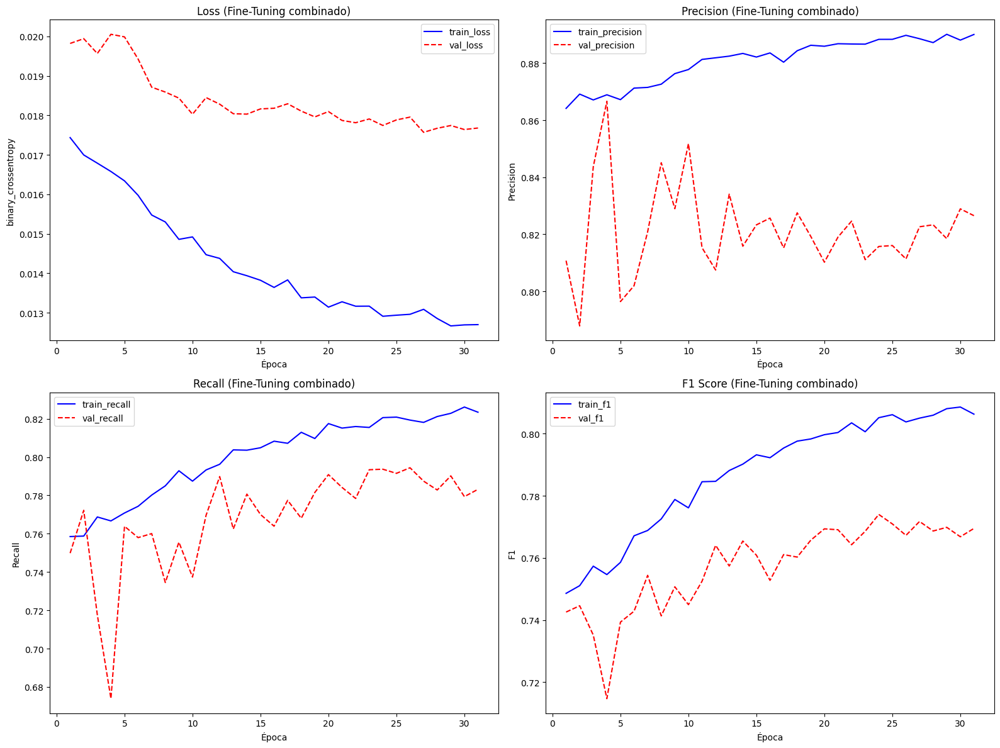

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - f1_score: 0.7375 - loss: 0.0161 - precision: 0.8607 - recall: 0.7751

Resultados en test (dataset combinado):
  Loss:      0.0159
  Precision: 0.8599
  Recall:    0.7715
  F1 Score:  0.7463


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 512, 512, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


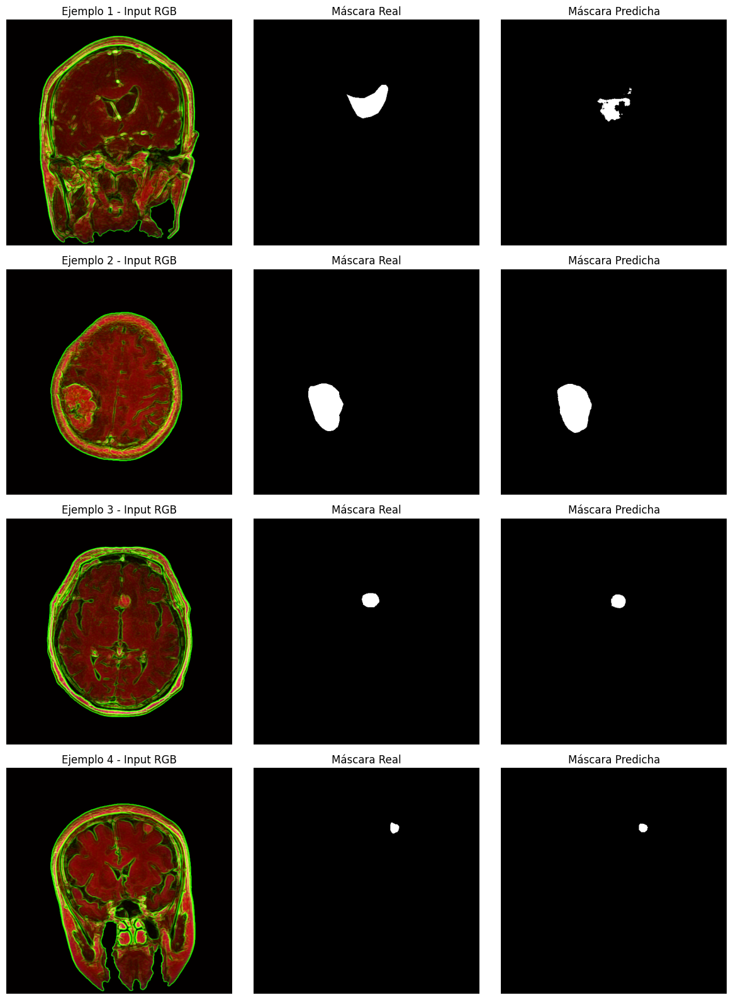

In [ ]:
# ----------------------------------------------------------
# 1) Combine the two training sets into a single one
# ----------------------------------------------------------
# Concatenate train_v1_rgb_ds and train_v2_rgb_ds:
train_combined_ds = train_v1_rgb_ds.concatenate(train_v2_rgb_ds)

# Shuffle a bit (optional) and re-batch into equal-sized batches
# to ensure a random order each epoch:
train_combined_ds = (
    train_combined_ds
    .unbatch()
    .shuffle(buffer_size=1000, seed=SEED)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# ----------------------------------------------------------
# 2) (Optional) Reduce the learning rate for fine-tuning
# ----------------------------------------------------------
# Lower the learning rate slightly so as not to destabilize the model
unet_rgb.optimizer.learning_rate.assign(2e-5)

# ----------------------------------------------------------
# 3) (Optional) Recompile the model to refresh metrics
# ----------------------------------------------------------
# Define Precision, Recall, and F1 Score metrics again
precision_metric = tf.keras.metrics.Precision(name="precision")
recall_metric    = tf.keras.metrics.Recall(name="recall")

def f1_score(y_true, y_pred):
    """
    Compute batch-level F1:
    f1 = 2 * (precision * recall) / (precision + recall)
    """
    y_pred_bin = tf.round(y_pred)
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred_bin, tf.float32)

    tp = tf.reduce_sum(y_true_f * y_pred_f, axis=[1,2,3])
    fp = tf.reduce_sum((1 - y_true_f) * y_pred_f, axis=[1,2,3])
    fn = tf.reduce_sum(y_true_f * (1 - y_pred_f), axis=[1,2,3])

    f1 = 2 * tp / (2 * tp + fp + fn + 1e-7)
    return tf.reduce_mean(f1)

# Recompile, keeping binary_crossentropy as the loss
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
    loss="binary_crossentropy",
    metrics=[precision_metric, recall_metric, f1_score]
)

# ----------------------------------------------------------
# 4) Callbacks: prioritize val_f1 but with precision control
# ----------------------------------------------------------
callbacks_ft = [
    # 4.1) Save the best model according to val_f1_score
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb_combined.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True,
        save_weights_only=False
    ),
    # 4.2) EarlyStopping to avoid overfitting on val_f1_score
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=7,
        restore_best_weights=True
    ),
    # 4.3) ReduceLROnPlateau to lower lr when val_f1 plateaus
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.5,
        patience=4,
        min_lr=1e-7
    )
]

# ----------------------------------------------------------
# 5) Train the model using the combined dataset
#    Since we want to emphasize precision, we can monitor both val_f1_score and val_precision.
#    However, the checkpoint is tied to val_f1_score to ensure balance.
# ----------------------------------------------------------
history_combined = unet_rgb.fit(
    train_combined_ds,
    epochs=50,
    validation_data=val_rgb_ds,
    callbacks=callbacks_ft
)

# ----------------------------------------------------------
# 6) Plot the new training history
# ----------------------------------------------------------
hist_ft = history_combined.history
epochs_ft = range(1, len(hist_ft["loss"]) + 1)

import matplotlib.pyplot as plt

plt.figure(figsize=(16, 12))

# 6.1) Loss
plt.subplot(2, 2, 1)
plt.plot(epochs_ft, hist_ft["loss"], "b-", label="train_loss")
plt.plot(epochs_ft, hist_ft["val_loss"], "r--", label="val_loss")
plt.title("Loss (Fine-Tuning combinado)")
plt.xlabel("Época")
plt.ylabel("binary_crossentropy")
plt.legend()

# 6.2) Precision
plt.subplot(2, 2, 2)
plt.plot(epochs_ft, hist_ft["precision"], "b-", label="train_precision")
plt.plot(epochs_ft, hist_ft["val_precision"], "r--", label="val_precision")
plt.title("Precision (Fine-Tuning combinado)")
plt.xlabel("Época")
plt.ylabel("Precision")
plt.legend()

# 6.3) Recall
plt.subplot(2, 2, 3)
plt.plot(epochs_ft, hist_ft["recall"], "b-", label="train_recall")
plt.plot(epochs_ft, hist_ft["val_recall"], "r--", label="val_recall")
plt.title("Recall (Fine-Tuning combinado)")
plt.xlabel("Época")
plt.ylabel("Recall")
plt.legend()

# 6.4) F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs_ft, hist_ft["f1_score"], "b-", label="train_f1")
plt.plot(epochs_ft, hist_ft["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score (Fine-Tuning combinado)")
plt.xlabel("Época")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ----------------------------------------------------------
# 7) Evaluate on the test set
# ----------------------------------------------------------
results_combined = unet_rgb.evaluate(test_rgb_ds)
print("\nResultados en test (dataset combinado):")
print(f"  Loss:      {results_combined[0]:.4f}")
print(f"  Precision: {results_combined[1]:.4f}")
print(f"  Recall:    {results_combined[2]:.4f}")
print(f"  F1 Score:  {results_combined[3]:.4f}")

# ----------------------------------------------------------
# 8) Visualize 4 random examples from the test (input, true mask, predicted mask)
# ----------------------------------------------------------
# Unbatch + shuffle to take 4 random samples
samples_test = test_rgb_ds.unbatch().shuffle(buffer_size=1000).take(4)

fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples_test):
    # Predict on a sample (expand_dims adds the batch dimension)
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]
    pred_bin = (pred > 0.5).astype(np.uint8)

    img_np = img_rgb.numpy()
    mask_np = true_mask.numpy()[..., 0]

    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Display input (RGB variants)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # Display true mask
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Display predicted mask
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


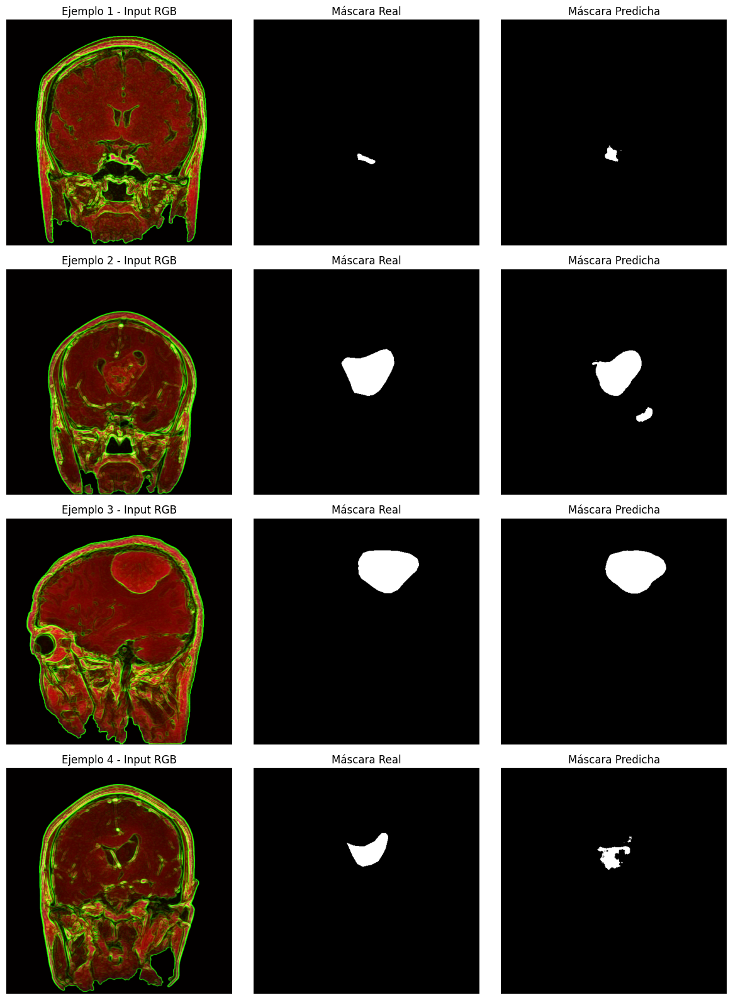

In [ ]:
# ----------------------------------------------------------
# 8) Visualize 4 random test examples (input, true mask, predicted mask)
# ----------------------------------------------------------
# Unbatch + shuffle to take 4 random samples
samples_test = test_rgb_ds.unbatch().shuffle(buffer_size=1000).take(4)

fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples_test):
    # Predict on a sample (expand_dims adds batch dimension)
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]
    pred_bin = (pred > 0.5).astype(np.uint8)

    img_np = img_rgb.numpy()
    mask_np = true_mask.numpy()[..., 0]

    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Display input (RGB variants)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # Display true mask
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Display predicted mask
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


# Tercer Modelo

## 🧩 Revisión del Preprocesamiento y Generación del Dataset RGB

Durante las primeras etapas de entrenamiento del modelo anterior se identificó un **problema crítico**: el método utilizado para eliminar el fondo de las imágenes mediante segmentación binaria y operaciones morfológicas —aunque efectivo para reducir ruido externo— también **removía partes periféricas del cerebro**. Esto representaba un riesgo, ya que **podía eliminar información anatómica relevante**, afectando así el aprendizaje del modelo.

### 🎯 Solución Propuesta: Reconstrucción del Dataset con Filtros y Gabor

Para preservar más información estructural sin sacrificar la limpieza del fondo, se propuso construir un nuevo dataset en el que:

* Se aplica un **filtro Gabor suave** posterior al umbral Otsu para preservar textura relevante en bordes.
* Se procesa la imagen gris con **tres filtros complementarios**, asignando cada uno a un canal RGB:

| Canal | Filtro aplicado               | Descripción breve                         |
| ----- | ----------------------------- | ----------------------------------------- |
| R     | CLAHE                         | Mejora del contraste local de estructuras |
| G     | Sobel                         | Realce de bordes para delimitar regiones  |
| B     | Difference of Gaussians (DoG) | Resalta texturas de mediana frecuencia    |

### 🏗️ Implementación

El preprocesamiento de cada imagen incluye:

1. **Conversión a escala de grises**
2. **Remoción parcial del fondo** usando Otsu + morfología
3. **Filtro Gabor** para suprimir ruido y destacar zonas de interés
4. Aplicación de filtros CLAHE, Sobel y DoG sobre la región resultante
5. Ensamblaje de los tres filtros en un **tensor H×W×3** y normalización `[0,1]`

Este enfoque permite al modelo aprender desde **representaciones enriquecidas** que combinan contraste, bordes y texturas, sin depender de múltiples modalidades médicas.

In [ ]:
BATCH_SIZE  = 8

# Base parameters for the Gabor bank
ksize = 31                # Kernel size (31×31)
sigma = 4.0               # Standard deviation of the Gaussian
gamma = 0.5               # Spatial aspect ratio
psi   = 0                 # Phase offset

# --------------------------------------------------------------
# Python function (with OpenCV) that receives a numpy array HxWx1 uint8
# and returns HxWx3 float32 normalized [0,1], with three filters:
#   R channel = CLAHE
#   G channel = Sobel
#   B channel = DoG (σ1=1.0, σ2=7.0)
# It first removes the background to keep only the brain.
# --------------------------------------------------------------
def apply_filters_to_image(img_np):
    """
    img_np: numpy ndarray shape=(IMG_HEIGHT, IMG_WIDTH, 1), dtype=uint8 (0–255)
    Returns: numpy ndarray shape=(IMG_HEIGHT, IMG_WIDTH, 3), dtype=float32 in [0,1]
    """
    # Ensure it's a NumPy ndarray
    if isinstance(img_np, tf.Tensor):
        img_np = img_np.numpy()

    # Extract single grayscale channel
    gray = img_np[:, :, 0]

    # ---------- Remove background ----------
    # 1) Blur to reduce noise
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    # 2) Otsu thresholding
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # 3) Morphological operations to close holes and remove artifacts
    kernel_morph = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_morph, iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel_morph, iterations=1)
    # 4) Find the largest contour (assuming it is the brain)
    contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_brain = np.zeros_like(gray)
    if contours:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        cv2.drawContours(mask_brain, [contours[0]], -1, 255, -1)
    # 5) Apply the mask to the grayscale to keep only the brain
    brain_gray = cv2.bitwise_and(gray, mask_brain)

    # Create Gabor kernel using base parameters
    kernel = cv2.getGaborKernel((ksize, ksize), sigma, 0.0, 15.0, gamma, psi, ktype=cv2.CV_32F)
    # Filter the image
    resp = cv2.filter2D(brain_gray, cv2.CV_32F, kernel)
    # Convert to 8-bit for display
    resp8 = cv2.convertScaleAbs(resp)
    resp8[resp8 != 0] = 255

    brain_gray = cv2.bitwise_and(gray, resp8)

    # ---------- Filters on brain_gray ----------
    # --- CLAHE filter (R channel)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(23, 23))
    clahe_img = clahe.apply(brain_gray)  # uint8

    # --- Sobel filter (G channel)
    grad_x = cv2.Sobel(brain_gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(brain_gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = cv2.magnitude(grad_x, grad_y)
    sobel_img = cv2.convertScaleAbs(mag)  # uint8

    # --- DoG filter (Difference of Gaussians) (B channel)
    blur1 = cv2.GaussianBlur(brain_gray, (0, 0), 1.0)
    blur2 = cv2.GaussianBlur(brain_gray, (0, 0), 7.0)
    dog = cv2.subtract(blur1, blur2)
    dog_img = cv2.convertScaleAbs(dog)  # uint8

    # Stack into three channels (CLAHE, Sobel, DoG)
    stacked = np.stack([clahe_img, sobel_img, dog_img], axis=-1)

    # Normalize to float32 [0,1]
    stacked = stacked.astype(np.float32) / 255.0
    return stacked

# --------------------------------------------------------------
# TensorFlow function to load and process image + mask
# --------------------------------------------------------------
def load_image_and_mask_rgb(image_path, mask_path):
    """
    1) Reads the grayscale image from `image_path` (uint8),
       resizes to (IMG_HEIGHT, IMG_WIDTH).
    2) Removes background and applies apply_filters_to_image using tf.py_function.
    3) Reads the mask, resizes to (IMG_HEIGHT, IMG_WIDTH, 1),
       and normalizes to float32 [0,1].
    Returns: (imagen_rgb, mask) as float32, shapes [H,W,3] and [H,W,1].
    """
    # --- 3.1) Read and decode the original image (uint8), single channel
    img_data = tf.io.read_file(image_path)
    img_uint8 = tf.image.decode_image(img_data, channels=1)   # shape=(H0, W0, 1)
    img_uint8.set_shape([None, None, 1])

    # Resize to (IMG_HEIGHT, IMG_WIDTH)
    img_resized = tf.image.resize(img_uint8, [IMG_HEIGHT, IMG_WIDTH], method=tf.image.ResizeMethod.BILINEAR)
    # Ensure it's uint8 (0-255)
    img_resized = tf.cast(tf.round(img_resized), tf.uint8)

    # --- 3.2) Remove background and apply filters with tf.py_function
    def _apply_pyfunc(x):
        return apply_filters_to_image(x)
    # x is a uint8 tensor [H,W,1]
    img_rgb = tf.py_function(func=_apply_pyfunc, inp=[img_resized], Tout=tf.float32)
    img_rgb.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])

    # --- 3.3) Read and decode the mask (uint8), single channel
    msk_data = tf.io.read_file(mask_path)
    ext_m = tf.strings.lower(tf.strings.split(mask_path, ".")[-1])
    def _decode_png_m():
        return tf.image.decode_png(msk_data, channels=1)
    def _decode_jpeg_m():
        return tf.image.decode_jpeg(msk_data, channels=1)
    msk_uint8 = tf.cond(
        tf.equal(ext_m, tf.constant("png")),
        true_fn=_decode_png_m,
        false_fn=_decode_jpeg_m
    )
    msk_uint8.set_shape([None, None, 1])

    # Resize mask
    msk_resized = tf.image.resize(msk_uint8, [IMG_HEIGHT, IMG_WIDTH], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    # Normalize to [0,1] float32
    msk = tf.image.convert_image_dtype(msk_resized, tf.float32)  # shape=(H,W,1)

    return img_rgb, msk

# --------------------------------------------------------------
# Augmentation function (same as before)
# --------------------------------------------------------------
def data_augmentation(image, mask):
    """
    Applies augmentations on RGB image and mask:
      1) Random horizontal flip (50%)
      2) Random vertical flip (50%)
      3) Random rotation by k*90°, k ∈ {0,1,2,3}
      4) Contrast and brightness adjustment ONLY to the RGB image
    """
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_left_right(image)
        mask  = tf.image.flip_left_right(mask)

    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_up_down(image)
        mask  = tf.image.flip_up_down(mask)

    k = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)
    image = tf.image.rot90(image, k)
    mask  = tf.image.rot90(mask, k)

    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.image.random_brightness(image, max_delta=0.1)

    return image, mask

# --------------------------------------------------------------
# Function to create a tf.data.Dataset using the RGB variants
# --------------------------------------------------------------
def make_dataset_rgb(file_list, image_dir, mask_dir, augment=False, shuffle_buffer=1000):
    """
    Builds a tf.data.Dataset where each element is:
      - imagen_rgb: shape (IMG_HEIGHT, IMG_WIDTH, 3), float32 [0,1]
      - mask: shape (IMG_HEIGHT, IMG_WIDTH, 1), float32 [0,1]
    """
    image_paths = [tf.strings.join([image_dir, "/", fname]) for fname in file_list]
    mask_paths  = [tf.strings.join([mask_dir, "/", fname])  for fname in file_list]

    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    if shuffle_buffer and shuffle_buffer > 0:
        ds = ds.shuffle(buffer_size=shuffle_buffer, seed=SEED, reshuffle_each_iteration=True)

    # Map: load + remove background + apply RGB filters + decode mask
    ds = ds.map(
        lambda im_pth, m_pth: load_image_and_mask_rgb(im_pth, m_pth),
        num_parallel_calls=AUTOTUNE
    )

    if augment:
        ds = ds.map(
            lambda img, msk: data_augmentation(img, msk),
            num_parallel_calls=AUTOTUNE
        )

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(AUTOTUNE)
    return ds

# --------------------------------------------------------------
# 7) Create the four final datasets (RGB variants + augment)
# --------------------------------------------------------------
train_v1_rgb_ds = make_dataset_rgb(
    file_list=train_v1_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,
    shuffle_buffer=len(train_v1_files)
)

train_v2_rgb_ds = make_dataset_rgb(
    file_list=train_v2_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=True,
    shuffle_buffer=len(train_v2_files)
)

val_rgb_ds = make_dataset_rgb(
    file_list=val_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,
    shuffle_buffer=0
)

test_rgb_ds = make_dataset_rgb(
    file_list=test_files,
    image_dir=image_dir,
    mask_dir=mask_dir,
    augment=False,
    shuffle_buffer=0
)

# --------------------------------------------------------------
# 8) Quick check
# --------------------------------------------------------------
for batch_imgs, batch_msks in train_v1_rgb_ds.take(1):
    print("Batch RGB variant images (shape):", batch_imgs.shape)   # (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 3)
    print("Batch masks (shape):", batch_msks.shape)  # (BATCH_SIZE, IMG_HEIGHT, IMG_WIDTH, 1)
    break

print("RGB variant datasets created successfully.")


Batch imágenes RGB variantes (shape): (8, 512, 512, 3)
Batch máscaras (shape): (8, 512, 512, 1)
Datasets RGB variantes creados correctamente.


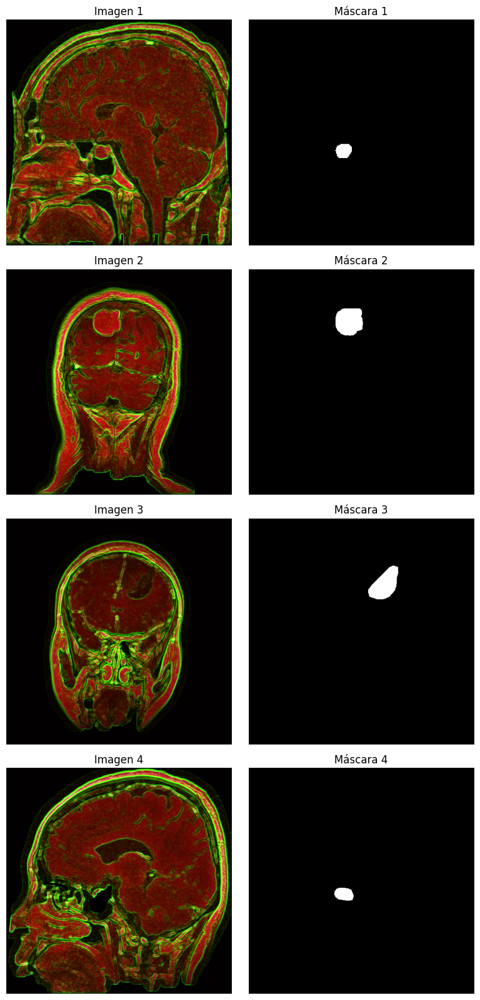

In [ ]:
# 1) Take 4 examples from the dataset (unbatch + take)
samples = test_rgb_ds.unbatch().shuffle(buffer_size=1000).take(4)

imgs = []
msks = []
for im, m in samples:
    imgs.append(im.numpy())
    msks.append(m.numpy())

# 2) Plot in 4 rows × 2 columns: RGB image + mask
fig, axes = plt.subplots(4, 2, figsize=(8, 16))
for i in range(4):
    img = imgs[i]
    mask = msks[i]

    # Display the image (RGB or grayscale with 3 channels)
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Image {i+1}")
    axes[i, 0].axis('off')

    # Display the mask in grayscale
    axes[i, 1].imshow(mask[:, :, 0], cmap='gray')
    axes[i, 1].set_title(f"Mask {i+1}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


## 🧠 Modelo de Segmentación: Attention U-Net para Imágenes RGB Filtradas

Con el nuevo dataset generado a partir de filtros CLAHE, Sobel y DoG como canales RGB, se diseñó una arquitectura basada en **Attention U-Net** específicamente adaptada para entradas de **tamaño 512×512×3**.

### 🧬 Arquitectura General

El modelo sigue la estructura clásica de U-Net con modificaciones clave:

* Incorporación de **bloques de atención** en cada paso del decoder para recalibrar las skip-connections.
* Uso de **Batch Normalization** después de cada convolución.
* Entradas con **tres canales** correspondientes a filtros sobre la imagen cerebral: `R=CLAHE`, `G=Sobel`, `B=DoG`.

### 🔩 Componentes principales

| Módulo           | Descripción                                                                                                                                             |
| ---------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------- |
| `conv_block`     | Dos convoluciones 3×3 con BatchNorm y ReLU.                                                                                                             |
| `attention_gate` | Mecanismo de atención que modula las skip-connections según la señal de gating. Permite al decoder enfocarse en características relevantes del encoder. |
| `upconv_concat`  | Upsampling con transposed convolutions seguido de concatenación con la conexión lateral atenuada y un `conv_block`.                                     |

### 🧱 Detalle de la arquitectura

#### **Encoder (Compresión)**

* 4 bloques de convolución + max pooling.
* Profundidad progresiva: 64 → 128 → 256 → 512 filtros.

#### **Bottleneck**

* Capa intermedia con 1024 filtros y convoluciones profundas.

#### **Decoder (Expansión) con atención**

* Cada nivel aplica una atención sobre el skip correspondiente.
* Upsampling con transposed convolutions (stride 2×2).
* Reconstrucción de forma simétrica: 512 → 256 → 128 → 64 filtros.

#### **Salida**

* Capa final de convolución 1×1 con activación Sigmoid.
* Devuelve una máscara binaria de tamaño 512×512×1.

---

### 🧠 Justificación del Modelo

La incorporación de **Attention Gates** permite que el modelo:

* Se enfoque selectivamente en las regiones relevantes del cerebro, especialmente útil cuando se usan imágenes filtradas.
* Suprima características irrelevantes o ruidosas que puedan persistir tras la preprocesamiento.

Además, la profundidad de la red y el uso de filtros enriquecidos en las entradas le otorgan **una mayor capacidad de discriminación espacial**, mejorando el rendimiento general del modelo.

In [ ]:
# ---------------------------------------------------
# Input parameters for the Attention U-Net on RGB variant dataset
# ---------------------------------------------------
INPUT_HEIGHT   = 512
INPUT_WIDTH    = 512
INPUT_CHANNELS = 3   # Now 3 channels (CLAHE, Sobel, DoG)

# ---------------------------------------------------
# Two-convolution block (Conv → BatchNorm → ReLU) × 2
# ---------------------------------------------------
def conv_block(x, filters, kernel_size=(3,3), padding="same", strides=1):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, kernel_size, strides=1, padding=padding, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    return x

# ---------------------------------------------------
# Attention Gate (AG) with fixed upsampling ×2
# ---------------------------------------------------
def attention_gate(x, g, inter_channels):
    """
    x: skip connection tensor (shape: H × W × C_x)
    g: gating signal tensor (shape: H/2 × W/2 × C_g)
    inter_channels: number of intermediate filters
    """
    # 1) Project x and g into an intermediate space
    theta_x = layers.Conv2D(inter_channels, kernel_size=1, strides=1, padding='same', use_bias=False)(x)
    phi_g   = layers.Conv2D(inter_channels, kernel_size=1, strides=1, padding='same', use_bias=False)(g)

    # 2) Upsample phi_g ×2 to match spatial dimensions of theta_x
    phi_g_up = layers.UpSampling2D(size=(2,2), interpolation='bilinear')(phi_g)

    # 3) Sum and apply ReLU
    f = layers.Activation('relu')(layers.add([theta_x, phi_g_up]))

    # 4) Project to a single channel and apply Sigmoid
    psi = layers.Conv2D(1, kernel_size=1, strides=1, padding='same', use_bias=False)(f)
    psi = layers.BatchNormalization()(psi)
    psi = layers.Activation('sigmoid')(psi)

    # 5) Multiply original skip connection by attention mask
    x_att = layers.multiply([x, psi])
    return x_att

# ---------------------------------------------------
# Up-convolution + concatenation + conv_block block
# ---------------------------------------------------
def upconv_concat(skip, x, filters, kernel_size=(2,2), strides=(2,2), padding="same"):
    """
    skip: encoder tensor (skip connection), dimensions match upsample(x)
    x: tensor from previous decoder step
    """
    x = layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

# ---------------------------------------------------
# Full version of Attention U-Net 512×512 with 3 channels
# ---------------------------------------------------
def build_attention_unet_rgb(input_shape=(INPUT_HEIGHT, INPUT_WIDTH, INPUT_CHANNELS)):
    inputs = layers.Input(shape=input_shape)   # 512×512×3

    # ===== Encoder (Downsampling) =====
    # Block C1: 512×512 → 512×512
    c1 = conv_block(inputs, filters=64)                      # 512×512×64
    p1 = layers.MaxPooling2D(pool_size=(2,2))(c1)            # 256×256×64

    # Block C2: 256×256 → 256×256
    c2 = conv_block(p1, filters=128)                         # 256×256×128
    p2 = layers.MaxPooling2D(pool_size=(2,2))(c2)            # 128×128×128

    # Block C3: 128×128 → 128×128
    c3 = conv_block(p2, filters=256)                         # 128×128×256
    p3 = layers.MaxPooling2D(pool_size=(2,2))(c3)            # 64×64×256

    # Block C4: 64×64 → 64×64
    c4 = conv_block(p3, filters=512)                         # 64×64×512
    p4 = layers.MaxPooling2D(pool_size=(2,2))(c4)            # 32×32×512

    # ===== Bridge (Bottleneck) =====
    c5 = conv_block(p4, filters=1024)                        # 32×32×1024

    # ===== Decoder (Upsampling) with Attention Gates =====
    # Up1: 32×32 → 64×64; AG on c4 with gating from c5
    c4_att = attention_gate(c4, c5, inter_channels=512)      # 64×64×512
    u6 = upconv_concat(c4_att, c5, filters=512)              # 64×64×512

    # Up2: 64×64 → 128×128; AG on c3 with gating from u6
    c3_att = attention_gate(c3, u6, inter_channels=256)      # 128×128×256
    u7 = upconv_concat(c3_att, u6, filters=256)              # 128×128×256

    # Up3: 128×128 → 256×256; AG on c2 with gating from u7
    c2_att = attention_gate(c2, u7, inter_channels=128)      # 256×256×128
    u8 = upconv_concat(c2_att, u7, filters=128)              # 256×256×128

    # Up4: 256×256 → 512×512; AG on c1 with gating from u8
    c1_att = attention_gate(c1, u8, inter_channels=64)       # 512×512×64
    u9 = upconv_concat(c1_att, u8, filters=64)               # 512×512×64

    # ===== Final 1×1 Conv =====
    outputs = layers.Conv2D(1, (1,1), activation="sigmoid")(u9)  # 512×512×1

    return Model(inputs=[inputs], outputs=[outputs], name="Attention-U-Net-RGB-512")


unet_rgb = build_attention_unet_rgb(input_shape=(512, 512, 3))
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.MeanIoU(num_classes=2), "accuracy"]
)
unet_rgb.summary()


Model: "Attention-U-Net-RGB-512"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │      1,728 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,864 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,456 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    294,912 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_4[0][0]  

 Total params: 32,094,865 (122.43 MB)

 Trainable params: 32,083,081 (122.39 MB)

 Non-trainable params: 11,784 (46.03 KB)

## 🧠 Modelo de Segmentación: Attention U-Net RGB

Con el objetivo de mejorar la segmentación de tumores en imágenes de resonancia magnética, se desarrolló un nuevo modelo basado en **Attention U-Net**, optimizado para trabajar con imágenes preprocesadas en un espacio RGB falso. Este modelo se entrenó utilizando un pipeline de tres fases, logrando una mejora progresiva en las métricas de evaluación.

### 🔧 Detalles Técnicos del Modelo

* **Arquitectura base:** Attention U-Net con compuertas de atención en cada etapa del decodificador.
* **Entrada:** Imágenes de tamaño `512×512×3`, donde cada canal corresponde a un filtro distinto aplicado sobre la imagen original:

  * **R**: CLAHE (contraste adaptativo)
  * **G**: Sobel (bordes)
  * **B**: DoG (Difference of Gaussians)
* **Componente clave:** Las *Attention Gates* permiten enfocar el aprendizaje únicamente en las regiones relevantes (por ejemplo, regiones con tejido cerebral), reduciendo el ruido de fondo en las skip connections.

### 📐 Estructura General

| Etapa           | Descripción                                          |
| --------------- | ---------------------------------------------------- |
| Encoder         | 4 bloques de convolución + MaxPooling                |
| Bottleneck      | Bloque de convolución profunda                       |
| Attention Gates | Filtros de atención entre encoder y decoder          |
| Decoder         | 4 bloques de upsampling + concatenación con atención |
| Salida          | Capa `Conv2D(1)` con activación sigmoide             |

### ⚙️ Configuración de Entrenamiento

* **Pérdida:** Binary Crossentropy
* **Métricas:** Precision, Recall, F1 Score
* **Optimizador:** Adam con learning rate ajustado en cada fase
* **Callbacks:** `EarlyStopping`, `ModelCheckpoint`, y `ReduceLROnPlateau`
* **Entrenamiento:** En tres fases:

  1. Dataset inicial (v1)
  2. Fine-tuning con dataset v2
  3. Entrenamiento combinado final

### 📈 Desempeño Final (Set de Test Combinado)

| Métrica   | Valor      |
| --------- | ---------- |
| Loss      | 0.0159     |
| Precision | 0.8587     |
| Recall    | 0.7792     |
| F1 Score  | **0.7634** |

Este modelo representa la versión final entrenada, con el mejor rendimiento global alcanzado hasta el momento en el conjunto de prueba.

In [ ]:
# 1) Define custom Precision, Recall, and F1 metrics
precision_metric = tf.keras.metrics.Precision(name="precision")
recall_metric    = tf.keras.metrics.Recall(name="recall")

def f1_score(y_true, y_pred):
    """
    Compute batch-level F1:
      f1 = 2 * (precision * recall) / (precision + recall)
    Values are approximated by binarizing and counting TP, FP, FN.
    """
    y_pred_bin = tf.round(y_pred)
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred_bin, tf.float32)

    tp = tf.reduce_sum(y_true_f * y_pred_f, axis=[1,2,3])
    fp = tf.reduce_sum((1 - y_true_f) * y_pred_f, axis=[1,2,3])
    fn = tf.reduce_sum(y_true_f * (1 - y_pred_f), axis=[1,2,3])

    f1 = 2 * tp / (2 * tp + fp + fn + 1e-7)
    return tf.reduce_mean(f1)

# 2) Compile the model with Binary Crossentropy + metrics of interest
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[precision_metric, recall_metric, f1_score]
)

# 3) Callbacks to stop training and save the best model based on validation F1
callbacks = [
    # Save the model with the highest validation F1
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True,
        save_weights_only=False,
    ),
    # Stop training if validation F1 does not improve for 10 epochs
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=10,
        restore_best_weights=True
    ),
    # Reduce the learning rate when the metric plateaus
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.5,
        patience=5,
        min_lr=1e-7
    )
]

# 4) Train the model
history = unet_rgb.fit(
    train_v1_rgb_ds,                # training dataset (batches of (image_rgb, mask))
    epochs=110,                     # adjust according to convergence
    validation_data=val_rgb_ds,     # validation dataset
    callbacks=callbacks
)

# 5) Evaluate on the validation/test set
results = unet_rgb.evaluate(val_rgb_ds)
print({
    "loss_val":    results[0],
    "precision":   results[1],
    "recall":      results[2],
    "f1_score":    results[3]
})


Epoch 1/110


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 512, 512, 3))
  warnings.warn(msg)


135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - f1_score: 0.0131 - loss: 0.2505 - precision: 0.0269 - recall: 0.0452

135/135 ━━━━━━━━━━━━━━━━━━━━ 153s 579ms/step - f1_score: 0.0130 - loss: 0.2499 - precision: 0.0269 - recall: 0.0450 - val_f1_score: 0.0000e+00 - val_loss: 0.2902 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 6.4926e-04 - loss: 0.1077 - precision: 0.0760 - recall: 2.7326e-04 - val_f1_score: 0.0000e+00 - val_loss: 0.2625 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.1368 - loss: 0.0901 - precision: 0.6419 - recall: 0.0984

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.1374 - loss: 0.0900 - precision: 0.6422 - recall: 0.0989 - val_f1_score: 0.0799 - val_loss: 0.1297 - val_precision: 0.2544 - val_recall: 0.0745 - learning_rate: 1.0000e-04
Epoch 4/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.2876 - loss: 0.0763 - precision: 0.6673 - recall: 0.2378

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 344ms/step - f1_score: 0.2875 - loss: 0.0762 - precision: 0.6672 - recall: 0.2377 - val_f1_score: 0.2517 - val_loss: 0.1277 - val_precision: 0.1755 - val_recall: 0.4804 - learning_rate: 1.0000e-04
Epoch 5/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - f1_score: 0.3471 - loss: 0.0672 - precision: 0.7111 - recall: 0.3273

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.3470 - loss: 0.0672 - precision: 0.7109 - recall: 0.3271 - val_f1_score: 0.3060 - val_loss: 0.0688 - val_precision: 0.7611 - val_recall: 0.2503 - learning_rate: 1.0000e-04
Epoch 6/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.3596 - loss: 0.0608 - precision: 0.7494 - recall: 0.3201

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.3597 - loss: 0.0608 - precision: 0.7490 - recall: 0.3202 - val_f1_score: 0.4352 - val_loss: 0.0833 - val_precision: 0.3715 - val_recall: 0.6069 - learning_rate: 1.0000e-04
Epoch 7/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.3947 - loss: 0.0569 - precision: 0.7311 - recall: 0.3742 - val_f1_score: 0.4121 - val_loss: 0.0604 - val_precision: 0.5133 - val_recall: 0.4854 - learning_rate: 1.0000e-04
Epoch 8/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.4298 - loss: 0.0525 - precision: 0.7310 - recall: 0.4129 - val_f1_score: 0.3817 - val_loss: 0.0491 - val_precision: 0.8387 - val_recall: 0.3486 - learning_rate: 1.0000e-04
Epoch 9/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.4465 - loss: 0.0486 - precision: 0.7770 - recall: 0.4152 - val_f1_score: 0.3905 - val_loss: 0.0537 - val_precision: 0.6429 - val_recall: 0.4390 - learning_rate: 1.0000e-04
Epoch 10/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.5086 - loss: 0.0438 - precision: 0.7953 - recall: 0.4831 - val_f1_score: 0.4589 - val_loss: 0.0513 - val_precision: 0.5809 - val_recall: 0.4537 - learning_rate: 1.0000e-04
Epoch 11/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.5111 - loss: 0.0421 - precision: 0.7748 - recall: 0.4931 - val_f1_score: 0.4456 - val_loss: 0.0410 - val_precision: 0.8352 - val_recall: 0.3931 - learning_rate: 1.0000e-04
Epoch 12/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - f1_score: 0.5187 - loss: 0.0395 - precision: 0.7984 - recall: 0.5094

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.5188 - loss: 0.0395 - precision: 0.7983 - recall: 0.5092 - val_f1_score: 0.5644 - val_loss: 0.0420 - val_precision: 0.6483 - val_recall: 0.6223 - learning_rate: 1.0000e-04
Epoch 13/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.5617 - loss: 0.0363 - precision: 0.8228 - recall: 0.5480 - val_f1_score: 0.5034 - val_loss: 0.0363 - val_precision: 0.8070 - val_recall: 0.4950 - learning_rate: 1.0000e-04
Epoch 14/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.5917 - loss: 0.0349 - precision: 0.8087 - recall: 0.5877 - val_f1_score: 0.4692 - val_loss: 0.0389 - val_precision: 0.8376 - val_recall: 0.4017 - learning_rate: 1.0000e-04
Epoch 15/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.5410 - loss: 0.0357 - precision: 0.7728 - recall: 0.5378 - val_f1_score: 0.5639 - val_loss: 0.0333 - val_precision: 0.7631 - val_recall: 0.5840 - learning_rate: 1.0000e-04
Epoch 16/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.6554 - loss: 0.0269 - precision: 0.8267 - recall: 0.6657 - val_f1_score: 0.6343 - val_loss: 0.0283 - val_precision: 0.7967 - val_recall: 0.6357 - learning_rate: 5.0000e-05
Epoch 20/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.6550 - loss: 0.0278 - precision: 0.8093 - recall: 0.6632 - val_f1_score: 0.6115 - val_loss: 0.0279 - val_precision: 0.8315 - val_recall: 0.6031 - learning_rate: 5.0000e-05
Epoch 21/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.6780 - loss: 0.0257 - precision: 0.8312 - recall: 0.6801 - val_f1_score: 0.5412 - val_loss: 0.0303 - val_precision: 0.8479 - val_recall: 0.4898 - learning_rate: 5.0000e-05
Epoch 22/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 336ms/step - f1_score: 0.6538 - loss: 0.0248 - precision: 0.8281 - recall: 0.6634 - val_f1_score: 0.6099 - val_loss: 0.0284 - val_precision: 0.8208 - val_recall: 0.5984 - learning_rate: 5.0000e-05
Epoch 23/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.6885 - loss: 0.0241 - precision: 0.8605 - recall: 0.6766 - val_f1_score: 0.6494 - val_loss: 0.0312 - val_precision: 0.6551 - val_recall: 0.7708 - learning_rate: 5.0000e-05
Epoch 25/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.6810 - loss: 0.0254 - precision: 0.8224 - recall: 0.6879 - val_f1_score: 0.6444 - val_loss: 0.0254 - val_precision: 0.8567 - val_recall: 0.5871 - learning_rate: 5.0000e-05
Epoch 26/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.6870 - loss: 0.0244 - precision: 0.8258 - recall: 0.6833

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.6869 - loss: 0.0244 - precision: 0.8259 - recall: 0.6833 - val_f1_score: 0.6748 - val_loss: 0.0252 - val_precision: 0.8342 - val_recall: 0.6499 - learning_rate: 5.0000e-05
Epoch 27/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.6930 - loss: 0.0226 - precision: 0.8511 - recall: 0.7091 - val_f1_score: 0.6715 - val_loss: 0.0266 - val_precision: 0.7448 - val_recall: 0.7180 - learning_rate: 5.0000e-05
Epoch 28/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.6954 - loss: 0.0232 - precision: 0.8437 - recall: 0.7066

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.6955 - loss: 0.0232 - precision: 0.8437 - recall: 0.7066 - val_f1_score: 0.6836 - val_loss: 0.0251 - val_precision: 0.7853 - val_recall: 0.6807 - learning_rate: 5.0000e-05
Epoch 29/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.7139 - loss: 0.0208 - precision: 0.8436 - recall: 0.7328

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7136 - loss: 0.0208 - precision: 0.8436 - recall: 0.7325 - val_f1_score: 0.6990 - val_loss: 0.0253 - val_precision: 0.7433 - val_recall: 0.7358 - learning_rate: 5.0000e-05
Epoch 30/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.6545 - loss: 0.0268 - precision: 0.7990 - recall: 0.6590 - val_f1_score: 0.5824 - val_loss: 0.0275 - val_precision: 0.8901 - val_recall: 0.5050 - learning_rate: 5.0000e-05
Epoch 31/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7043 - loss: 0.0232 - precision: 0.8644 - recall: 0.6944 - val_f1_score: 0.6918 - val_loss: 0.0245 - val_precision: 0.7629 - val_recall: 0.7298 - learning_rate: 5.0000e-05
Epoch 32/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 336ms/step - f1_score: 0.6774 - loss: 0.0237 - precision: 0.8383 - recall: 0.6975 - val_f1_score: 0.6776 - val_loss: 0.0260 - val_precision: 0.7524 - val_recall: 0.7215 - learning_rate: 5.0000e-05
Epoch 33/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7346 - loss: 0.0178 - precision: 0.8645 - recall: 0.7624 - val_f1_score: 0.7085 - val_loss: 0.0218 - val_precision: 0.8250 - val_recall: 0.7019 - learning_rate: 2.5000e-05
Epoch 37/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7426 - loss: 0.0183 - precision: 0.8614 - recall: 0.7535

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7427 - loss: 0.0183 - precision: 0.8615 - recall: 0.7535 - val_f1_score: 0.7098 - val_loss: 0.0223 - val_precision: 0.8029 - val_recall: 0.7304 - learning_rate: 2.5000e-05
Epoch 38/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - f1_score: 0.7610 - loss: 0.0181 - precision: 0.8622 - recall: 0.7639 - val_f1_score: 0.6982 - val_loss: 0.0217 - val_precision: 0.8689 - val_recall: 0.6442 - learning_rate: 2.5000e-05
Epoch 39/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.7570 - loss: 0.0169 - precision: 0.8691 - recall: 0.7635

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7569 - loss: 0.0170 - precision: 0.8691 - recall: 0.7635 - val_f1_score: 0.7153 - val_loss: 0.0229 - val_precision: 0.7551 - val_recall: 0.7754 - learning_rate: 2.5000e-05
Epoch 40/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7692 - loss: 0.0167 - precision: 0.8664 - recall: 0.7941 - val_f1_score: 0.7128 - val_loss: 0.0211 - val_precision: 0.8379 - val_recall: 0.6953 - learning_rate: 2.5000e-05
Epoch 41/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - f1_score: 0.7554 - loss: 0.0178 - precision: 0.8739 - recall: 0.7664

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7555 - loss: 0.0178 - precision: 0.8738 - recall: 0.7664 - val_f1_score: 0.7164 - val_loss: 0.0213 - val_precision: 0.8146 - val_recall: 0.7316 - learning_rate: 2.5000e-05
Epoch 42/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7745 - loss: 0.0167 - precision: 0.8830 - recall: 0.7828 - val_f1_score: 0.7088 - val_loss: 0.0227 - val_precision: 0.8096 - val_recall: 0.6948 - learning_rate: 2.5000e-05
Epoch 43/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - f1_score: 0.7520 - loss: 0.0183 - precision: 0.8733 - recall: 0.7452

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.7521 - loss: 0.0183 - precision: 0.8734 - recall: 0.7456 - val_f1_score: 0.7309 - val_loss: 0.0230 - val_precision: 0.7557 - val_recall: 0.7700 - learning_rate: 2.5000e-05
Epoch 44/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.7811 - loss: 0.0157 - precision: 0.8711 - recall: 0.7913 - val_f1_score: 0.6990 - val_loss: 0.0226 - val_precision: 0.8156 - val_recall: 0.6947 - learning_rate: 2.5000e-05
Epoch 45/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7557 - loss: 0.0173 - precision: 0.8681 - recall: 0.7786 - val_f1_score: 0.7213 - val_loss: 0.0219 - val_precision: 0.7716 - val_recall: 0.7690 - learning_rate: 2.5000e-05
Epoch 46/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7824 - loss: 0.0157 - precision: 0.8841 - recall: 0.8004 - val_f1_score: 0.7068 - val_loss: 0.0217 - val_precision: 0.8185 - val_recall: 0.7084 - learning_rate: 2.5000e-05
Epoch 47/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.7556 - loss: 0.0174 - precision: 0.8904 - recall: 0.7530 - val_f1_score: 0.7334 - val_loss: 0.0216 - val_precision: 0.8011 - val_recall: 0.7328 - learning_rate: 2.5000e-05
Epoch 49/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7839 - loss: 0.0152 - precision: 0.8786 - recall: 0.8029 - val_f1_score: 0.7172 - val_loss: 0.0211 - val_precision: 0.8292 - val_recall: 0.7074 - learning_rate: 2.5000e-05
Epoch 50/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7655 - loss: 0.0153 - precision: 0.8721 - recall: 0.8053 - val_f1_score: 0.7162 - val_loss: 0.0217 - val_precision: 0.8459 - val_recall: 0.6862 - learning_rate: 2.5000e-05
Epoch 51/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.7765 - loss: 0.0162 - precision: 0.8885 - recall: 0.7846 - val_f1_score: 0.7175 - val_loss: 0.0207 - val_precision: 0.8343 - val_recall: 0.7207 - learning_rate: 2.5000e-05
Epoch 52/110
134/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.7689 - loss: 0.0154 - precision: 0.8805 - recall: 0.7881 - val_f1_score: 0.7359 - val_loss: 0.0219 - val_precision: 0.7639 - val_recall: 0.7767 - learning_rate: 2.5000e-05
Epoch 53/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7871 - loss: 0.0148 - precision: 0.8735 - recall: 0.8106 - val_f1_score: 0.7016 - val_loss: 0.0253 - val_precision: 0.7219 - val_recall: 0.7766 - learning_rate: 2.5000e-05
Epoch 54/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7871 - loss: 0.0151 - precision: 0.8773 - recall: 0.8058 - val_f1_score: 0.7270 - val_loss: 0.0224 - val_precision: 0.7357 - val_recall: 0.7903 - learning_rate: 2.5000e-05
Epoch 55/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7883 - loss: 0.0154 - precision: 0.8756 - recall: 0.8085

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7884 - loss: 0.0154 - precision: 0.8756 - recall: 0.8084 - val_f1_score: 0.7392 - val_loss: 0.0206 - val_precision: 0.8238 - val_recall: 0.7357 - learning_rate: 2.5000e-05
Epoch 56/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.7891 - loss: 0.0143 - precision: 0.8827 - recall: 0.8099 - val_f1_score: 0.7333 - val_loss: 0.0204 - val_precision: 0.8006 - val_recall: 0.7480 - learning_rate: 2.5000e-05
Epoch 57/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.8035 - loss: 0.0148 - precision: 0.8884 - recall: 0.8114 - val_f1_score: 0.7327 - val_loss: 0.0211 - val_precision: 0.7846 - val_recall: 0.7568 - learning_rate: 2.5000e-05
Epoch 58/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.7819 - loss: 0.0142 - precision: 0.8658 - recall: 0.8100 - val_f1_score: 0.7298 - val_loss: 0.0247 - val_precision: 0.6832 - val_recall: 0.8251 - learning_rate: 2.5000e-05
Epoch 59/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.8047 - loss: 0.0129 - precision: 0.8938 - recall: 0.8366 - val_f1_score: 0.7413 - val_loss: 0.0205 - val_precision: 0.8190 - val_recall: 0.7457 - learning_rate: 1.2500e-05
Epoch 62/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 336ms/step - f1_score: 0.8115 - loss: 0.0124 - precision: 0.8957 - recall: 0.8390 - val_f1_score: 0.7386 - val_loss: 0.0211 - val_precision: 0.8055 - val_recall: 0.7571 - learning_rate: 1.2500e-05
Epoch 63/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.8029 - loss: 0.0125 - precision: 0.8867 - recall: 0.8409

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 345ms/step - f1_score: 0.8031 - loss: 0.0125 - precision: 0.8869 - recall: 0.8409 - val_f1_score: 0.7423 - val_loss: 0.0208 - val_precision: 0.8024 - val_recall: 0.7589 - learning_rate: 1.2500e-05
Epoch 64/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.8280 - loss: 0.0118 - precision: 0.8960 - recall: 0.8471 - val_f1_score: 0.7380 - val_loss: 0.0218 - val_precision: 0.7563 - val_recall: 0.8000 - learning_rate: 1.2500e-05
Epoch 65/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.8188 - loss: 0.0126 - precision: 0.8840 - recall: 0.8341 - val_f1_score: 0.7351 - val_loss: 0.0216 - val_precision: 0.7856 - val_recall: 0.7697 - learning_rate: 1.2500e-05
Epoch 66/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.8210 - loss: 0.0124 - precision: 0.8991 - recall: 0.8349

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.8211 - loss: 0.0124 - precision: 0.8991 - recall: 0.8350 - val_f1_score: 0.7469 - val_loss: 0.0220 - val_precision: 0.7552 - val_recall: 0.7973 - learning_rate: 1.2500e-05
Epoch 67/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 337ms/step - f1_score: 0.8273 - loss: 0.0110 - precision: 0.8921 - recall: 0.8558 - val_f1_score: 0.7304 - val_loss: 0.0216 - val_precision: 0.8045 - val_recall: 0.7417 - learning_rate: 1.2500e-05
Epoch 68/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.8197 - loss: 0.0122 - precision: 0.8934 - recall: 0.8458 - val_f1_score: 0.7467 - val_loss: 0.0215 - val_precision: 0.7842 - val_recall: 0.7790 - learning_rate: 1.2500e-05
Epoch 69/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.8209 - loss: 0.0121 - precision: 0.9017 - recall: 0.8545 - val_f1_score: 0.7437 - val_loss: 0.0210 - val_precision: 0.8147 - val_recall: 0.7436 - learning_rate: 1.2500e-05
Epoch 70/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 344ms/step - f1_score: 0.8316 - loss: 0.0109 - precision: 0.8964 - recall: 0.8664 - val_f1_score: 0.7474 - val_loss: 0.0211 - val_precision: 0.7991 - val_recall: 0.7661 - learning_rate: 1.2500e-05
Epoch 72/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - f1_score: 0.8415 - loss: 0.0111 - precision: 0.9030 - recall: 0.8660

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.8414 - loss: 0.0111 - precision: 0.9030 - recall: 0.8658 - val_f1_score: 0.7541 - val_loss: 0.0211 - val_precision: 0.8001 - val_recall: 0.7735 - learning_rate: 1.2500e-05
Epoch 73/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 336ms/step - f1_score: 0.8233 - loss: 0.0116 - precision: 0.8922 - recall: 0.8505 - val_f1_score: 0.7396 - val_loss: 0.0220 - val_precision: 0.7962 - val_recall: 0.7696 - learning_rate: 1.2500e-05
Epoch 74/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - f1_score: 0.8412 - loss: 0.0109 - precision: 0.9005 - recall: 0.8640 - val_f1_score: 0.7433 - val_loss: 0.0209 - val_precision: 0.8296 - val_recall: 0.7486 - learning_rate: 1.2500e-05
Epoch 75/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.8452 - loss: 0.0109 - precision: 0.9054 - recall: 0.8715 - val_f1_score: 0.7279 - val_loss: 0.0215 - val_precision: 0.8487 - val_recall: 0.7126 - learning_rate: 1.2500e-05
Epoch 76/110
135/135 ━━━━━━━━━━━━━━━━━━━━

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.8392 - loss: 0.0106 - precision: 0.9079 - recall: 0.8634 - val_f1_score: 0.7556 - val_loss: 0.0209 - val_precision: 0.7809 - val_recall: 0.7847 - learning_rate: 1.2500e-05
Epoch 78/110
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.8373 - loss: 0.0111 - precision: 0.9052 - recall: 0.8568

135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 343ms/step - f1_score: 0.8373 - loss: 0.0111 - precision: 0.9052 - recall: 0.8569 - val_f1_score: 0.7561 - val_loss: 0.0210 - val_precision: 0.8058 - val_recall: 0.7667 - learning_rate: 1.2500e-05
Epoch 79/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.8523 - loss: 0.0104 - precision: 0.9032 - recall: 0.8707 - val_f1_score: 0.7442 - val_loss: 0.0216 - val_precision: 0.8238 - val_recall: 0.7429 - learning_rate: 1.2500e-05
Epoch 80/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.8542 - loss: 0.0098 - precision: 0.9159 - recall: 0.8705 - val_f1_score: 0.7395 - val_loss: 0.0215 - val_precision: 0.8319 - val_recall: 0.7350 - learning_rate: 1.2500e-05
Epoch 81/110
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.8532 - loss: 0.0102 - precision: 0.9130 - recall: 0.8693 - val_f1_score: 0.7493 - val_loss: 0.0221 - val_precision: 0.8116 - val_recall: 0.7520 - learning_rate: 1.2500e-05
Epoch 82/110
135/135 ━━━━━━━━━━━━━━━━━━━━

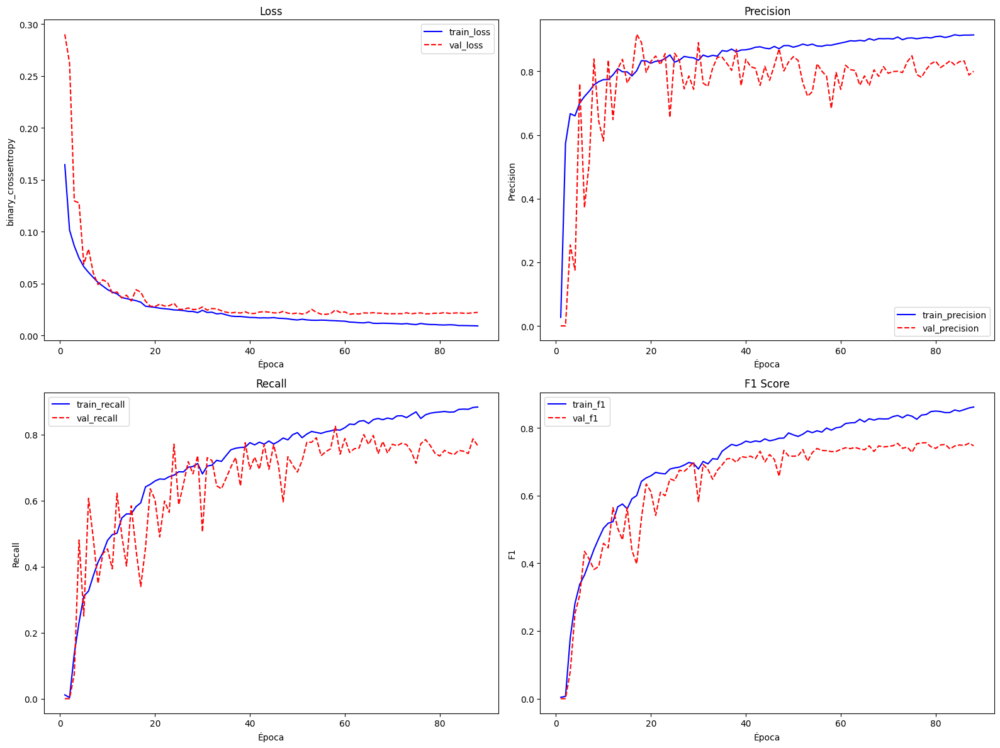

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - f1_score: 0.7340 - loss: 0.0184 - precision: 0.8485 - recall: 0.7707
Resultados en test:
  Loss:      0.0187
  Precision: 0.8429
  Recall:    0.7590
  F1 Score:  0.7435


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 512, 512, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


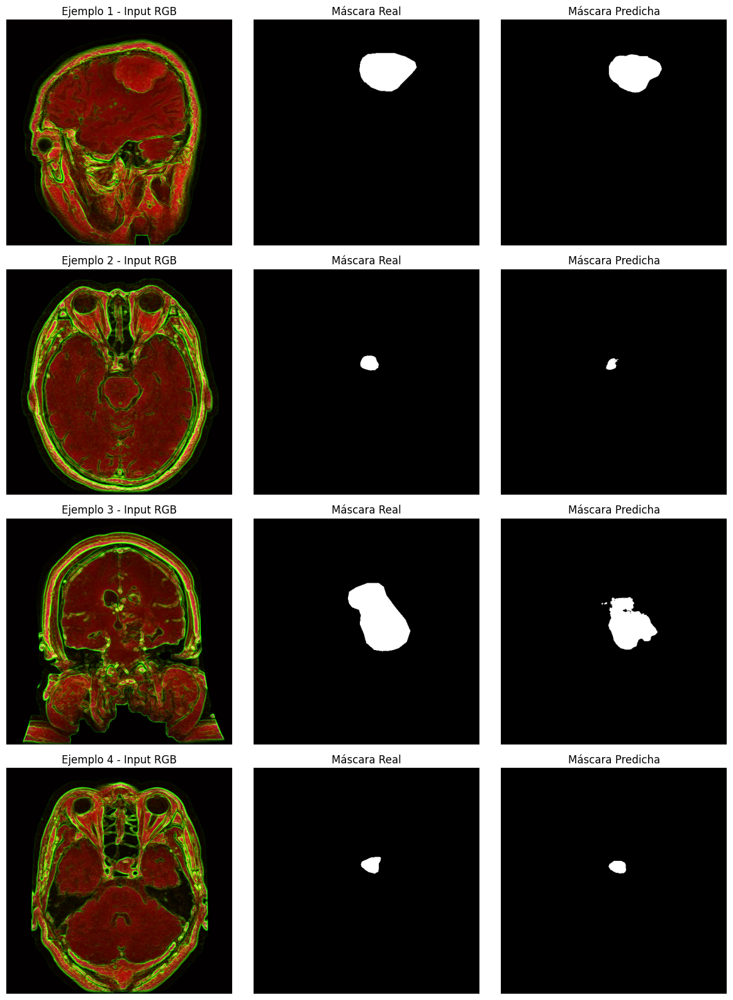

In [ ]:
# ---------------------------------------
# 1) Plot the training history
# ---------------------------------------
# Assume that `history` comes from unet_rgb.fit(...)
hist = history.history

epochs = range(1, len(hist["loss"]) + 1)

plt.figure(figsize=(16, 12))

# Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, hist["loss"], "b-", label="train_loss")
plt.plot(epochs, hist["val_loss"], "r--", label="val_loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("binary_crossentropy")
plt.legend()

# Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, hist["precision"], "b-", label="train_precision")
plt.plot(epochs, hist["val_precision"], "r--", label="val_precision")
plt.title("Precision")
plt.xlabel("Epoch")
plt.ylabel("Precision")
plt.legend()

# Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, hist["recall"], "b-", label="train_recall")
plt.plot(epochs, hist["val_recall"], "r--", label="val_recall")
plt.title("Recall")
plt.xlabel("Epoch")
plt.ylabel("Recall")
plt.legend()

# F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs, hist["f1_score"], "b-", label="train_f1")
plt.plot(epochs, hist["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score")
plt.xlabel("Epoch")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------------------
# 2) Evaluate on the test dataset
# ---------------------------------------
results = unet_rgb.evaluate(test_rgb_ds)
print("Test results:")
print(f"  Loss:      {results[0]:.4f}")
print(f"  Precision: {results[1]:.4f}")
print(f"  Recall:    {results[2]:.4f}")
print(f"  F1 Score:  {results[3]:.4f}")

# ---------------------------------------
# 3) Take 4 random images from the test set for comparison
# ---------------------------------------
# Unbatch + shuffle to select 4 examples
samples = test_rgb_ds.unbatch().shuffle(buffer_size=100).take(4)

# Set up figure with 4 rows × 3 columns
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples):
    # img_rgb: float32 [0,1], shape=(H,W,3); true_mask: float32 [0,1], shape=(H,W,1)
    # 1) Predict
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]  # shape=(H,W)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # 2) Convert tensors to numpy
    img_np = img_rgb.numpy()  # (H,W,3)
    mask_np = true_mask.numpy()[..., 0]  # (H,W)

    # 3) Display original (RGB variants), true mask, and predicted mask
    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Original (RGB)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Example {i+1} - Input RGB")
    ax_img.axis("off")

    # True mask (binary)
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("True Mask")
    ax_mask.axis("off")

    # Predicted mask (binary)
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ----------------------------------------------------------
# Continue training using the second training set
# ----------------------------------------------------------

# 2) Callbacks similar to before (will save the best model based on val_f1_score)
callbacks_finetune = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb_finetune.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=5,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.4,
        patience=3,
        min_lr=1e-7
    )
]

# 3) Continue training with train_v2_rgb_ds
history_finetune = unet_rgb.fit(
    train_v2_rgb_ds,                # now we use the second training dataset
    epochs=100,                     # adjust as needed
    validation_data=val_rgb_ds,
    callbacks=callbacks_finetune
)

# 4) Evaluate again on validation
results_finetune = unet_rgb.evaluate(val_rgb_ds)
print({
    "loss_val":  results_finetune[0],
    "precision": results_finetune[1],
    "recall":    results_finetune[2],
    "f1_score":  results_finetune[3]
})


Epoch 1/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.7419 - loss: 0.0189 - precision: 0.8336 - recall: 0.7438

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 342ms/step - f1_score: 0.7418 - loss: 0.0189 - precision: 0.8337 - recall: 0.7437 - val_f1_score: 0.7589 - val_loss: 0.0192 - val_precision: 0.8233 - val_recall: 0.7549 - learning_rate: 3.1250e-06
Epoch 2/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7418 - loss: 0.0179 - precision: 0.8511 - recall: 0.7303

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7418 - loss: 0.0179 - precision: 0.8511 - recall: 0.7303 - val_f1_score: 0.7601 - val_loss: 0.0189 - val_precision: 0.8213 - val_recall: 0.7665 - learning_rate: 3.1250e-06
Epoch 3/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - f1_score: 0.7320 - loss: 0.0180 - precision: 0.8474 - recall: 0.7310

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7321 - loss: 0.0180 - precision: 0.8475 - recall: 0.7312 - val_f1_score: 0.7612 - val_loss: 0.0184 - val_precision: 0.8366 - val_recall: 0.7518 - learning_rate: 3.1250e-06
Epoch 4/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.7515 - loss: 0.0174 - precision: 0.8582 - recall: 0.7446 - val_f1_score: 0.7598 - val_loss: 0.0184 - val_precision: 0.8349 - val_recall: 0.7522 - learning_rate: 3.1250e-06
Epoch 5/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7260 - loss: 0.0167 - precision: 0.8473 - recall: 0.7413 - val_f1_score: 0.7596 - val_loss: 0.0182 - val_precision: 0.8403 - val_recall: 0.7490 - learning_rate: 3.1250e-06
Epoch 6/100
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - f1_score: 0.7429 - loss: 0.0168 - precision: 0.8545 - recall: 0.7472

135/135 ━━━━━━━━━━━━━━━━━━━━ 46s 343ms/step - f1_score: 0.7430 - loss: 0.0168 - precision: 0.8547 - recall: 0.7472 - val_f1_score: 0.7685 - val_loss: 0.0183 - val_precision: 0.8221 - val_recall: 0.7729 - learning_rate: 3.1250e-06
Epoch 7/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7502 - loss: 0.0161 - precision: 0.8589 - recall: 0.7549 - val_f1_score: 0.7605 - val_loss: 0.0181 - val_precision: 0.8388 - val_recall: 0.7522 - learning_rate: 3.1250e-06
Epoch 8/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 335ms/step - f1_score: 0.7550 - loss: 0.0164 - precision: 0.8575 - recall: 0.7616 - val_f1_score: 0.7601 - val_loss: 0.0181 - val_precision: 0.8414 - val_recall: 0.7491 - learning_rate: 3.1250e-06
Epoch 9/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 334ms/step - f1_score: 0.7535 - loss: 0.0157 - precision: 0.8754 - recall: 0.7522 - val_f1_score: 0.7598 - val_loss: 0.0180 - val_precision: 0.8516 - val_recall: 0.7462 - learning_rate: 3.1250e-06
Epoch 10/100
135/135 ━━━━━━━━━━━━━━━━━━━━ 45

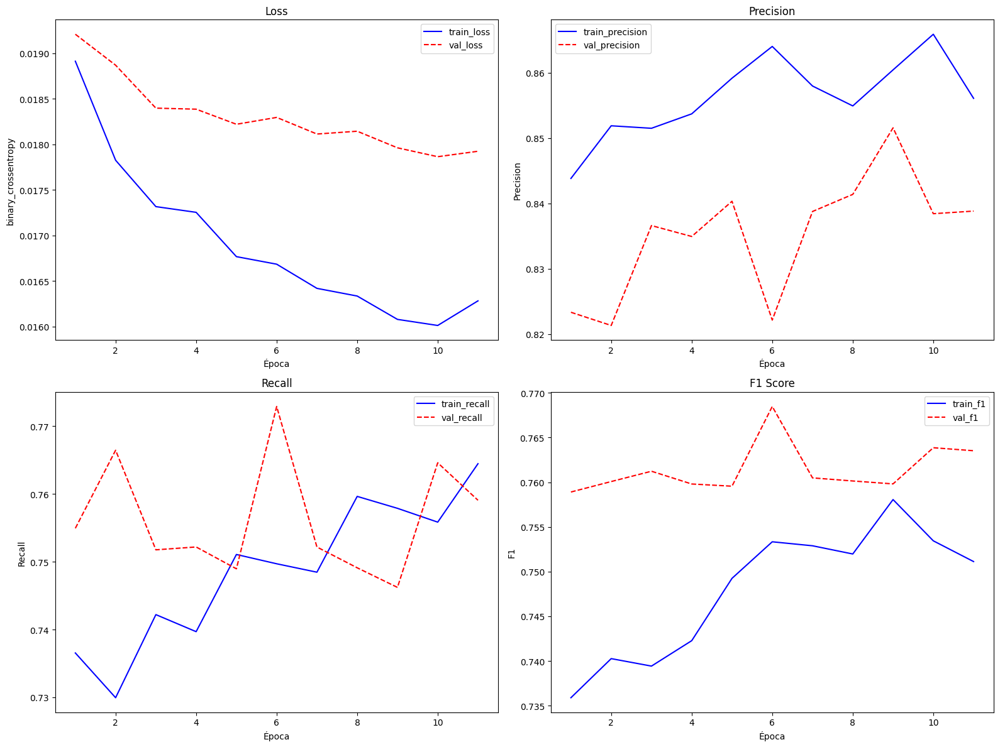

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - f1_score: 0.7418 - loss: 0.0161 - precision: 0.8660 - recall: 0.7731
Resultados en test:
  Loss:      0.0162
  Precision: 0.8579
  Recall:    0.7642
  F1 Score:  0.7508
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


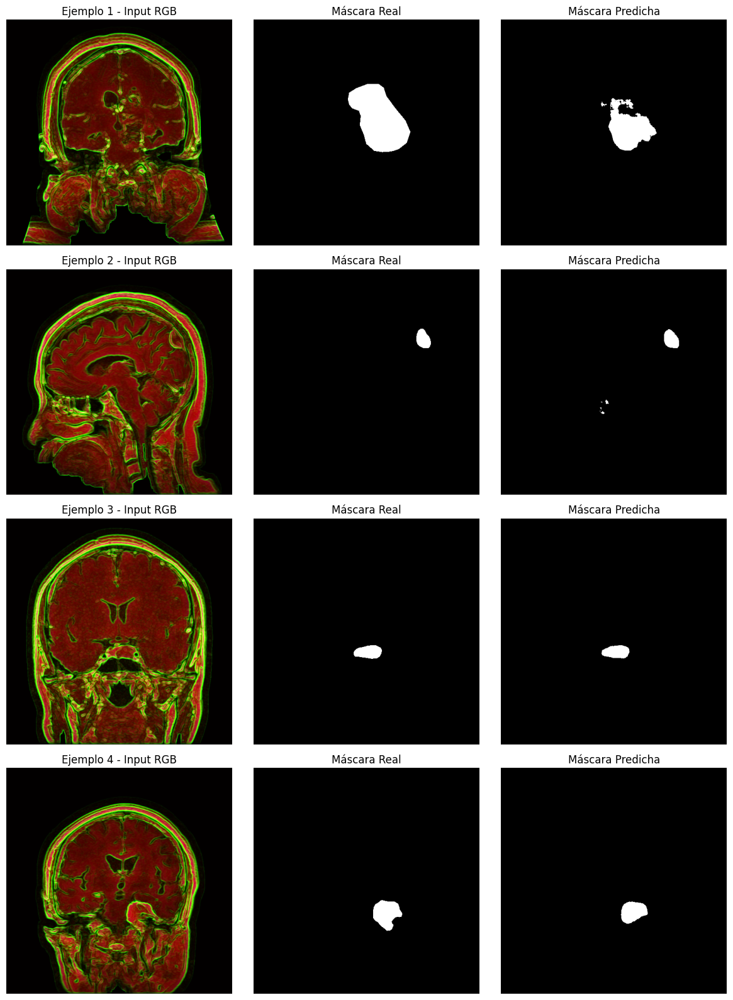

In [ ]:
# ---------------------------------------
# 1) Plot the training history
# ---------------------------------------
# Assume that `history_finetune` comes from unet_rgb.fit(...)
hist = history_finetune.history

epochs = range(1, len(hist["loss"]) + 1)

plt.figure(figsize=(16, 12))

# Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, hist["loss"], "b-", label="train_loss")
plt.plot(epochs, hist["val_loss"], "r--", label="val_loss")
plt.title("Loss")
plt.xlabel("Época")
plt.ylabel("binary_crossentropy")
plt.legend()

# Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, hist["precision"], "b-", label="train_precision")
plt.plot(epochs, hist["val_precision"], "r--", label="val_precision")
plt.title("Precision")
plt.xlabel("Época")
plt.ylabel("Precision")
plt.legend()

# Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, hist["recall"], "b-", label="train_recall")
plt.plot(epochs, hist["val_recall"], "r--", label="val_recall")
plt.title("Recall")
plt.xlabel("Época")
plt.ylabel("Recall")
plt.legend()

# F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs, hist["f1_score"], "b-", label="train_f1")
plt.plot(epochs, hist["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score")
plt.xlabel("Época")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ---------------------------------------
# 2) Evaluate on the test dataset
# ---------------------------------------
results = unet_rgb.evaluate(test_rgb_ds)
print("Resultados en test:")
print(f"  Loss:      {results[0]:.4f}")
print(f"  Precision: {results[1]:.4f}")
print(f"  Recall:    {results[2]:.4f}")
print(f"  F1 Score:  {results[3]:.4f}")

# ---------------------------------------
# 3) Take 4 random images from the test set for comparison
# ---------------------------------------
# Unbatch + shuffle to select 4 examples
samples = test_rgb_ds.unbatch().shuffle(buffer_size=100).take(4)

# Set up figure with 4 rows × 3 columns
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples):
    # img_rgb: float32 [0,1], shape=(H,W,3); true_mask: float32 [0,1], shape=(H,W,1)
    # 1) Predict
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]  # shape=(H,W)
    pred_bin = (pred > 0.5).astype(np.uint8)

    # 2) Convert tensors to numpy
    img_np = img_rgb.numpy()  # (H,W,3)
    mask_np = true_mask.numpy()[..., 0]  # (H,W)

    # 3) Display original (RGB variants), true mask, and predicted mask
    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Original (RGB)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Ejemplo {i+1} - Input RGB")
    ax_img.axis("off")

    # True mask (binary)
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("Máscara Real")
    ax_mask.axis("off")

    # Predicted mask (binary)
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Máscara Predicha")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


Epoch 1/50
    269/Unknown 128s 357ms/step - f1_score: 0.7964 - loss: 0.0136 - precision: 0.8858 - recall: 0.8162

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


269/269 ━━━━━━━━━━━━━━━━━━━━ 141s 404ms/step - f1_score: 0.7964 - loss: 0.0136 - precision: 0.8858 - recall: 0.8161 - val_f1_score: 0.7360 - val_loss: 0.0189 - val_precision: 0.8551 - val_recall: 0.7230 - learning_rate: 2.0000e-05
Epoch 2/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.7929 - loss: 0.0138 - precision: 0.8836 - recall: 0.8123

269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 294ms/step - f1_score: 0.7929 - loss: 0.0138 - precision: 0.8836 - recall: 0.8123 - val_f1_score: 0.7647 - val_loss: 0.0191 - val_precision: 0.7816 - val_recall: 0.7957 - learning_rate: 2.0000e-05
Epoch 3/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.7966 - loss: 0.0140 - precision: 0.8780 - recall: 0.8096 - val_f1_score: 0.7425 - val_loss: 0.0194 - val_precision: 0.8380 - val_recall: 0.7191 - learning_rate: 2.0000e-05
Epoch 4/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8008 - loss: 0.0139 - precision: 0.8872 - recall: 0.8118 - val_f1_score: 0.7613 - val_loss: 0.0181 - val_precision: 0.8364 - val_recall: 0.7503 - learning_rate: 2.0000e-05
Epoch 5/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.8003 - loss: 0.0136 - precision: 0.8879 - recall: 0.8136 - val_f1_score: 0.7566 - val_loss: 0.0188 - val_precision: 0.8288 - val_recall: 0.7563 - learning_rate: 2.0000e-05
Epoch 6/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 292

269/269 ━━━━━━━━━━━━━━━━━━━━ 88s 296ms/step - f1_score: 0.8164 - loss: 0.0115 - precision: 0.8997 - recall: 0.8405 - val_f1_score: 0.7723 - val_loss: 0.0175 - val_precision: 0.8210 - val_recall: 0.7871 - learning_rate: 1.0000e-05
Epoch 9/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8278 - loss: 0.0114 - precision: 0.9028 - recall: 0.8453 - val_f1_score: 0.7643 - val_loss: 0.0177 - val_precision: 0.8185 - val_recall: 0.7828 - learning_rate: 1.0000e-05
Epoch 10/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 292ms/step - f1_score: 0.8245 - loss: 0.0118 - precision: 0.8946 - recall: 0.8385 - val_f1_score: 0.7620 - val_loss: 0.0178 - val_precision: 0.8470 - val_recall: 0.7524 - learning_rate: 1.0000e-05
Epoch 11/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 292ms/step - f1_score: 0.8184 - loss: 0.0118 - precision: 0.8960 - recall: 0.8421 - val_f1_score: 0.7596 - val_loss: 0.0179 - val_precision: 0.8653 - val_recall: 0.7403 - learning_rate: 1.0000e-05
Epoch 12/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 

269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 295ms/step - f1_score: 0.8319 - loss: 0.0116 - precision: 0.8975 - recall: 0.8428 - val_f1_score: 0.7767 - val_loss: 0.0175 - val_precision: 0.8338 - val_recall: 0.7834 - learning_rate: 5.0000e-06
Epoch 14/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 291ms/step - f1_score: 0.8380 - loss: 0.0110 - precision: 0.9010 - recall: 0.8536 - val_f1_score: 0.7730 - val_loss: 0.0177 - val_precision: 0.8292 - val_recall: 0.7842 - learning_rate: 5.0000e-06
Epoch 15/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 292ms/step - f1_score: 0.8387 - loss: 0.0108 - precision: 0.9005 - recall: 0.8600 - val_f1_score: 0.7765 - val_loss: 0.0178 - val_precision: 0.8125 - val_recall: 0.8047 - learning_rate: 5.0000e-06
Epoch 16/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - f1_score: 0.8301 - loss: 0.0109 - precision: 0.8989 - recall: 0.8504

269/269 ━━━━━━━━━━━━━━━━━━━━ 88s 296ms/step - f1_score: 0.8300 - loss: 0.0109 - precision: 0.8989 - recall: 0.8503 - val_f1_score: 0.7772 - val_loss: 0.0178 - val_precision: 0.8152 - val_recall: 0.7958 - learning_rate: 5.0000e-06
Epoch 17/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 292ms/step - f1_score: 0.8422 - loss: 0.0104 - precision: 0.9033 - recall: 0.8601 - val_f1_score: 0.7767 - val_loss: 0.0179 - val_precision: 0.8016 - val_recall: 0.8106 - learning_rate: 5.0000e-06
Epoch 18/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 292ms/step - f1_score: 0.8419 - loss: 0.0108 - precision: 0.9052 - recall: 0.8645 - val_f1_score: 0.7727 - val_loss: 0.0179 - val_precision: 0.8361 - val_recall: 0.7750 - learning_rate: 5.0000e-06
Epoch 19/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - f1_score: 0.8367 - loss: 0.0106 - precision: 0.9029 - recall: 0.8603

269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 294ms/step - f1_score: 0.8366 - loss: 0.0106 - precision: 0.9029 - recall: 0.8602 - val_f1_score: 0.7812 - val_loss: 0.0178 - val_precision: 0.8126 - val_recall: 0.8009 - learning_rate: 5.0000e-06
Epoch 20/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 292ms/step - f1_score: 0.8435 - loss: 0.0104 - precision: 0.9007 - recall: 0.8624 - val_f1_score: 0.7763 - val_loss: 0.0180 - val_precision: 0.8197 - val_recall: 0.7906 - learning_rate: 5.0000e-06
Epoch 21/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 87s 292ms/step - f1_score: 0.8438 - loss: 0.0101 - precision: 0.9079 - recall: 0.8650 - val_f1_score: 0.7665 - val_loss: 0.0177 - val_precision: 0.8610 - val_recall: 0.7448 - learning_rate: 5.0000e-06
Epoch 22/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s 290ms/step - f1_score: 0.8350 - loss: 0.0100 - precision: 0.9074 - recall: 0.8572 - val_f1_score: 0.7711 - val_loss: 0.0181 - val_precision: 0.8265 - val_recall: 0.7805 - learning_rate: 5.0000e-06
Epoch 23/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 86s

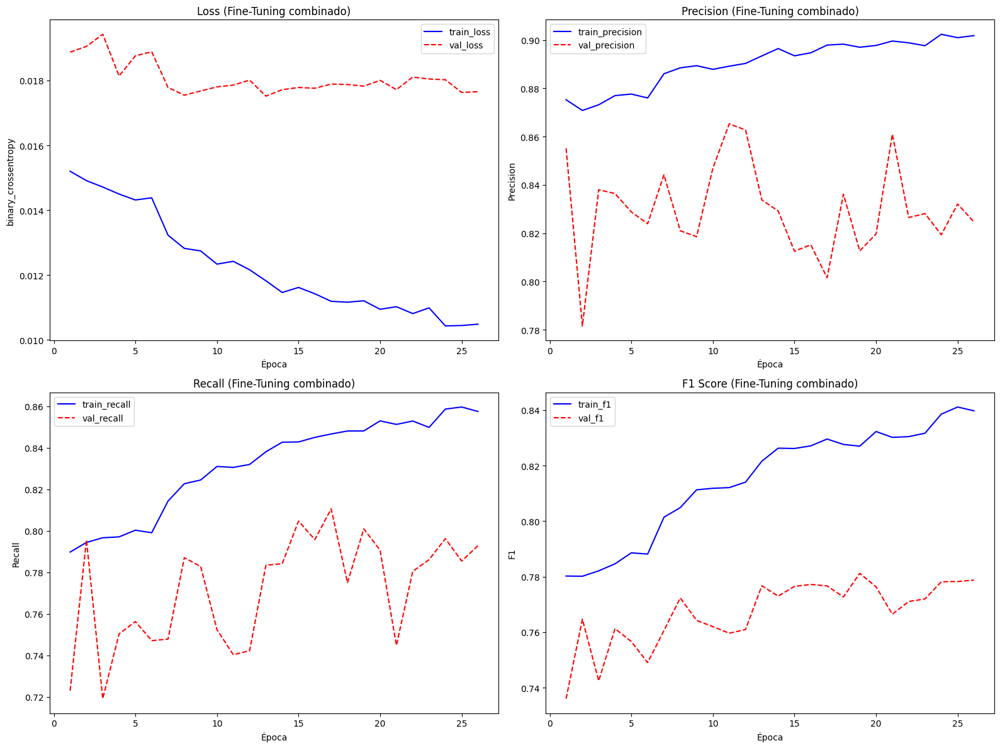

58/58 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - f1_score: 0.7553 - loss: 0.0158 - precision: 0.8628 - recall: 0.7873

Resultados en test (dataset combinado):
  Loss:      0.0159
  Precision: 0.8587
  Recall:    0.7792
  F1 Score:  0.7634
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


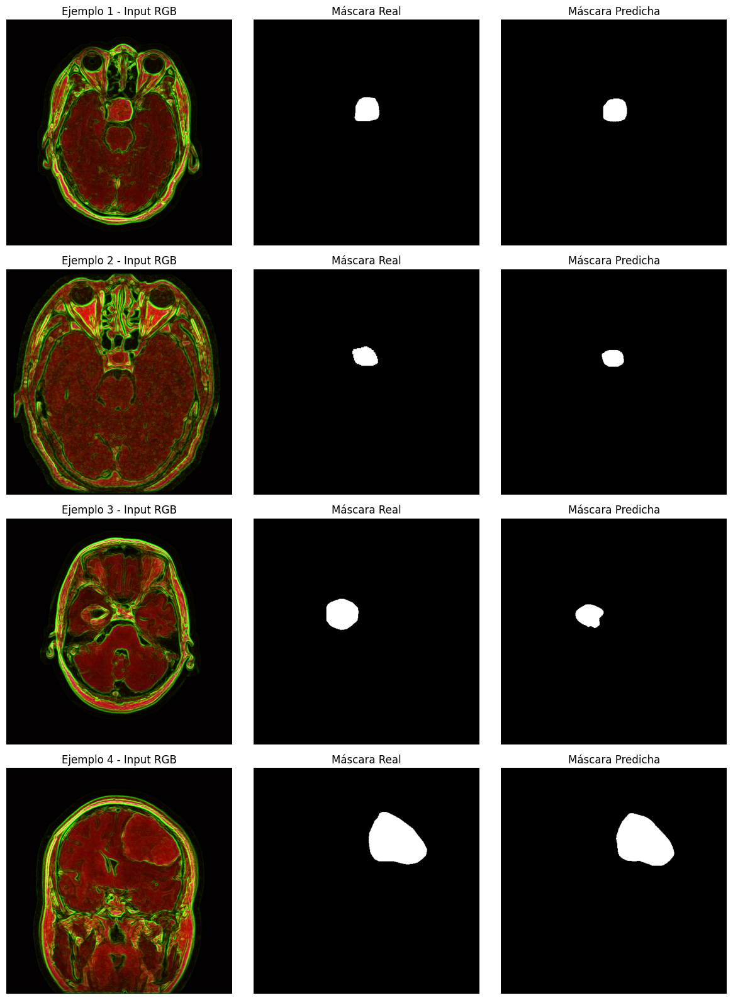

In [ ]:
# ----------------------------------------------------------
# 1) Combine the two training sets into a single one
# ----------------------------------------------------------
# Concatenate train_v1_rgb_ds and train_v2_rgb_ds:
train_combined_ds = train_v1_rgb_ds.concatenate(train_v2_rgb_ds)

# Shuffle a bit and re-batch into equal batches
# to ensure the order is random each epoch:
train_combined_ds = (
    train_combined_ds
    .unbatch()
    .shuffle(buffer_size=1000, seed=SEED)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# ----------------------------------------------------------
# 2) Reduce the learning rate for fine-tuning
# ----------------------------------------------------------
# Lower the learning rate slightly to avoid destabilizing the model
unet_rgb.optimizer.learning_rate.assign(2e-5)

# ----------------------------------------------------------
# 3) Recompile the model to refresh metrics
# ----------------------------------------------------------
# Redefine Precision, Recall, and F1 Score metrics
precision_metric = tf.keras.metrics.Precision(name="precision")
recall_metric    = tf.keras.metrics.Recall(name="recall")

def f1_score(y_true, y_pred):
    """
    Compute batch-level F1:
    f1 = 2 * (precision * recall) / (precision + recall)
    """
    y_pred_bin = tf.round(y_pred)
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred_bin, tf.float32)

    tp = tf.reduce_sum(y_true_f * y_pred_f, axis=[1,2,3])
    fp = tf.reduce_sum((1 - y_true_f) * y_pred_f, axis=[1,2,3])
    fn = tf.reduce_sum(y_true_f * (1 - y_pred_f), axis=[1,2,3])

    f1 = 2 * tp / (2 * tp + fp + fn + 1e-7)
    return tf.reduce_mean(f1)

# Recompile, keeping binary_crossentropy as the loss
unet_rgb.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
    loss="binary_crossentropy",
    metrics=[precision_metric, recall_metric, f1_score]
)

# ----------------------------------------------------------
# 4) Callbacks: prioritize val_f1 but with precision control
# ----------------------------------------------------------
callbacks_ft = [
    # 4.1) Save the best model according to val_f1_score
    tf.keras.callbacks.ModelCheckpoint(
        filepath="best_unet_rgb_combined.h5",
        monitor="val_f1_score",
        mode="max",
        save_best_only=True,
        save_weights_only=False
    ),
    # 4.2) EarlyStopping to prevent overfitting on val_f1_score
    tf.keras.callbacks.EarlyStopping(
        monitor="val_f1_score",
        mode="max",
        patience=7,
        restore_best_weights=True
    ),
    # 4.3) ReduceLROnPlateau to lower lr when val_f1 plateaus
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_f1_score",
        mode="max",
        factor=0.5,
        patience=4,
        min_lr=1e-7
    )
]

# ----------------------------------------------------------
# 5) Train the model using the combined dataset
#    Since we want to emphasize precision,
#    we can monitor both val_f1_score and val_precision.
#    But the checkpoint is tied to val_f1_score to ensure balance.
# ----------------------------------------------------------
history_combined = unet_rgb.fit(
    train_combined_ds,
    epochs=50,
    validation_data=val_rgb_ds,
    callbacks=callbacks_ft
)

# ----------------------------------------------------------
# 6) Plot the new training history
# ----------------------------------------------------------
hist_ft = history_combined.history
epochs_ft = range(1, len(hist_ft["loss"]) + 1)

import matplotlib.pyplot as plt

plt.figure(figsize=(16, 12))

# 6.1) Loss
plt.subplot(2, 2, 1)
plt.plot(epochs_ft, hist_ft["loss"], "b-", label="train_loss")
plt.plot(epochs_ft, hist_ft["val_loss"], "r--", label="val_loss")
plt.title("Loss (Combined Fine-Tuning)")
plt.xlabel("Epoch")
plt.ylabel("binary_crossentropy")
plt.legend()

# 6.2) Precision
plt.subplot(2, 2, 2)
plt.plot(epochs_ft, hist_ft["precision"], "b-", label="train_precision")
plt.plot(epochs_ft, hist_ft["val_precision"], "r--", label="val_precision")
plt.title("Precision (Combined Fine-Tuning)")
plt.xlabel("Epoch")
plt.ylabel("Precision")
plt.legend()

# 6.3) Recall
plt.subplot(2, 2, 3)
plt.plot(epochs_ft, hist_ft["recall"], "b-", label="train_recall")
plt.plot(epochs_ft, hist_ft["val_recall"], "r--", label="val_recall")
plt.title("Recall (Combined Fine-Tuning)")
plt.xlabel("Epoch")
plt.ylabel("Recall")
plt.legend()

# 6.4) F1 Score
plt.subplot(2, 2, 4)
plt.plot(epochs_ft, hist_ft["f1_score"], "b-", label="train_f1")
plt.plot(epochs_ft, hist_ft["val_f1_score"], "r--", label="val_f1")
plt.title("F1 Score (Combined Fine-Tuning)")
plt.xlabel("Epoch")
plt.ylabel("F1")
plt.legend()

plt.tight_layout()
plt.show()

# ----------------------------------------------------------
# 7) Evaluate on the test set
# ----------------------------------------------------------
results_combined = unet_rgb.evaluate(test_rgb_ds)
print("\nTest results (combined dataset):")
print(f"  Loss:      {results_combined[0]:.4f}")
print(f"  Precision: {results_combined[1]:.4f}")
print(f"  Recall:    {results_combined[2]:.4f}")
print(f"  F1 Score:  {results_combined[3]:.4f}")

# ----------------------------------------------------------
# 8) Visualize 4 random test examples (input, true mask, predicted mask)
# ----------------------------------------------------------
# Unbatch + shuffle to take 4 random samples
samples_test = test_rgb_ds.unbatch().shuffle(buffer_size=1000).take(4)

fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for i, (img_rgb, true_mask) in enumerate(samples_test):
    # Predict on a sample (expand_dims adds batch dimension)
    pred = unet_rgb.predict(tf.expand_dims(img_rgb, 0))[0, ..., 0]
    pred_bin = (pred > 0.5).astype(np.uint8)

    img_np = img_rgb.numpy()
    mask_np = true_mask.numpy()[..., 0]

    ax_img = axes[i, 0]
    ax_mask = axes[i, 1]
    ax_pred = axes[i, 2]

    # Display input (RGB variants)
    ax_img.imshow(img_np)
    ax_img.set_title(f"Example {i+1} - Input RGB")
    ax_img.axis("off")

    # Display true mask
    ax_mask.imshow(mask_np, cmap="gray")
    ax_mask.set_title("True Mask")
    ax_mask.axis("off")

    # Display predicted mask
    ax_pred.imshow(pred_bin, cmap="gray")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()
